$\textbf{Introduction and Exercise}$

This is a study of automobile demand, as a function of disposable income, US mortage rates and the rate of change of automobile prices.

First lets read in the data from the spread sheets.

We examine the demand for automobiles with US monthly data.  The data set includes two periods of crisis, the Global Financial Crisis and the COVID19 Pandemic. 
In this notebook we compare the forecasting performance of the simple linear model and the neural network model.

Your exercise is to compare the forecasting performance of the two methods when we leave out the period of the global pandemic, ie use the data set only up until 2000.01.

In python, for each array, eliminate the last 20 observations so we end before the start of the Pandemic. 
The way to do this is easy:
n = 20
a1 = a[:-20,:]
You can do that in Cell 11 for x and y.  In other words, forecast only in normal times.

For the full sample we are forecasting with a period high instability taking place at the end of sample and to a lesser extent at the time of the Global Financial Crisis.  I attach a paper by Barbara Rossi about measures to evaluate forecasting performance in such periods.  The Root Mean Squared error may not be the best way.

You can also examine the forecasting performance of the Neural Net methods under alternative assumptions of the activation functions as well as the number of layers and the number of neurons in each layer.

In [1]:

import pandas as pd
import os, sys, re, datetime
from datetime import datetime 
import time
from datetime import datetime, date, time, timedelta

df1 = pd.read_excel('AutoPrices.xls', header=0, names=['observation_date','CUSR0000SETA01'],
                   parse_dates=['observation_date']).iloc[10:]
df1.set_index('observation_date', inplace=True)
df1.index= pd.to_datetime(df1.index)

df2 = pd.read_excel('DAUPSA.xls', header=0, names=['observation_date','DAUPSA'],
                   parse_dates=['observation_date']).iloc[10:]
df2.set_index('observation_date', inplace=True)
df2.index= pd.to_datetime(df2.index)

df3 = pd.read_excel('DisposIncome.xls', header=0, names=['observation_date','DSPIC96'],
                    parse_dates=['observation_date']).iloc[10:]
df3.set_index('observation_date', inplace=True)
df3.index= pd.to_datetime(df3.index)



df4 = pd.read_excel('MORTGAGE15US.xls', header=0, names=['observation_date','MORTGAGE15US'], 
                    parse_dates=['observation_date']).iloc[10:]
df4.set_index('observation_date', inplace=True)
df4.index= pd.to_datetime(df4.index)
df4 = df4.resample('M').last()
df4.index=df4.index+timedelta(days=1)


In [2]:
df1_2 = pd.merge(df1, df2, left_index=True, right_index=True)
df1_2_3 =pd.merge(df1_2, df3, left_index=True, right_index=True)
df =pd.merge(df1_2_3, df4, left_index=True, right_index=True)
df

,CUSR0000SETA01,DAUPSA,DSPIC96,MORTGAGE15US
observation_date,,,,
1993-01-01,130.9,512.9,7237.6,7.68
1993-02-01,131.1,503.8,7271.8,7.37
1993-03-01,131.3,498.1,7249.2,7.02
1993-04-01,131.7,510.2,7286.8,7.01
1993-05-01,132.2,512.8,7276.3,6.91
...,...,...,...,...
2021-05-01,151.693,128.1,15598.1,2.31
2021-06-01,154.68,120.3,15517.7,2.27
2021-07-01,157.34,142.2,15617.6,2.34


In [3]:
df = df.rename({'CUSR0000SETA01':'AutoPrice', 'DAUPSA':'AutoProd','DSPIC96':'DisIncome', 'MORTGAGE15US':'MortRate'}, axis=1)
df

,AutoPrice,AutoProd,DisIncome,MortRate
observation_date,,,,
1993-01-01,130.9,512.9,7237.6,7.68
1993-02-01,131.1,503.8,7271.8,7.37
1993-03-01,131.3,498.1,7249.2,7.02
1993-04-01,131.7,510.2,7286.8,7.01
1993-05-01,132.2,512.8,7276.3,6.91
...,...,...,...,...
2021-05-01,151.693,128.1,15598.1,2.31
2021-06-01,154.68,120.3,15517.7,2.27
2021-07-01,157.34,142.2,15617.6,2.34


In [4]:
df = df.astype(dtype={'AutoPrice':float,'AutoProd':float,'DisIncome':float, 'MortRate':float})

In [5]:
df.head(20)

,AutoPrice,AutoProd,DisIncome,MortRate
observation_date,,,,
1993-01-01,130.9,512.9,7237.6,7.68
1993-02-01,131.1,503.8,7271.8,7.37
1993-03-01,131.3,498.1,7249.2,7.02
1993-04-01,131.7,510.2,7286.8,7.01
1993-05-01,132.2,512.8,7276.3,6.91
1993-06-01,132.3,489.5,7262.9,6.99
1993-07-01,132.9,468.1,7281.2,6.84
1993-08-01,133.4,457.1,7291.8,6.75
1993-09-01,133.6,441.7,7271.9,6.49


- lets start from 94


In [6]:
df_cur = df.iloc[12:] # shift one year later
df_prev = df.iloc[:-12] 
df.shape, df_cur.shape, df_prev.shape

((345, 4), (333, 4), (333, 4))

Now let's pick out the arrays and look at the data, we see the deep drop in Mortgage Rates after 2010

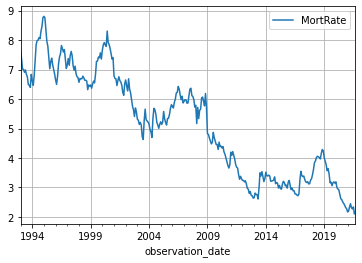

In [7]:
#!pip install --upgrade matplotlib
import matplotlib.pyplot as plt

df.plot(y='MortRate')
plt.grid(True)

## Data Transformation

In [8]:
import numpy as np
df_transformed = pd.DataFrame(columns=df.columns)
for col in df.columns:
    df_transformed[col] =  np.log(df_cur[col].values) - np.log(df_prev[col].values)
    print(df_cur[col].values.shape)
df_transformed.index = df_cur.index

(333,)
(333,)
(333,)
(333,)


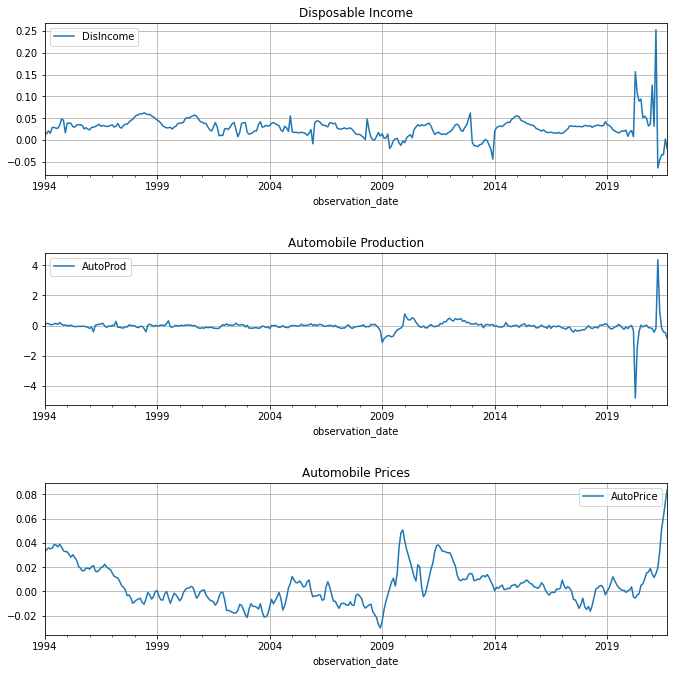

In [9]:
import matplotlib.pyplot as plt
#!pip install tensorflow
#import tensorflow as tf
fig,axes = plt.subplots(nrows=3,figsize=(10,10))
ax = axes[0]
df_transformed.plot(ax=ax,title='Disposable Income', y='DisIncome')
ax.grid(True)
ax = axes[1]
df_transformed.plot(ax=ax,y='AutoProd', title='Automobile Production')
ax.grid(True)
ax = axes[2]
df_transformed.plot(ax=ax,y='AutoPrice', title='Automobile Prices')
ax.grid(True)
fig.tight_layout(pad=3.0)


In [10]:
 df_transformed.iloc[12:]

,AutoPrice,AutoProd,DisIncome,MortRate
observation_date,,,,
1995-01-01,0.032718,-0.001736,0.038708,0.284283
1995-02-01,0.030481,-0.012928,0.038805,0.303020
1995-03-01,0.028253,0.031404,0.038250,0.204141
1995-04-01,0.030327,-0.036327,0.030809,0.086555
1995-05-01,0.028069,-0.065408,0.029413,-0.006390
...,...,...,...,...
2021-05-01,0.032890,0.969188,-0.046038,-0.181600
2021-06-01,0.051273,-0.156641,-0.034182,-0.143394
2021-07-01,0.061663,-0.418044,-0.033639,-0.101507


In [11]:

YY = df_transformed
rr,cc = YY.shape
print(rr,cc)

333 4


In [12]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import grangercausalitytests
import arch
from statsmodels.tsa.api import VAR
numlags = 5
Mdl= VAR(YY)
EstMdl = Mdl.fit(numlags)
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(EstMdl.resid)


C:\Users\mcnel\.julia\conda\3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [13]:
ERROR = EstMdl.resid
B = EstMdl.coefs
print(B.shape)
print(YY.shape)


(5, 4, 4)
(333, 4)


In [14]:
for i in [1,2,3,4,5,6,7,8,9]:
    result = Mdl.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic, '\n')

Lag Order = 1
AIC :  -26.70188278475978
BIC :  -26.47265778663228
FPE :  2.5323492805637588e-12
HQIC:  -26.6104679817069 

Lag Order = 2
AIC :  -27.239142261019875
BIC :  -26.82561881233838
FPE :  1.4798377961318436e-12
HQIC:  -27.074211559097662 

Lag Order = 3
AIC :  -27.255131359125667
BIC :  -26.656486455998554
FPE :  1.4565242325581516e-12
HQIC:  -27.016340593948225 

Lag Order = 4
AIC :  -27.222703854229007
BIC :  -26.438108331274464
FPE :  1.5048387513643582e-12
HQIC:  -26.909706266356608 

Lag Order = 5
AIC :  -27.2577761486419
BIC :  -26.286394614787422
FPE :  1.4534594519556778e-12
HQIC:  -26.870222356797516 

Lag Order = 6
AIC :  -27.214535613523328
BIC :  -26.055526386949243
FPE :  1.5184367325409019e-12
HQIC:  -26.752073587459527 

Lag Order = 7
AIC :  -27.170237890557036
BIC :  -25.82275293277011
FPE :  1.5883081392413514e-12
HQIC:  -26.63251292356775 

Lag Order = 8
AIC :  -27.122857928511003
BIC :  -25.586042777534
FPE :  1.6669110310349956e-12
HQIC:  -26.50951260958252

In [15]:
numlags = 4
EstMdl = Mdl.fit(numlags)
Error = EstMdl.resid
Sigma = np.dot(Error.T, Error)
sigma =  Sigma/(Error.shape[0]-Error.shape[1])


In [16]:
#Granger-Causality Test
pvals=[]
hs=[]
rRange,cRange = YY.shape
for i in range(cRange):
    for j in range(cRange):
         gcresult = grangercausalitytests(YY.iloc[:, [i, j]], maxlag=numlags)
         pvals.append(gcresult[1][0]['params_ftest'][1])
         hs.append(gcresult[1][0]['params_ftest'][1] >= 0.05)
        


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0000  , p=1.0000  , df_denom=330, df_num=1
ssr based chi2 test:   chi2=0.0000  , p=1.0000  , df=1
likelihood ratio test: chi2=-0.0000 , p=1.0000  , df=1
parameter F test:         F=4404.5519, p=0.0000  , df_denom=330, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=-0.0000 , p=1.0000  , df_denom=328, df_num=2
ssr based chi2 test:   chi2=-0.0000 , p=1.0000  , df=2
likelihood ratio test: chi2=-0.0000 , p=1.0000  , df=2
parameter F test:         F=2845.8284, p=0.0000  , df_denom=328, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.0000  , p=1.0000  , df_denom=326, df_num=3
ssr based chi2 test:   chi2=0.0000  , p=1.0000  , df=3
likelihood ratio test: chi2=-0.0000 , p=1.0000  , df=3
parameter F test:         F=1958.8746, p=0.0000  , df_denom=326, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.0000  , p=1.000

In [17]:
Names = ['Price','Production','Income','Mortgage']
hs = np.array(hs)
HS = hs.reshape(4,4)
print(Names)
print(HS)

['Price', 'Production', 'Income', 'Mortgage']
[[False  True  True False]
 [False False False  True]
 [False False False  True]
 [ True  True  True False]]


In [18]:
y = df_transformed.iloc[12:]['AutoProd']
normalized_y=(y-y.min())/(y.max()-y.min()) #[0,1]

x = df_transformed.iloc[:-12]
normalized_x=(x-x.min())/(x.max()-x.min())

In [19]:
ry = len(y)
ry
rr, rc = x.shape
print(rr,rc)
print(y)

321 4
observation_date
1995-01-01   -0.001736
1995-02-01   -0.012928
1995-03-01    0.031404
1995-04-01   -0.036327
1995-05-01   -0.065408
                ...   
2021-05-01    0.969188
2021-06-01   -0.156641
2021-07-01   -0.418044
2021-08-01   -0.466744
2021-09-01   -0.848993
Name: AutoProd, Length: 321, dtype: float64


Lets do a split of in and out of sample with ols.  Let 85 percent of the sample be for estimaition and the last for the final test of root mean squared error.  He calculate the Hanan-Quinn information criteria for the insample performance with zero lags.

In [20]:
import statsmodels.api as sm
nn = 85*len(y)//100

xin = x.iloc[:nn]
yin = y.iloc[:nn]

xout = x.iloc[nn:]
yout = y.iloc[nn:]

mod = sm.OLS(yin.values, xin.values)
res = mod.fit()

B  = res.params
print(x.columns),
print(B)

yhat_in = np.dot(xin.values, np.expand_dims(B,axis=1))
ehat = yin.values - np.squeeze(yhat_in)
sse = np.dot(ehat.T, ehat)/nn;
hqif =  -2 * np.log(sse) + 2 *len(B)*np.log(np.log(len(xin)))
hqif

Index(['AutoPrice', 'AutoProd', 'DisIncome', 'MortRate'], dtype='object')
[ 3.74363934 -0.36630907 -1.40972822 -0.170074  ]


20.564703774492784

Now lets try the in sample with  lags from zero to 42 to see which lag structure is better


We have the aif bif and the hqif.  They show us that the best, in terms of lowest value, is for zero lags. 

In [21]:
from statsmodels.tsa.tsatools import lagmat
lags = [0,1,2,3,4,5,6,12,24,36,42];
print('lag, hqif, aif, bif')
for i, lag in enumerate(lags):
    
    x11 = lagmat(xin,maxlag=lag, trim="forward", original='in');
    #print('x11',x11.shape)
    
    y11 = yin.iloc[lag:]
    x21 = x11[lag:]
    Y = y11; X = x21;
              
    mod = sm.OLS(X, Y.values)
    res = mod.fit()
    B  = res.params
    
    yhat_in = np.dot(X, B.reshape(-1,1))
    ehat = Y.values - np.squeeze(yhat_in)
    sse = np.dot(ehat.T, ehat)/nn;
    hqif =  -2 * np.log(sse) + 2 *len(B)*np.log(np.log(len(X)))
    aif = -2 * np.log(sse) + 2 *len(B)*np.log(len(X));
    bif  = -2 * np.log(sse) + 2 *len(B)*len(X);
    print('{}: {:.2f}, {:.2f}, {:.2f}'.format(lag,hqif,aif,bif))
#     end
#     hqif1
#     aif1
#     bif1


lag, hqif, aif, bif
0: 9.97, 17.74, 550.53
1: 9.89, 17.65, 548.45
2: 9.77, 17.52, 546.32
3: 9.66, 17.41, 544.22
4: 9.59, 17.33, 542.14
5: 9.61, 17.34, 540.16
6: 9.69, 17.42, 538.25
12: 9.11, 16.80, 525.68
24: 7.11, 14.72, 499.69
36: 6.05, 13.59, 474.66
42: 5.98, 13.47, 462.59


We do the regression for the insample and do the out of sample by multiplying the Bols to the out of sample xout to get 
the prediction yhat_out.  We calculate the error and the Root mean squared error.  We get the value of 0.8722

In [22]:
  
mod = sm.OLS(yin.values, xin.values)
res = mod.fit()

B  = res.params

yhat_out = np.dot(xout.values, np.expand_dims(B,axis=1))
error_out = yout.values - np.squeeze(yhat_out)
sse = np.mean(error_out**2)
rmsq = sse**.5
rmsq


0.8722451541683683

In [23]:
lag_best = 4
xmatrix = lagmat(x,maxlag=lag_best, trim="forward", original='in')
xmatrix2  = xmatrix[lag:,:]

xmatrix1 = sm.add_constant(xmatrix2)

yadj = y[lag:]
xmatrix1_in = xmatrix1[:nn,:]

yadj_in = yadj[:nn]
xmatrix1_out = xmatrix1[nn:,:]

yadj_out = yadj[nn:]
mod = sm.OLS(yadj_in, xmatrix1_in)
res = mod.fit()
B  = res.params
yhat_out = np.dot(xmatrix1_out, np.expand_dims(B,axis=1))
error_out = yadj_out - np.squeeze(yhat_out)


In [24]:
sse = np.mean((error_out ** 2))
rmse_ols = np.sqrt(sse)
rmse_ols

0.9923816077777529

In [25]:
ny = len(yadj)
WL = 100;
TERM = ny - (WL+1)
yadj_rw = np.array(yadj)
xmatrix1_rw = np.array(xmatrix1)
Yhat_out_rw = np.zeros((ny-WL,1))
Error_out_rw = np.zeros((ny-WL,1))


In [26]:
for i in range(1,TERM):
    WLL = WL+(i-1)
    WLLp = WLL +1
    yy = yadj_rw[i:WLL]
    xx = xmatrix1_rw[i:WLL,:]
    xjunk = xmatrix1_rw[WLLp,:]
    mod = sm.OLS(yy, xx)
    res = mod.fit()
    B  = res.params
    Yhat_out_rw[i] = np.dot(xjunk,B)
    Error_out_rw[i] = y[WLLp] - Yhat_out_rw[i]

    
    

In [27]:
sse =  np.mean((Error_out_rw)**2)
rmsq_ols_rw = np.sqrt(sse)
print(rmsq_ols_rw)

0.5924946668347989


In [28]:
xmatrix2_in = xmatrix2[:nn,:]
xmatrix2_out = xmatrix2[nn:,:]

Now lets see if the simple neural network does better out of sample. We feed in the same in and out of sample x and y variables as well as a simple neural net structure

In [29]:
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
#X, y = make_regression(n_samples=200, random_state=1)
regr = MLPRegressor(random_state=1, max_iter=100000, hidden_layer_sizes =(24,), alpha=.1, solver='lbfgs', 
                    activation='logistic').fit(xmatrix2_in, yadj_in)

yhat_out_nn = regr.predict(xmatrix2_out)

Score = regr.score(xmatrix2_out, yadj_out)
sse1 = (1-Score)*np.var(yadj_out)
rmsq_nn1 =  np.sqrt(sse1)
rmsq_nn1






1.213371433883569

We can convert the score function into the RMSQ function.
Score is simply the out of sample $R^2$ variable.  So we can use the score function or calculate the RMSQ (Root mean squared error) directly.

In [30]:

error_nn = yadj_out - yhat_out_nn
sse_nn = np.mean((error_nn **2))
rmsq_nn = np.sqrt(sse_nn)
rmsq_nn

1.213371433883569

We see that the simple neural net does not perform as well. Again we are doing a split in the forecasting.  The better way to evaluate relative performance is with the moving window.

In [31]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
poly_feat = PolynomialFeatures(degree=2)
xmatrix2p = poly_feat.fit_transform(xmatrix2)
xmatrix2p1 =  sm.add_constant(xmatrix2p)
xmatrix2p1_in = xmatrix2p1[:nn,:]
xmatrix2p1_out = xmatrix2p1[nn:,:]
mod = sm.OLS(yadj_in, xmatrix2p1_in)
res = mod.fit()
B  = res.params
yhat_out_poly = np.dot(xmatrix2p1_out, np.expand_dims(B,axis=1))
error_out_poly = yadj_out - np.squeeze(yhat_out_poly)
sse = np.mean((error_out_poly)**2)
rmsq_poly = np.sqrt(sse)
rmsq_poly



97.79451572918022

We see that the polynomial really is very bad, relative to the linear models.  With the lags there is a lot of overfitting going on.  Now lets look at the neurla net with a moving window.

In [32]:
rx,cx = xmatrix2.shape
HOR = rx - WL
Error_out_nn_rw = np.zeros((HOR,1))
yhat_out_nn_rw = np.zeros((HOR,1))
for i in range(1,TERM):
    WLL = WL+(i-1)
    WLLp = WLL +1
    yy = yadj_rw[i:WLL]
    xx = xmatrix2[i:WLL,:]
    xjunk = xmatrix2[WLLp,:]
    regr = MLPRegressor(random_state=1, max_iter=100000, hidden_layer_sizes =(20,10,6,5,4,3,2), alpha=.5, solver='adam', 
                    activation='logistic',warm_start=True).fit(xx, yy)
    xnew = xjunk.reshape(1,cx)
    yhat_out_nn_rw[i,:] = regr.predict(xnew)
    Error_out_nn_rw[i] = yadj_rw[WLLp] - yhat_out_nn_rw[i]

In [33]:
sse = np.mean((Error_out_nn_rw)**2)
rmsq_rw_nn = np.sqrt(sse)
print(rmsq_rw_nn, rmsq_ols_rw)

0.5662798702202052 0.5924946668347989


We see that the neural net outperforms the ols with the moving window forecasting.

In [34]:
weights = regr.coefs_
biases = regr.intercepts_

weights_array = np.concatenate([w.flatten() for w in weights])
biases_array = np.concatenate([b.flatten() for b in biases])

parameters = np.concatenate([weights_array, biases_array])

non_zero_weights_biases = np.count_nonzero(parameters)
print(parameters.shape, non_zero_weights_biases)



(781,) 781


In [35]:
df.index = pd.to_datetime(df.index)
date_index = df.index
ry = yadj_rw.shape
ry
print(date_index.shape, Error_out_nn_rw.shape, HOR, ry)


(345,) (179, 1) 179 (279,)


(179,) (179, 1)


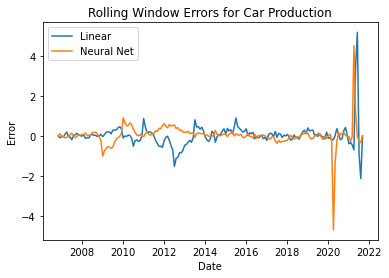

In [36]:
date_index1 = date_index[105:]
rd = date_index1.shape
re = Error_out_nn_rw.shape


start = tuple(rd - re for rd, re in zip(rd, re))
start1 = int(start[0])

date_index2 = date_index1[start1:]
rrd = date_index2.shape
print(rrd, Error_out_nn_rw.shape)
plt.plot(date_index2, Error_out_rw, label='Linear')
plt.plot(date_index2, Error_out_nn_rw, label='Neural Net')
plt.xlabel('Date')
plt.ylabel('Error')
plt.title('Rolling Window Errors for Car Production')
plt.legend()
plt.show()

We picture the graph of the rolling window regressions for the OLS and the Neural Netowrk.
We now use another method, based on the Tensor Flow library.  We have a netowrk of three hidden layers, going from 5,4,3, to the one target variable.

In [37]:
#!pip install tensorflow
import tensorflow as tf

def create_mlp_model(input_dim, l1_reg):
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Dense(20, input_dim=input_dim, activation='sigmoid',
                                    kernel_regularizer=tf.keras.regularizers.l1(l1_reg)))
    model.add(tf.keras.layers.Dense(15, activation='sigmoid',
                                    kernel_regularizer=tf.keras.regularizers.l1(l1_reg)))
    model.add(tf.keras.layers.Dense(10, activation='sigmoid',
                                    kernel_regularizer=tf.keras.regularizers.l1(l1_reg)))
    model.add(tf.keras.layers.Dense(1))
    return model

input_dim = xmatrix2_in.shape[1]
mlp = create_mlp_model(input_dim, l1_reg=0.05)
mlp.compile(optimizer='SGD', loss='mean_squared_error')

history = mlp.fit(xmatrix2_in, yadj_in, epochs=1000, batch_size=32, validation_data=(xmatrix2_out, yadj_out))

Epoch 1/1000
9/9 [==============================] - 0s 18ms/step - loss: 8.9336 - val_loss: 11.8341
Epoch 2/1000
9/9 [==============================] - 0s 4ms/step - loss: 8.7283 - val_loss: 11.5897
Epoch 3/1000
9/9 [==============================] - 0s 3ms/step - loss: 8.5368 - val_loss: 11.3809
Epoch 4/1000
9/9 [==============================] - 0s 4ms/step - loss: 8.3506 - val_loss: 11.1827
Epoch 5/1000
9/9 [==============================] - 0s 3ms/step - loss: 8.1667 - val_loss: 10.9963
Epoch 6/1000
9/9 [==============================] - 0s 2ms/step - loss: 7.9854 - val_loss: 10.8141
Epoch 7/1000
9/9 [==============================] - 0s 4ms/step - loss: 7.8055 - val_loss: 10.6293
Epoch 8/1000
9/9 [==============================] - 0s 5ms/step - loss: 7.6272 - val_loss: 10.4537
Epoch 9/1000
9/9 [==============================] - 0s 3ms/step - loss: 7.4504 - val_loss: 10.2821
Epoch 10/1000
9/9 [==============================] - 0s 4ms/step - loss: 7.2757 - val_loss: 10.1018
Epoch 11

9/9 [==============================] - 0s 3ms/step - loss: 0.3185 - val_loss: 3.2827
Epoch 84/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.3009 - val_loss: 3.2531
Epoch 85/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.2861 - val_loss: 3.2392
Epoch 86/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.2734 - val_loss: 3.2249
Epoch 87/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.2617 - val_loss: 3.2124
Epoch 88/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.2514 - val_loss: 3.2013
Epoch 89/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.2411 - val_loss: 3.1937
Epoch 90/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.2318 - val_loss: 3.1864
Epoch 91/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.2231 - val_loss: 3.1736
Epoch 92/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.2151 - val_loss: 3.1645
Epoch 93/1000
9/9 [=====

9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0912
Epoch 166/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1439 - val_loss: 3.1067
Epoch 167/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1442 - val_loss: 3.0958
Epoch 168/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1441 - val_loss: 3.0947
Epoch 169/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1443 - val_loss: 3.0997
Epoch 170/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.1017
Epoch 171/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0958
Epoch 172/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0946
Epoch 173/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0937
Epoch 174/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1442 - val_loss: 3.0931
Epoch 175/1000


9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0967
Epoch 248/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1439 - val_loss: 3.0927
Epoch 249/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0923
Epoch 250/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1440 - val_loss: 3.0950
Epoch 251/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1439 - val_loss: 3.0956
Epoch 252/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0930
Epoch 253/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0928
Epoch 254/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1439 - val_loss: 3.0950
Epoch 255/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1443 - val_loss: 3.0907
Epoch 256/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.0943
Epoch 257/1000


9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.0933
Epoch 330/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1439 - val_loss: 3.0959
Epoch 331/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0924
Epoch 332/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1439 - val_loss: 3.0944
Epoch 333/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1442 - val_loss: 3.0889
Epoch 334/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0950
Epoch 335/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1441 - val_loss: 3.1075
Epoch 336/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.0988
Epoch 337/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0908
Epoch 338/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1442 - val_loss: 3.0925
Epoch 339/1000


9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.0913
Epoch 412/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0959
Epoch 413/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1439 - val_loss: 3.1028
Epoch 414/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.0993
Epoch 415/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1441 - val_loss: 3.1015
Epoch 416/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.0961
Epoch 417/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1441 - val_loss: 3.0963
Epoch 418/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1438 - val_loss: 3.1064
Epoch 419/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1444 - val_loss: 3.1055
Epoch 420/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.0951
Epoch 421/1000


9/9 [==============================] - 0s 3ms/step - loss: 0.1442 - val_loss: 3.0953
Epoch 494/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1443 - val_loss: 3.0964
Epoch 495/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.0934
Epoch 496/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.1019
Epoch 497/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.1025
Epoch 498/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0966
Epoch 499/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0937
Epoch 500/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0908
Epoch 501/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.0963
Epoch 502/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1442 - val_loss: 3.0967
Epoch 503/1000


9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.0965
Epoch 576/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1441 - val_loss: 3.0966
Epoch 577/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1442 - val_loss: 3.0935
Epoch 578/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0914
Epoch 579/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0980
Epoch 580/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0956
Epoch 581/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1439 - val_loss: 3.1015
Epoch 582/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1442 - val_loss: 3.0988
Epoch 583/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.1012
Epoch 584/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0942
Epoch 585/1000


9/9 [==============================] - 0s 4ms/step - loss: 0.1438 - val_loss: 3.0972
Epoch 658/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.0970
Epoch 659/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.1125
Epoch 660/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1442 - val_loss: 3.1001
Epoch 661/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1439 - val_loss: 3.0983
Epoch 662/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0937
Epoch 663/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.1101
Epoch 664/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.1059
Epoch 665/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.0989
Epoch 666/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0926
Epoch 667/1000


9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.0920
Epoch 740/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1442 - val_loss: 3.0871
Epoch 741/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1443 - val_loss: 3.0953
Epoch 742/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1439 - val_loss: 3.1101
Epoch 743/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1442 - val_loss: 3.1005
Epoch 744/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1439 - val_loss: 3.0974
Epoch 745/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1439 - val_loss: 3.0983
Epoch 746/1000
9/9 [==============================] - 0s 5ms/step - loss: 0.1442 - val_loss: 3.1135
Epoch 747/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1441 - val_loss: 3.1031
Epoch 748/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1440 - val_loss: 3.0992
Epoch 749/1000


9/9 [==============================] - 0s 3ms/step - loss: 0.1442 - val_loss: 3.0954
Epoch 822/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0967
Epoch 823/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0979
Epoch 824/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0971
Epoch 825/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0957
Epoch 826/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.1054
Epoch 827/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0999
Epoch 828/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1441 - val_loss: 3.1007
Epoch 829/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1440 - val_loss: 3.1144
Epoch 830/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1441 - val_loss: 3.1005
Epoch 831/1000


9/9 [==============================] - 0s 3ms/step - loss: 0.1442 - val_loss: 3.0890
Epoch 904/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1442 - val_loss: 3.0905
Epoch 905/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1440 - val_loss: 3.0896
Epoch 906/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0919
Epoch 907/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0930
Epoch 908/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1440 - val_loss: 3.0961
Epoch 909/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1441 - val_loss: 3.0936
Epoch 910/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0996
Epoch 911/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.0986
Epoch 912/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1439 - val_loss: 3.0967
Epoch 913/1000


9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0921
Epoch 986/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1442 - val_loss: 3.0984
Epoch 987/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1440 - val_loss: 3.0915
Epoch 988/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1442 - val_loss: 3.0885
Epoch 989/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1440 - val_loss: 3.0877
Epoch 990/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1440 - val_loss: 3.0892
Epoch 991/1000
9/9 [==============================] - 0s 3ms/step - loss: 0.1442 - val_loss: 3.0856
Epoch 992/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1441 - val_loss: 3.0909
Epoch 993/1000
9/9 [==============================] - 0s 4ms/step - loss: 0.1441 - val_loss: 3.0905
Epoch 994/1000
9/9 [==============================] - 0s 2ms/step - loss: 0.1442 - val_loss: 3.0897
Epoch 995/1000


In [38]:
yhat_out= mlp.predict(xmatrix2_out)

yhat_out = yhat_out.ravel()



ERROR = yadj_out - yhat_out


1/1 [==============================] - 0s 59ms/step


In [39]:
sse = np.mean(ERROR**2)
rmsq_nn1 = np.sqrt(sse)
rmsq_nn1

1.7562227516635245

We see that this network does not do as well as the eariler more complex one with more neurons. Now lets try it with the rollwing-window (RW) regression.

In [98]:
rx,cx = xmatrix2.shape
HOR = rx - WL
Error_out_nn_rw_tf = np.zeros((HOR,1))
yhat_out_nn_rw = np.zeros((HOR,1))
for i in range(1,TERM):
    WLL = WL+(i-1)
    WLLp = WLL +1
    yy = yadj_rw[i:WLL]
    xx = xmatrix2[i:WLL,:]
    xjunk = xmatrix2[WLLp,:]
    yjunk = yadj_rw[WLLp]
    xnew = xjunk.reshape(1,cx)
    xx = tf.convert_to_tensor(xx)
    yy = tf.convert_to_tensor(yy)
    xnew1 = tf.convert_to_tensor(xnew)
    yjunk1 = tf.convert_to_tensor(yjunk)
    history = mlp.fit(xx, yy, epochs=1000, batch_size=32)
    yhat_out_nn_rw[i,:] = regr.predict(xnew)
    Error_out_nn_rw_tf[i] = yadj_rw[WLLp] - yhat_out_nn_rw[i]

Epoch 1/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0197
Epoch 2/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0193
Epoch 3/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0191
Epoch 4/1000
4/4 [==============================] - 0s 689us/step - loss: 0.0190
Epoch 5/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 6/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0190
Epoch 7/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 8/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 9/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0190
Epoch 10/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0191
Epoch 11/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0191
Epoch 12/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 13/1000
4/4 [==============================]

4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 104/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 105/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 106/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 107/1000
4/4 [==============================] - 0s 284us/step - loss: 0.0190
Epoch 108/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 109/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 110/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 111/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 112/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 113/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 114/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 115/1000
4/4 [==========================

4/4 [==============================] - 0s 998us/step - loss: 0.0190
Epoch 205/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 206/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0190
Epoch 207/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 208/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 209/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 210/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 211/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 212/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 213/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 214/1000
4/4 [==============================] - 0s 317us/step - loss: 0.0190
Epoch 215/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 216/1000
4/4 [====================

4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 407/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 408/1000
4/4 [==============================] - 0s 412us/step - loss: 0.0190
Epoch 409/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 410/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 411/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 412/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 413/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 414/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 415/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 416/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 417/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0191
Epoch 418/1000
4/4 [===================

Epoch 507/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 508/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 509/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 510/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 511/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0191
Epoch 512/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0191
Epoch 513/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 514/1000
4/4 [==============================] - 0s 988us/step - loss: 0.0190
Epoch 515/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 516/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 517/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 518/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 519/1000
4/4 [====

4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 709/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 710/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 711/1000
4/4 [==============================] - 0s 107us/step - loss: 0.0190
Epoch 712/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 713/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 714/1000
4/4 [==============================] - 0s 347us/step - loss: 0.0190
Epoch 715/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 716/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 717/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 718/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 719/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 720/1000
4/4 [=========================

4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 911/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0190
Epoch 912/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0190
Epoch 913/1000
4/4 [==============================] - 0s 996us/step - loss: 0.0190
Epoch 914/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 915/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0190
Epoch 916/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 917/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 918/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 919/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0190
Epoch 920/1000
4/4 [==============================] - 0s 611us/step - loss: 0.0190
Epoch 921/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 922/1000
4/4 [==========

4/4 [==============================] - 0s 183us/step - loss: 0.0190
Epoch 12/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 13/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 14/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 15/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 16/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 17/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 18/1000
4/4 [==============================] - 0s 664us/step - loss: 0.0190
Epoch 19/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 20/1000
4/4 [==============================] - 0s 725us/step - loss: 0.0191
Epoch 21/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 22/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 23/1000
4/4 [======================

4/4 [==============================] - 0s 311us/step - loss: 0.0190
Epoch 213/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 214/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 215/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 216/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 217/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0190
Epoch 218/1000
4/4 [==============================] - 0s 668us/step - loss: 0.0190
Epoch 219/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 220/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 221/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 222/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 223/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 224/1000
4/4 [=========================

4/4 [==============================] - 0s 876us/step - loss: 0.0190
Epoch 413/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 414/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0190
Epoch 415/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 416/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 417/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 418/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 419/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 420/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 421/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0190
Epoch 422/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 423/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 424/1000
4/4 [==========================

4/4 [==============================] - 0s 665us/step - loss: 0.0190
Epoch 514/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 515/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 516/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 517/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 518/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 519/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 520/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 521/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 522/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 523/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 524/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0190
Epoch 525/1000
4/4 [==========================

4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 615/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 616/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 617/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 618/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 619/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0190
Epoch 620/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 621/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 622/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0191
Epoch 623/1000
4/4 [==============================] - 0s 733us/step - loss: 0.0190
Epoch 624/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 625/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 626/1000
4/4 [==============

4/4 [==============================] - 0s 256us/step - loss: 0.0190
Epoch 716/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 717/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 718/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 719/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 720/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 721/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 722/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 723/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0190
Epoch 724/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0190
Epoch 725/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 726/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 727/1000
4/4 [================

Epoch 816/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 817/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 818/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 819/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 820/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 821/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 822/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 823/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 824/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0190
Epoch 825/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 826/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 827/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 828/1000
4/4 [======

4/4 [==============================] - 0s 4ms/step - loss: 0.0188
Epoch 18/1000
4/4 [==============================] - 0s 968us/step - loss: 0.0189
Epoch 19/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 20/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 21/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 22/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 23/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0188
Epoch 24/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0188
Epoch 25/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 26/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 27/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 28/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 29/1000
4/4 [============================

Epoch 219/1000
4/4 [==============================] - 0s 952us/step - loss: 0.0189
Epoch 220/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 221/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 222/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 223/1000
4/4 [==============================] - 0s 666us/step - loss: 0.0189
Epoch 224/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 225/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 226/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 227/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 228/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0189
Epoch 229/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 230/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 231/1000
4/4 [===========

4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 420/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 421/1000
4/4 [==============================] - 0s 839us/step - loss: 0.0189
Epoch 422/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 423/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0189
Epoch 424/1000
4/4 [==============================] - 0s 427us/step - loss: 0.0189
Epoch 425/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 426/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 427/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0189
Epoch 428/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0188
Epoch 429/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 430/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 431/1000
4/4 [=======================

4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 621/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 622/1000
4/4 [==============================] - 0s 990us/step - loss: 0.0189
Epoch 623/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 624/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 625/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 626/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 627/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0188
Epoch 628/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 629/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 630/1000
4/4 [==============================] - 0s 163us/step - loss: 0.0189
Epoch 631/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 632/1000
4/4 [====================

Epoch 721/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0189
Epoch 722/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0189
Epoch 723/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 724/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 725/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 726/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 727/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 728/1000
4/4 [==============================] - 0s 809us/step - loss: 0.0189
Epoch 729/1000
4/4 [==============================] - 0s 988us/step - loss: 0.0189
Epoch 730/1000
4/4 [==============================] - 0s 344us/step - loss: 0.0189
Epoch 731/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 732/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 733/1000
4

Epoch 922/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 923/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 924/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0189
Epoch 925/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 926/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0189
Epoch 927/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0189
Epoch 928/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 929/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 930/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 931/1000
4/4 [==============================] - 0s 646us/step - loss: 0.0189
Epoch 932/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 933/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 934/1000
4/4 [===========

4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 24/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 25/1000
4/4 [==============================] - 0s 954us/step - loss: 0.0189
Epoch 26/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 27/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 28/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 29/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 30/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 31/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0189
Epoch 32/1000
4/4 [==============================] - 0s 333us/step - loss: 0.0189
Epoch 33/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 34/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 35/1000
4/4 [==============================] - 0s

Epoch 225/1000
4/4 [==============================] - 0s 255us/step - loss: 0.0189
Epoch 226/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0189
Epoch 227/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 228/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 229/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 230/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 231/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 232/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 233/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0189
Epoch 234/1000
4/4 [==============================] - 0s 341us/step - loss: 0.0189
Epoch 235/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 236/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 237/1000
4/4 [======

Epoch 426/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 427/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 428/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 429/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 430/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 431/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 432/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 433/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 434/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 435/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 436/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 437/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 438/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 627/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 628/1000
4/4 [==============================] - 0s 500us/step - loss: 0.0189
Epoch 629/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 630/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 631/1000
4/4 [==============================] - 0s 350us/step - loss: 0.0190
Epoch 632/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 633/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 634/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 635/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 636/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 637/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0189
Epoch 638/1000
4/4 [=======================

Epoch 727/1000
4/4 [==============================] - 0s 653us/step - loss: 0.0189
Epoch 728/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 729/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 730/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0188
Epoch 731/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0188
Epoch 732/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 733/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 734/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 735/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 736/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0188
Epoch 737/1000
4/4 [==============================] - 0s 383us/step - loss: 0.0189
Epoch 738/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 739/1000
4/4 [======

Epoch 928/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 929/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0189
Epoch 930/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 931/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0188
Epoch 932/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0188
Epoch 933/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0188
Epoch 934/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 935/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 936/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 937/1000
4/4 [==============================] - 0s 607us/step - loss: 0.0189
Epoch 938/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 939/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 940/1000
4/

4/4 [==============================] - 0s 85us/step - loss: 0.0190
Epoch 131/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 132/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 133/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 134/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 135/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 136/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 137/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 138/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 139/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 140/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 141/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 142/1000
4/4 [===============

4/4 [==============================] - 0s 746us/step - loss: 0.0189
Epoch 332/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 333/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0189
Epoch 334/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0190
Epoch 335/1000
4/4 [==============================] - 0s 39us/step - loss: 0.0191
Epoch 336/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 337/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 338/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 339/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 340/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0190
Epoch 341/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 342/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 343/1000
4/4 [=====================

4/4 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 533/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 534/1000
4/4 [==============================] - 0s 885us/step - loss: 0.0189
Epoch 535/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0189
Epoch 536/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 537/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 538/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 539/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 540/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 541/1000
4/4 [==============================] - 0s 721us/step - loss: 0.0189
Epoch 542/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0189
Epoch 543/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0190
Epoch 544/1000
4/4 [======================

4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 732/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 733/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 734/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 735/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0190
Epoch 736/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 737/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 738/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0189
Epoch 739/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 740/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 741/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 742/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 743/1000
4/4 [=======

4/4 [==============================] - 0s 665us/step - loss: 0.0189
Epoch 930/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 931/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 932/1000
4/4 [==============================] - 0s 953us/step - loss: 0.0190
Epoch 933/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0190
Epoch 934/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0189
Epoch 935/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 936/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 937/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 938/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 939/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0190
Epoch 940/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0190
Epoch 941/1000
4/4 [=======

Epoch 128/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 129/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 130/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 131/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0192
Epoch 132/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 133/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 134/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 135/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0191
Epoch 136/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 137/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0191
Epoch 138/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 139/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 

4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 327/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 328/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 329/1000
4/4 [==============================] - 0s 991us/step - loss: 0.0192
Epoch 330/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0191
Epoch 331/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 332/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 333/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 334/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 335/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 336/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 337/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0192
Epoch 338/1000
4/4 [=

4/4 [==============================] - 0s 665us/step - loss: 0.0192
Epoch 525/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 526/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 527/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0192
Epoch 528/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 529/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0191
Epoch 530/1000
4/4 [==============================] - 0s 988us/step - loss: 0.0192
Epoch 531/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 532/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 533/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0192
Epoch 534/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 535/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 536/1000
4/4 [=====

4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 723/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 724/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 725/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 726/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 727/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0192
Epoch 728/1000
4/4 [==============================] - 0s 993us/step - loss: 0.0191
Epoch 729/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 730/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 731/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 732/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 733/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 734/1000
4/4 [=

4/4 [==============================] - 0s 998us/step - loss: 0.0191
Epoch 822/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 823/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0192
Epoch 824/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0192
Epoch 825/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0192
Epoch 826/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0192
Epoch 827/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0192
Epoch 828/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0192
Epoch 829/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 830/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 831/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0191
Epoch 832/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0191
Epoch 833/1000
4/4 [=

4/4 [==============================] - 0s 998us/step - loss: 0.0191
Epoch 921/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0191
Epoch 922/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 923/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0191
Epoch 924/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 925/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 926/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 927/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0191
Epoch 928/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0191
Epoch 929/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0192
Epoch 930/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0192
Epoch 931/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 932/1000
4/4 

4/4 [==============================] - 0s 1ms/step - loss: 0.0193
Epoch 121/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 122/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0193
Epoch 123/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 124/1000
4/4 [==============================] - 0s 274us/step - loss: 0.0193
Epoch 125/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 126/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 127/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0193
Epoch 128/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0193
Epoch 129/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 130/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 131/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 132/1000
4/4 [===========

4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 321/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0194
Epoch 322/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 323/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 324/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 325/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0193
Epoch 326/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 327/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 328/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 329/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 330/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 331/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0194
Epoch 332/1000
4/4 [====================

4/4 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 521/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 522/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 523/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 524/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 525/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 526/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 527/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0194
Epoch 528/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0193
Epoch 529/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 530/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0193
Epoch 531/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 532/1000
4/4 [===========

4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 721/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 722/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 723/1000
4/4 [==============================] - 0s 790us/step - loss: 0.0193
Epoch 724/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 725/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0193
Epoch 726/1000
4/4 [==============================] - 0s 734us/step - loss: 0.0193
Epoch 727/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 728/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 729/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0193
Epoch 730/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 731/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 732/1000
4/4 [==========================

4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 922/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 923/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0194
Epoch 924/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 925/1000
4/4 [==============================] - 0s 265us/step - loss: 0.0194
Epoch 926/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 927/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 928/1000
4/4 [==============================] - 0s 169us/step - loss: 0.0194
Epoch 929/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 930/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 931/1000
4/4 [==============================] - 0s 443us/step - loss: 0.0196
Epoch 932/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 933/1000
4/4 [============

Epoch 22/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 23/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 24/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 25/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 26/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 27/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 28/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 29/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 30/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 31/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 32/1000
4/4 [==============================] - 0s 507us/step - loss: 0.0195
Epoch 33/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 34/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 225/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 226/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 227/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 228/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 229/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0197
Epoch 230/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0198
Epoch 231/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 232/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 233/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 234/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 235/1000
4/4 [==============================] - 0s 858us/step - loss: 0.0194
Epoch 236/1000
4/4 [======================

4/4 [==============================] - 0s 2ms/step - loss: 0.0195
Epoch 326/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 327/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 328/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 329/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 330/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 331/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 332/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 333/1000
4/4 [==============================] - 0s 640us/step - loss: 0.0195
Epoch 334/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 335/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 336/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 337/1000
4/4 [=======================

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 526/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 527/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 528/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 529/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 530/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 531/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 532/1000
4/4 [==============================] - 0s 335us/step - loss: 0.0195
Epoch 533/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0195
Epoch 534/1000
4/4 [==============================] - 0s 573us/step - loss: 0.0196
Epoch 535/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 536/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 537/1000
4/4 [====================

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 726/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 727/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 728/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 729/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 730/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 731/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 732/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0196
Epoch 733/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 734/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 735/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 736/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 737/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 926/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 927/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 928/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 929/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 930/1000
4/4 [==============================] - 0s 947us/step - loss: 0.0195
Epoch 931/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 932/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 933/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 934/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 935/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 936/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 937/1000
4/4 [===========================

4/4 [==============================] - 0s 3ms/step - loss: 0.0194
Epoch 128/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0195
Epoch 129/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0194
Epoch 130/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 131/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 132/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 133/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 134/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 135/1000
4/4 [==============================] - 0s 771us/step - loss: 0.0195
Epoch 136/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 137/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 138/1000
4/4 [==============================] - 0s 962us/step - loss: 0.0195
Epoch 139/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 328/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0195
Epoch 329/1000
4/4 [==============================] - 0s 567us/step - loss: 0.0195
Epoch 330/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 331/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 332/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 333/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 334/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 335/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 336/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 337/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 338/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 339/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 528/1000
4/4 [==============================] - 0s 760us/step - loss: 0.0196
Epoch 529/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 530/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 531/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 532/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 533/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 534/1000
4/4 [==============================] - 0s 293us/step - loss: 0.0195
Epoch 535/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 536/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 537/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 538/1000
4/4 [==============================] - 0s 690us/step - loss: 0.0195
Epoch 539/1000
4/4 [=================

4/4 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 728/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 729/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 730/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 731/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 732/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0195
Epoch 733/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0194
Epoch 734/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 735/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 736/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0194
Epoch 737/1000
4/4 [==============================] - 0s 547us/step - loss: 0.0195
Epoch 738/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 739/1000
4/4 [================

4/4 [==============================] - 0s 742us/step - loss: 0.0195
Epoch 928/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 929/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0194
Epoch 930/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0194
Epoch 931/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 932/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 933/1000
4/4 [==============================] - 0s 904us/step - loss: 0.0195
Epoch 934/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0195
Epoch 935/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 936/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 937/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 938/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 939/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 130/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 131/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0196
Epoch 132/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 133/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 134/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 135/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 136/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 137/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 138/1000
4/4 [==============================] - 0s 542us/step - loss: 0.0195
Epoch 139/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 140/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 141/1000
4/4 [=======================

4/4 [==============================] - 0s 998us/step - loss: 0.0195
Epoch 330/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0195
Epoch 331/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0196
Epoch 332/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0196
Epoch 333/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 334/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 335/1000
4/4 [==============================] - 0s 686us/step - loss: 0.0195
Epoch 336/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 337/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 338/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0195
Epoch 339/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 340/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 341/1000
4/4 [==========

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 530/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 531/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 532/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 533/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 534/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 535/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 536/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 537/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 538/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 539/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 540/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 541/1000
4/4 [===========================

4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 730/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 731/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 732/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 733/1000
4/4 [==============================] - 0s 306us/step - loss: 0.0195
Epoch 734/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 735/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 736/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 737/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 738/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 739/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 740/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 741/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 831/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 832/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 833/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0197
Epoch 834/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 835/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0195
Epoch 836/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 837/1000
4/4 [==============================] - 0s 991us/step - loss: 0.0195
Epoch 838/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 839/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0195
Epoch 840/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 841/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 842/1000
4/4 [===============

Epoch 931/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 932/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 933/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 934/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0195
Epoch 935/1000
4/4 [==============================] - 0s 539us/step - loss: 0.0195
Epoch 936/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 937/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 938/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0195
Epoch 939/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 940/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 941/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 942/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0195
Epoch 943/1000
4/4 [

4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 33/1000
4/4 [==============================] - 0s 648us/step - loss: 0.0196
Epoch 34/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 35/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 36/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 37/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 38/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 39/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 40/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 41/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 42/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0196
Epoch 43/1000
4/4 [==============================] - 0s 813us/step - loss: 0.0195
Epoch 44/1000
4/4 [================

4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 234/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 235/1000
4/4 [==============================] - 0s 780us/step - loss: 0.0195
Epoch 236/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 237/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 238/1000
4/4 [==============================] - 0s 913us/step - loss: 0.0195
Epoch 239/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 240/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 241/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 242/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 243/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 244/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 245/1000
4/4 [=======================

4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 434/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0196
Epoch 435/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 436/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 437/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 438/1000
4/4 [==============================] - 0s 447us/step - loss: 0.0196
Epoch 439/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 440/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 441/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 442/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 443/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 444/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 445/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 634/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0196
Epoch 635/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 636/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 637/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 638/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 639/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 640/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 641/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 642/1000
4/4 [==============================] - 0s 739us/step - loss: 0.0195
Epoch 643/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 644/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 645/1000
4/4 [=========================

4/4 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 834/1000
4/4 [==============================] - 0s 872us/step - loss: 0.0195
Epoch 835/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 836/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0196
Epoch 837/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0196
Epoch 838/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 839/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 840/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 841/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 842/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0195
Epoch 843/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0195
Epoch 844/1000
4/4 [==============================] - 0s 902us/step - loss: 0.0195
Epoch 845/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 35/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 36/1000
4/4 [==============================] - 0s 746us/step - loss: 0.0194
Epoch 37/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0195
Epoch 38/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0195
Epoch 39/1000
4/4 [==============================] - 0s 380us/step - loss: 0.0195
Epoch 40/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 41/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 42/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0194
Epoch 43/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 44/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 45/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 46/1000
4/4 [==============================]

4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 236/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 237/1000
4/4 [==============================] - 0s 335us/step - loss: 0.0196
Epoch 238/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 239/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0195
Epoch 240/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 241/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 242/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 243/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 244/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 245/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 246/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 247/1000
4/4 [======

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 436/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 437/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0194
Epoch 438/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 439/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 440/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 441/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 442/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 443/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 444/1000
4/4 [==============================] - 0s 431us/step - loss: 0.0195
Epoch 445/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 446/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 447/1000
4/4 [========================

4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 536/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0195
Epoch 537/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 538/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 539/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 540/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 541/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 542/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 543/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 544/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 545/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 546/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 547/1000
4/4 [=======

4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 734/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 735/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 736/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 737/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 738/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 739/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 740/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 741/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 742/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0194
Epoch 743/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 744/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 745/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 934/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 935/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 936/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0195
Epoch 937/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0194
Epoch 938/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 939/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0195
Epoch 940/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 941/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0196
Epoch 942/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 943/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0196
Epoch 944/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 945/1000
4/4 [========================

4/4 [==============================] - 0s 597us/step - loss: 0.0182
Epoch 136/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 137/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 138/1000
4/4 [==============================] - 0s 675us/step - loss: 0.0182
Epoch 139/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 140/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 141/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 142/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 143/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 144/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 145/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 146/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 147/1000
4/4 [=======================

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 336/1000
4/4 [==============================] - 0s 447us/step - loss: 0.0182
Epoch 337/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0183
Epoch 338/1000
4/4 [==============================] - 0s 992us/step - loss: 0.0182
Epoch 339/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 340/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 341/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 342/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 343/1000
4/4 [==============================] - 0s 990us/step - loss: 0.0182
Epoch 344/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 345/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 346/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 347/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 536/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 537/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 538/1000
4/4 [==============================] - 0s 744us/step - loss: 0.0182
Epoch 539/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 540/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 541/1000
4/4 [==============================] - 0s 462us/step - loss: 0.0182
Epoch 542/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 543/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 544/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 545/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 546/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 547/1000
4/4 [=======================

Epoch 736/1000
4/4 [==============================] - 0s 688us/step - loss: 0.0182
Epoch 737/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 738/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 739/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 740/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 741/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 742/1000
4/4 [==============================] - 0s 877us/step - loss: 0.0182
Epoch 743/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 744/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 745/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 746/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 747/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 748/1000
4/4 [========

4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 937/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 938/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 939/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 940/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 941/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 942/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 943/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 944/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 945/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 946/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 947/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 948/1000
4/4 [===============

4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 139/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 140/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 141/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 142/1000
4/4 [==============================] - 0s 794us/step - loss: 0.0182
Epoch 143/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 144/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 145/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 146/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 147/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 148/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 149/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 150/1000
4/4 [============

4/4 [==============================] - 0s 788us/step - loss: 0.0182
Epoch 339/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 340/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 341/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0182
Epoch 342/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 343/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 344/1000
4/4 [==============================] - 0s 678us/step - loss: 0.0182
Epoch 345/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 346/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 347/1000
4/4 [==============================] - 0s 925us/step - loss: 0.0182
Epoch 348/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 349/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 350/1000
4/4 [==================

4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 539/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 540/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 541/1000
4/4 [==============================] - 0s 785us/step - loss: 0.0183
Epoch 542/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 543/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 544/1000
4/4 [==============================] - 0s 386us/step - loss: 0.0183
Epoch 545/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 546/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 547/1000
4/4 [==============================] - 0s 963us/step - loss: 0.0183
Epoch 548/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 549/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 550/1000
4/4 [===================

4/4 [==============================] - 0s 355us/step - loss: 0.0183
Epoch 739/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 740/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 741/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0182
Epoch 742/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 743/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 744/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 745/1000
4/4 [==============================] - 0s 677us/step - loss: 0.0182
Epoch 746/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 747/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 748/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 749/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 750/1000
4/4 [================

4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 939/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 940/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 941/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 942/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 943/1000
4/4 [==============================] - 0s 521us/step - loss: 0.0183
Epoch 944/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 945/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 946/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 947/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0182
Epoch 948/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 949/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 950/1000
4/4 [=====================

4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 40/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 41/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 42/1000
4/4 [==============================] - 0s 887us/step - loss: 0.0182
Epoch 43/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 44/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 45/1000
4/4 [==============================] - 0s 583us/step - loss: 0.0182
Epoch 46/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 47/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 48/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 51/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 241/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 242/1000
4/4 [==============================] - 0s 597us/step - loss: 0.0182
Epoch 243/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0182
Epoch 244/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0182
Epoch 245/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 246/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 247/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 248/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 249/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 250/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 251/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 252/1000
4/4 [=================

4/4 [==============================] - 0s 614us/step - loss: 0.0182
Epoch 441/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 442/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 443/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 444/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 445/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 446/1000
4/4 [==============================] - 0s 863us/step - loss: 0.0182
Epoch 447/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 448/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 449/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 450/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 451/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 452/1000
4/4 [==============

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 641/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 642/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 643/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 644/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 645/1000
4/4 [==============================] - 0s 537us/step - loss: 0.0182
Epoch 646/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 647/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 648/1000
4/4 [==============================] - 0s 675us/step - loss: 0.0182
Epoch 649/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 650/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 651/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 652/1000
4/4 [===================

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 841/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 842/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 843/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 844/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 845/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 846/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 847/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 848/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 849/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 850/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 851/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 852/1000
4/4 [===============

4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 42/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 43/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 44/1000
4/4 [==============================] - 0s 920us/step - loss: 0.0182
Epoch 45/1000
4/4 [==============================] - 0s 989us/step - loss: 0.0182
Epoch 46/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 47/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0182
Epoch 48/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 51/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 52/1000
4/4 [==============================] - 0s 861us/step - loss: 0.0182
Epoch 53/1000
4/4 [=====================

4/4 [==============================] - 0s 457us/step - loss: 0.0182
Epoch 243/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 244/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 245/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 246/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 247/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 248/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 249/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 250/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 251/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 252/1000
4/4 [==============================] - 0s 538us/step - loss: 0.0182
Epoch 253/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 254/1000
4/4 [=====================

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 443/1000
4/4 [==============================] - 0s 992us/step - loss: 0.0182
Epoch 444/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 445/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 446/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 447/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 448/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 449/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 450/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 451/1000
4/4 [==============================] - 0s 297us/step - loss: 0.0182
Epoch 452/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 453/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 454/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 643/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 644/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 645/1000
4/4 [==============================] - 0s 798us/step - loss: 0.0182
Epoch 646/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 647/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 648/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 649/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 650/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 651/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 652/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 653/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 654/1000
4/4 [==========

4/4 [==============================] - 0s 810us/step - loss: 0.0182
Epoch 843/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 844/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 845/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0182
Epoch 846/1000
4/4 [==============================] - 0s 250us/step - loss: 0.0183
Epoch 847/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 848/1000
4/4 [==============================] - 0s 991us/step - loss: 0.0182
Epoch 849/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 850/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 851/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 852/1000
4/4 [==============================] - 0s 702us/step - loss: 0.0182
Epoch 853/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 854/1000
4/4 [==================

4/4 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 44/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 45/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 46/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 47/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 48/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 49/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 50/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 51/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 52/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 53/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 54/1000
4/4 [==============================] - 0s 361us/step - loss: 0.0181
Epoch 55/1000
4/4 [=============================

4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 245/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 246/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 247/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 248/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0181
Epoch 249/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 250/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0181
Epoch 251/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 252/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 253/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 254/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0181
Epoch 255/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 256/1000
4/4 [========

4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 445/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 446/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 447/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 448/1000
4/4 [==============================] - 0s 236us/step - loss: 0.0181
Epoch 449/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 450/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 451/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 452/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 453/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 454/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0182
Epoch 455/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 456/1000
4/4 [====================

4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 645/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 646/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 647/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 648/1000
4/4 [==============================] - 0s 993us/step - loss: 0.0181
Epoch 649/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 650/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 651/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 652/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 653/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 654/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 655/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0181
Epoch 656/1000
4/4 [====================

4/4 [==============================] - 0s 665us/step - loss: 0.0181
Epoch 845/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 846/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 847/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 848/1000
4/4 [==============================] - 0s 612us/step - loss: 0.0181
Epoch 849/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 850/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 851/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0181
Epoch 852/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 853/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 854/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 855/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 856/1000
4/4 [==========

4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 46/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 47/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 48/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 51/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 52/1000
4/4 [==============================] - 0s 392us/step - loss: 0.0182
Epoch 53/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 54/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 55/1000
4/4 [==============================] - 0s 883us/step - loss: 0.0182
Epoch 56/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 57/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 247/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 248/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 249/1000
4/4 [==============================] - 0s 833us/step - loss: 0.0183
Epoch 250/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 251/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 252/1000
4/4 [==============================] - 0s 642us/step - loss: 0.0183
Epoch 253/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 254/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 255/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 256/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 257/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 258/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 447/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 448/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 449/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 450/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 451/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 452/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 453/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 454/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 455/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 456/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 457/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 458/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 647/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 648/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 649/1000
4/4 [==============================] - 0s 333us/step - loss: 0.0183
Epoch 650/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 651/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 652/1000
4/4 [==============================] - 0s 655us/step - loss: 0.0182
Epoch 653/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 654/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 655/1000
4/4 [==============================] - 0s 996us/step - loss: 0.0182
Epoch 656/1000
4/4 [==============================] - 0s 16us/step - loss: 0.0182
Epoch 657/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 658/1000
4/4 [===================

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 847/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 848/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 849/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 850/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 851/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 852/1000
4/4 [==============================] - 0s 960us/step - loss: 0.0182
Epoch 853/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 854/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 855/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 856/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 857/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 858/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 48/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 49/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 50/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 51/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 52/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 53/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 54/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 55/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 56/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 57/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 58/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 59/1000
4/4 [=====================

4/4 [==============================] - 0s 675us/step - loss: 0.0182
Epoch 149/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 150/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 151/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 152/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 153/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 154/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 155/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 156/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 157/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 158/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 159/1000
4/4 [==============================] - 0s 995us/step - loss: 0.0182
Epoch 160/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 349/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 350/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 351/1000
4/4 [==============================] - 0s 915us/step - loss: 0.0182
Epoch 352/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 353/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 354/1000
4/4 [==============================] - 0s 542us/step - loss: 0.0182
Epoch 355/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 356/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 357/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 358/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 359/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 360/1000
4/4 [==================

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 549/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 550/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 551/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 552/1000
4/4 [==============================] - 0s 296us/step - loss: 0.0182
Epoch 553/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 554/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 555/1000
4/4 [==============================] - 0s 126us/step - loss: 0.0182
Epoch 556/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 557/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 558/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 559/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 560/1000
4/4 [==============

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 749/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 750/1000
4/4 [==============================] - 0s 746us/step - loss: 0.0182
Epoch 751/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 752/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 753/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 754/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 755/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 756/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 757/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 758/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 759/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 760/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 949/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 950/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 951/1000
4/4 [==============================] - 0s 835us/step - loss: 0.0182
Epoch 952/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0182
Epoch 953/1000
4/4 [==============================] - 0s 704us/step - loss: 0.0183
Epoch 954/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 955/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 956/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 957/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 958/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 959/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 960/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 51/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 52/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 53/1000
4/4 [==============================] - 0s 375us/step - loss: 0.0182
Epoch 54/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 55/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 56/1000
4/4 [==============================] - 0s 362us/step - loss: 0.0182
Epoch 57/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 58/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 59/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 60/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 61/1000
4/4 [=============================

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 151/1000
4/4 [==============================] - 0s 696us/step - loss: 0.0182
Epoch 152/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 153/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 154/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 155/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 156/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 157/1000
4/4 [==============================] - 0s 913us/step - loss: 0.0182
Epoch 158/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 159/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 160/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 161/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 162/1000
4/4 [===============

4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 351/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 352/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 353/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 354/1000
4/4 [==============================] - 0s 991us/step - loss: 0.0182
Epoch 355/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 356/1000
4/4 [==============================] - 0s 906us/step - loss: 0.0182
Epoch 357/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 358/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 359/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0182
Epoch 360/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 361/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 362/1000
4/4 [==========

4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 551/1000
4/4 [==============================] - 0s 955us/step - loss: 0.0181
Epoch 552/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 553/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 554/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0182
Epoch 555/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 556/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 557/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 558/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 559/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 560/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 561/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 562/1000
4/4 [===================

4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 751/1000
4/4 [==============================] - 0s 687us/step - loss: 0.0182
Epoch 752/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 753/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 754/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 755/1000
4/4 [==============================] - 0s 646us/step - loss: 0.0182
Epoch 756/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0182
Epoch 757/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 758/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 759/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 760/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 761/1000
4/4 [==============================] - 0s 759us/step - loss: 0.0182
Epoch 762/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 951/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 952/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 953/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 954/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 955/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 956/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 957/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 958/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 959/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 960/1000
4/4 [==============================] - 0s 993us/step - loss: 0.0182
Epoch 961/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 962/1000
4/4 [=======

Epoch 51/1000
4/4 [==============================] - 0s 382us/step - loss: 0.0182
Epoch 52/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 53/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 54/1000
4/4 [==============================] - 0s 995us/step - loss: 0.0181
Epoch 55/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 56/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 57/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 58/1000
4/4 [==============================] - 0s 993us/step - loss: 0.0182
Epoch 59/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 60/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 61/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 62/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 63/1000
4/4 [========

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 153/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 154/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 155/1000
4/4 [==============================] - 0s 142us/step - loss: 0.0182
Epoch 156/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 157/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 158/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 159/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 160/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 161/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 162/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 163/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 164/1000
4/4 [========

4/4 [==============================] - 0s 454us/step - loss: 0.0182
Epoch 353/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 354/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 355/1000
4/4 [==============================] - 0s 989us/step - loss: 0.0182
Epoch 356/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 357/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 358/1000
4/4 [==============================] - 0s 611us/step - loss: 0.0182
Epoch 359/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 360/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 361/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0181
Epoch 362/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 363/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 364/1000
4/4 [=================

4/4 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 553/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0181
Epoch 554/1000
4/4 [==============================] - 0s 177us/step - loss: 0.0182
Epoch 555/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 556/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 557/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 558/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 559/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 560/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 561/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 562/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 563/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 564/1000
4/4 [==================

4/4 [==============================] - 0s 2ms/step - loss: 0.0181
Epoch 753/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 754/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 755/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 756/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0181
Epoch 757/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 758/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 759/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 760/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 761/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 762/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 763/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 764/1000
4/4 [==========

4/4 [==============================] - 0s 942us/step - loss: 0.0182
Epoch 953/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0181
Epoch 954/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0181
Epoch 955/1000
4/4 [==============================] - 0s 617us/step - loss: 0.0181
Epoch 956/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 957/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 958/1000
4/4 [==============================] - 0s 674us/step - loss: 0.0182
Epoch 959/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 960/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 961/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0181
Epoch 962/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 963/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0181
Epoch 964/1000
4/4 [=================

Epoch 154/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 155/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 156/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0183
Epoch 157/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 158/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 159/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 160/1000
4/4 [==============================] - 0s 221us/step - loss: 0.0183
Epoch 161/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 162/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 163/1000
4/4 [==============================] - 0s 965us/step - loss: 0.0183
Epoch 164/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 165/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 166/1000
4/4 [=====

4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 355/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 356/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 357/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 358/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 359/1000
4/4 [==============================] - 0s 348us/step - loss: 0.0183
Epoch 360/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 361/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 362/1000
4/4 [==============================] - 0s 402us/step - loss: 0.0183
Epoch 363/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 364/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 365/1000
4/4 [==============================] - 0s 974us/step - loss: 0.0183
Epoch 366/1000
4/4 [==============

4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 555/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 556/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 557/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 558/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 559/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 560/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 561/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 562/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 563/1000
4/4 [==============================] - 0s 371us/step - loss: 0.0183
Epoch 564/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 565/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 566/1000
4/4 [===========

4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 755/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 756/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 757/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 758/1000
4/4 [==============================] - 0s 546us/step - loss: 0.0183
Epoch 759/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 760/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 761/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0183
Epoch 762/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 763/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 764/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 765/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 766/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 955/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 956/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 957/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 958/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 959/1000
4/4 [==============================] - 0s 756us/step - loss: 0.0183
Epoch 960/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 961/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 962/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 963/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 964/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 965/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 966/1000
4/4 [=================

Epoch 156/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0182
Epoch 157/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0182
Epoch 158/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 159/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 160/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 161/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 162/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 163/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 164/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 165/1000
4/4 [==============================] - 0s 309us/step - loss: 0.0183
Epoch 166/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 167/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 168/1000
4/4 [====

4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 357/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 358/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 359/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 360/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 361/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 362/1000
4/4 [==============================] - 0s 652us/step - loss: 0.0183
Epoch 363/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 364/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 365/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 366/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 367/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 368/1000
4/4 [===========

4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 557/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0182
Epoch 558/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 559/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 560/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 561/1000
4/4 [==============================] - 0s 351us/step - loss: 0.0184
Epoch 562/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 563/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 564/1000
4/4 [==============================] - 0s 472us/step - loss: 0.0183
Epoch 565/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 566/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 567/1000
4/4 [==============================] - 0s 973us/step - loss: 0.0184
Epoch 568/1000
4/4 [==============

4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 757/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 758/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 759/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0182
Epoch 760/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 761/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 762/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 763/1000
4/4 [==============================] - 0s 633us/step - loss: 0.0183
Epoch 764/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 765/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0184
Epoch 766/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 767/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 768/1000
4/4 [=================

4/4 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 957/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 958/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 959/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 960/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 961/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 962/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 963/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 964/1000
4/4 [==============================] - 0s 886us/step - loss: 0.0183
Epoch 965/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 966/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 967/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 968/1000
4/4 [==========

4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 58/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 59/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 60/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 61/1000
4/4 [==============================] - 0s 993us/step - loss: 0.0185
Epoch 62/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0184
Epoch 63/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 64/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 65/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 66/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 67/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 68/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 69/1000
4/4 [========================

4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 258/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0184
Epoch 259/1000
4/4 [==============================] - 0s 744us/step - loss: 0.0184
Epoch 260/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 261/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 262/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 263/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 264/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 265/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 266/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 267/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 268/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0184
Epoch 269/1000
4/4 [===================

4/4 [==============================] - 0s 665us/step - loss: 0.0184
Epoch 458/1000
4/4 [==============================] - 0s 431us/step - loss: 0.0184
Epoch 459/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 460/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 461/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0184
Epoch 462/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 463/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 464/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 465/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 466/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 467/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0184
Epoch 468/1000
4/4 [==============================] - 0s 416us/step - loss: 0.0184
Epoch 469/1000
4/4 [===============

4/4 [==============================] - 0s 987us/step - loss: 0.0184
Epoch 658/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0184
Epoch 659/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0185
Epoch 660/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 661/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 662/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 663/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 664/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 665/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 666/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 667/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 668/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 669/1000
4/4 [==========

4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 858/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0184
Epoch 859/1000
4/4 [==============================] - 0s 312us/step - loss: 0.0184
Epoch 860/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 861/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0184
Epoch 862/1000
4/4 [==============================] - 0s 943us/step - loss: 0.0184
Epoch 863/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 864/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 865/1000
4/4 [==============================] - 0s 943us/step - loss: 0.0184
Epoch 866/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 867/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 868/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 869/1000
4/4 [==============

4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 59/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 60/1000
4/4 [==============================] - 0s 557us/step - loss: 0.0184
Epoch 61/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 62/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 63/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0184
Epoch 64/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 65/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 66/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 67/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 68/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 69/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 70/1000
4/4 [==========================

4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 259/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 260/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 261/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 262/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 263/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0184
Epoch 264/1000
4/4 [==============================] - 0s 349us/step - loss: 0.0184
Epoch 265/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 266/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0185
Epoch 267/1000
4/4 [==============================] - 0s 365us/step - loss: 0.0184
Epoch 268/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 269/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0184
Epoch 270/1000
4/4 [===============

4/4 [==============================] - 0s 2ms/step - loss: 0.0183
Epoch 459/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 460/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 461/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 462/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 463/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 464/1000
4/4 [==============================] - 0s 697us/step - loss: 0.0183
Epoch 465/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 466/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 467/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0184
Epoch 468/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 469/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 470/1000
4/4 [=========

4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 659/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 660/1000
4/4 [==============================] - 0s 648us/step - loss: 0.0184
Epoch 661/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 662/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 663/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0184
Epoch 664/1000
4/4 [==============================] - 0s 335us/step - loss: 0.0184
Epoch 665/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0184
Epoch 666/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 667/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 668/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 669/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 670/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 859/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0183
Epoch 860/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 861/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 862/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 863/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 864/1000
4/4 [==============================] - 0s 439us/step - loss: 0.0183
Epoch 865/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0184
Epoch 866/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 867/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0183
Epoch 868/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 869/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0183
Epoch 870/1000
4/4 [=======

4/4 [==============================] - 0s 1ms/step - loss: 0.0185
Epoch 60/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0185
Epoch 61/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 62/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0185
Epoch 63/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 64/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 65/1000
4/4 [==============================] - 0s 537us/step - loss: 0.0185
Epoch 66/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 67/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0185
Epoch 68/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0185
Epoch 69/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 70/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 71/1000
4/4 [=============================

4/4 [==============================] - 0s 862us/step - loss: 0.0185
Epoch 260/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 261/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 262/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 263/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 264/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 265/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0185
Epoch 266/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0186
Epoch 267/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 268/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0185
Epoch 269/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 270/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0186
Epoch 271/1000
4/4 [==============

4/4 [==============================] - 0s 243us/step - loss: 0.0186
Epoch 460/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0186
Epoch 461/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0186
Epoch 462/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0186
Epoch 463/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0186
Epoch 464/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 465/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0186
Epoch 466/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 467/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 468/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0185
Epoch 469/1000
4/4 [==============================] - 0s 257us/step - loss: 0.0185
Epoch 470/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 471/1000
4/4 [===================

4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 660/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 661/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 662/1000
4/4 [==============================] - 0s 83us/step - loss: 0.0185
Epoch 663/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 664/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 665/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 666/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 667/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 668/1000
4/4 [==============================] - 0s 985us/step - loss: 0.0185
Epoch 669/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 670/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 671/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 860/1000
4/4 [==============================] - 0s 781us/step - loss: 0.0185
Epoch 861/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0185
Epoch 862/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 863/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 864/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0184
Epoch 865/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 866/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0185
Epoch 867/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0185
Epoch 868/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0184
Epoch 869/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 870/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0185
Epoch 871/1000
4/4 [=========

4/4 [==============================] - 0s 665us/step - loss: 0.0192
Epoch 61/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 62/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0192
Epoch 63/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 64/1000
4/4 [==============================] - 0s 909us/step - loss: 0.0192
Epoch 65/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 66/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 67/1000
4/4 [==============================] - 0s 464us/step - loss: 0.0192
Epoch 68/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 69/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 70/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0193
Epoch 71/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 72/1000
4/4 [========================

4/4 [==============================] - 0s 1ms/step - loss: 0.0194
Epoch 261/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 262/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 263/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0195
Epoch 264/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 265/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0194
Epoch 266/1000
4/4 [==============================] - 0s 905us/step - loss: 0.0194
Epoch 267/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0193
Epoch 268/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0192
Epoch 269/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 270/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 271/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 272/1000
4/4 [============

4/4 [==============================] - 0s 665us/step - loss: 0.0192
Epoch 461/1000
4/4 [==============================] - 0s 373us/step - loss: 0.0192
Epoch 462/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 463/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 464/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 465/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 466/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0193
Epoch 467/1000
4/4 [==============================] - 0s 968us/step - loss: 0.0192
Epoch 468/1000
4/4 [==============================] - 0s 437us/step - loss: 0.0192
Epoch 469/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0192
Epoch 470/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 471/1000
4/4 [==============================] - 0s 231us/step - loss: 0.0193
Epoch 472/1000
4/4 [=========

4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 661/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 662/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 663/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0193
Epoch 664/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 665/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0193
Epoch 666/1000
4/4 [==============================] - 0s 337us/step - loss: 0.0192
Epoch 667/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0193
Epoch 668/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0192
Epoch 669/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 670/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0193
Epoch 671/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 672/1000
4/4 [========

4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 861/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0192
Epoch 862/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 863/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0192
Epoch 864/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 865/1000
4/4 [==============================] - 0s 820us/step - loss: 0.0192
Epoch 866/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 867/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0192
Epoch 868/1000
4/4 [==============================] - 0s 273us/step - loss: 0.0193
Epoch 869/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0192
Epoch 870/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0192
Epoch 871/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0192
Epoch 872/1000
4/4 [==============

Epoch 61/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0306
Epoch 62/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0306
Epoch 63/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0306
Epoch 64/1000
4/4 [==============================] - 0s 773us/step - loss: 0.0307
Epoch 65/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0306
Epoch 66/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0306
Epoch 67/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0307
Epoch 68/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 69/1000
4/4 [==============================] - 0s 985us/step - loss: 0.0315
Epoch 70/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0310
Epoch 71/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0324
Epoch 72/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0312
Epoch 73/1000
4/4 [=====

4/4 [==============================] - 0s 998us/step - loss: 0.0306
Epoch 260/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0307
Epoch 261/1000
4/4 [==============================] - 0s 988us/step - loss: 0.0306
Epoch 262/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0306
Epoch 263/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 264/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0308
Epoch 265/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 266/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0307
Epoch 267/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0309
Epoch 268/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0308
Epoch 269/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0307
Epoch 270/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0306
Epoch 271/1000
4/4 [========

4/4 [==============================] - 0s 2ms/step - loss: 0.0306
Epoch 458/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0306
Epoch 459/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 460/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 461/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0306
Epoch 462/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0306
Epoch 463/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 464/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0307
Epoch 465/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 466/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 467/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 468/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 469/1000
4/4 [====

4/4 [==============================] - 0s 0s/step - loss: 0.0308
Epoch 656/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0306
Epoch 657/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 658/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 659/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0308
Epoch 660/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 661/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0308
Epoch 662/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0306
Epoch 663/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0306
Epoch 664/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0307
Epoch 665/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0306
Epoch 666/1000
4/4 [==============================] - 0s 587us/step - loss: 0.0307
Epoch 667/1000
4/4 [=========================

4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 756/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0307
Epoch 757/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0307
Epoch 758/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0307
Epoch 759/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0309
Epoch 760/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0307
Epoch 761/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 762/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 763/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 764/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 765/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0307
Epoch 766/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 767/1000
4/4 [================

Epoch 855/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 856/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 857/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 858/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 859/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0307
Epoch 860/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 861/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 862/1000
4/4 [==============================] - 0s 926us/step - loss: 0.0307
Epoch 863/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 864/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0307
Epoch 865/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0307
Epoch 866/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0307
Epoch 867/1000
4/4 [

4/4 [==============================] - 0s 0s/step - loss: 0.0370
Epoch 55/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 56/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0370
Epoch 57/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 58/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 59/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 60/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0370
Epoch 61/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0371
Epoch 62/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0371
Epoch 63/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0370
Epoch 64/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 65/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0370
Epoch 66/1000
4/4 [==============================] - 0s

4/4 [==============================] - 0s 712us/step - loss: 0.0371
Epoch 256/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0372
Epoch 257/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0372
Epoch 258/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0372
Epoch 259/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0370
Epoch 260/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0370
Epoch 261/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0370
Epoch 262/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0370
Epoch 263/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0371
Epoch 264/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0371
Epoch 265/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0371
Epoch 266/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0371
Epoch 267/1000
4/4 [======

4/4 [==============================] - 0s 1ms/step - loss: 0.0370
Epoch 456/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370
Epoch 457/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370
Epoch 458/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 459/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0370
Epoch 460/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 461/1000
4/4 [==============================] - 0s 352us/step - loss: 0.0371
Epoch 462/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0374
Epoch 463/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 464/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0375
Epoch 465/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0372
Epoch 466/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 467/1000
4/4 [============================

4/4 [==============================] - 0s 5ms/step - loss: 0.0371
Epoch 658/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 659/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0371
Epoch 660/1000
4/4 [==============================] - 0s 993us/step - loss: 0.0372
Epoch 661/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0371
Epoch 662/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0370
Epoch 663/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0372
Epoch 664/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0370
Epoch 665/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0370
Epoch 666/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 667/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 668/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0371
Epoch 669/1000
4/4 [=================

4/4 [==============================] - 0s 997us/step - loss: 0.0371
Epoch 859/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0371
Epoch 860/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0372
Epoch 861/1000
4/4 [==============================] - 0s 990us/step - loss: 0.0372
Epoch 862/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371
Epoch 863/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0372
Epoch 864/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0371
Epoch 865/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371
Epoch 866/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0372
Epoch 867/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 868/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0372
Epoch 869/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0372
Epoch 870/1000
4/4 [==============

4/4 [==============================] - 0s 0s/step - loss: 0.0373
Epoch 960/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 961/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 962/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 963/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0370
Epoch 964/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0370
Epoch 965/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0372
Epoch 966/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0372
Epoch 967/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0372
Epoch 968/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0373
Epoch 969/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 970/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0371
Epoch 971/1000
4/4 [==============================] -

4/4 [==============================] - 0s 998us/step - loss: 0.0417
Epoch 159/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 160/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0422
Epoch 161/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 162/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 163/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 164/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0416
Epoch 165/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0417
Epoch 166/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0417
Epoch 167/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0416
Epoch 168/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0417
Epoch 169/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 170/1000
4/4 

4/4 [==============================] - 0s 1ms/step - loss: 0.0416
Epoch 258/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416
Epoch 259/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0417
Epoch 260/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416
Epoch 261/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0416
Epoch 262/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0417
Epoch 263/1000
4/4 [==============================] - 0s 994us/step - loss: 0.0417
Epoch 264/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 265/1000
4/4 [==============================] - 0s 994us/step - loss: 0.0417
Epoch 266/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 267/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0416
Epoch 268/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0417
Epoch 269/1000
4/4 [=======

Epoch 455/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 456/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 457/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 458/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 459/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0419
Epoch 460/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0421
Epoch 461/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 462/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 463/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 464/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0417
Epoch 465/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0417
Epoch 466/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0416
Epoc

4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 653/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0418
Epoch 654/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 655/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 656/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 657/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 658/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418
Epoch 659/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0418
Epoch 660/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0419
Epoch 661/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0418
Epoch 662/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0417
Epoch 663/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 664/1000
4/4 [=

4/4 [==============================] - 0s 1ms/step - loss: 0.0416
Epoch 752/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0423
Epoch 753/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0429
Epoch 754/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0422
Epoch 755/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0419
Epoch 756/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 757/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0417
Epoch 758/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 759/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0423
Epoch 760/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 761/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0416
Epoch 762/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0418
Epoch 763/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 851/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 852/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0419
Epoch 853/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 854/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 855/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0417
Epoch 856/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0418
Epoch 857/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 858/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0417
Epoch 859/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416
Epoch 860/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418
Epoch 861/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0417
Epoch 862/1000
4/4 [=====

4/4 [==============================] - 0s 1ms/step - loss: 0.0451
Epoch 49/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0450
Epoch 50/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0451
Epoch 51/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 52/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 53/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 54/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0451
Epoch 55/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0451
Epoch 56/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 57/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0451
Epoch 58/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0451
Epoch 59/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0450
Epoch 60/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 247/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0451
Epoch 248/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0450
Epoch 249/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0451
Epoch 250/1000
4/4 [==============================] - 0s 994us/step - loss: 0.0450
Epoch 251/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0450
Epoch 252/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0449
Epoch 253/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0449
Epoch 254/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 255/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0450
Epoch 256/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 257/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 258/1000
4/4 [=

4/4 [==============================] - 0s 998us/step - loss: 0.0450
Epoch 346/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0449
Epoch 347/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 348/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0450
Epoch 349/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0451
Epoch 350/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0449
Epoch 351/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0452
Epoch 352/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0450
Epoch 353/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 354/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 355/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0451
Epoch 356/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 357/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.0449
Epoch 543/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0450
Epoch 544/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 545/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 546/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0451
Epoch 547/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0450
Epoch 548/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0449
Epoch 549/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0450
Epoch 550/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0449
Epoch 551/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0450
Epoch 552/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0450
Epoch 553/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 554/1000
4/4 [===========================

4/4 [==============================] - 0s 997us/step - loss: 0.0449
Epoch 745/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0449
Epoch 746/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 747/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0449
Epoch 748/1000
4/4 [==============================] - 0s 988us/step - loss: 0.0452
Epoch 749/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 750/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0449
Epoch 751/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0449
Epoch 752/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0450
Epoch 753/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0449
Epoch 754/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0450
Epoch 755/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0449
Epoch 756/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.0451
Epoch 947/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0451
Epoch 948/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0449
Epoch 949/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0449
Epoch 950/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0450
Epoch 951/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0451
Epoch 952/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0450
Epoch 953/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0451
Epoch 954/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0452
Epoch 955/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 956/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0450
Epoch 957/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0449
Epoch 958/1000
4/4 [========================

4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 150/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 151/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0487
Epoch 152/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 153/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0485
Epoch 154/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0488
Epoch 155/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0485
Epoch 156/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0487
Epoch 157/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0486
Epoch 158/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 159/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0486
Epoch 160/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0485
Epoch 161/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0487
Epoch 352/1000
4/4 [==============================] - 0s 143us/step - loss: 0.0485
Epoch 353/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0485
Epoch 354/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 355/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0495
Epoch 356/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0488
Epoch 357/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 358/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0485
Epoch 359/1000
4/4 [==============================] - 0s 411us/step - loss: 0.0486
Epoch 360/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0490
Epoch 361/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0486
Epoch 362/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0486
Epoch 363/1000
4/4 [==========================

4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 554/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 555/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0485
Epoch 556/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0485
Epoch 557/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0486
Epoch 558/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 559/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 560/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0487
Epoch 561/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0487
Epoch 562/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0488
Epoch 563/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0490
Epoch 564/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0489
Epoch 565/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0488
Epoch 756/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0488
Epoch 757/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0486
Epoch 758/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0486
Epoch 759/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 760/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0485
Epoch 761/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 762/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 763/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0485
Epoch 764/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0485
Epoch 765/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 766/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0487
Epoch 767/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 958/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0485
Epoch 959/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0485
Epoch 960/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 961/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0485
Epoch 962/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0485
Epoch 963/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 964/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0486
Epoch 965/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0486
Epoch 966/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0488
Epoch 967/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0485
Epoch 968/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0487
Epoch 969/1000
4/4 [=======================

4/4 [==============================] - 0s 0s/step - loss: 0.0533
Epoch 162/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0534
Epoch 163/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0533
Epoch 164/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0530
Epoch 165/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 166/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0531
Epoch 167/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0536
Epoch 168/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0530
Epoch 169/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0530
Epoch 170/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531
Epoch 171/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0529
Epoch 172/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0531
Epoch 173/1000
4/4 [====================

4/4 [==============================] - 0s 665us/step - loss: 0.0530
Epoch 362/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0530
Epoch 363/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0529
Epoch 364/1000
4/4 [==============================] - 0s 597us/step - loss: 0.0529
Epoch 365/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 366/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0532
Epoch 367/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 368/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0536
Epoch 369/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0536
Epoch 370/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0531
Epoch 371/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 372/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0535
Epoch 373/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.0531
Epoch 563/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0530
Epoch 564/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0530
Epoch 565/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 566/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0530
Epoch 567/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0531
Epoch 568/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0530
Epoch 569/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0530
Epoch 570/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0529
Epoch 571/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0530
Epoch 572/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0531
Epoch 573/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0531
Epoch 574/1000
4/4 [=============

4/4 [==============================] - 0s 998us/step - loss: 0.0529
Epoch 761/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531
Epoch 762/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0529
Epoch 763/1000
4/4 [==============================] - 0s 987us/step - loss: 0.0536
Epoch 764/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0530
Epoch 765/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 766/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 767/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0534
Epoch 768/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0539
Epoch 769/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0531
Epoch 770/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 771/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0529
Epoch 772/1000
4/4 [=========================

4/4 [==============================] - 0s 5ms/step - loss: 0.0530
Epoch 962/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 963/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 964/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0532
Epoch 965/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 966/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0530
Epoch 967/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 968/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0529
Epoch 969/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0530
Epoch 970/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 971/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 972/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0529
Epoch 973/1000
4/4 [==============================

Epoch 165/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0571
Epoch 166/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0569
Epoch 167/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0567
Epoch 168/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0564
Epoch 169/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0566
Epoch 170/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0564
Epoch 171/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0564
Epoch 172/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0570
Epoch 173/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0565
Epoch 174/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0566
Epoch 175/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0565
Epoch 176/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0565
Epoch 177/1000
4/4 [==============

4/4 [==============================] - 0s 0s/step - loss: 0.0567
Epoch 267/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0586
Epoch 268/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0570
Epoch 269/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0566
Epoch 270/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0569
Epoch 271/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0577
Epoch 272/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0569
Epoch 273/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0571
Epoch 274/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0572
Epoch 275/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0567
Epoch 276/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0565
Epoch 277/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0566
Epoch 278/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0566
Epoch 469/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0566
Epoch 470/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0565
Epoch 471/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0566
Epoch 472/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0569
Epoch 473/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0565
Epoch 474/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0565
Epoch 475/1000
4/4 [==============================] - 0s 335us/step - loss: 0.0564
Epoch 476/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0565
Epoch 477/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0566
Epoch 478/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0565
Epoch 479/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0572
Epoch 480/1000
4/4 [==============================

4/4 [==============================] - 0s 5ms/step - loss: 0.0574
Epoch 671/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 672/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0571
Epoch 673/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0567
Epoch 674/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0567
Epoch 675/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0566
Epoch 676/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0565
Epoch 677/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0565
Epoch 678/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0566
Epoch 679/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0567
Epoch 680/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0567
Epoch 681/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0570
Epoch 682/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0569
Epoch 873/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0566
Epoch 874/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0564
Epoch 875/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0564
Epoch 876/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0568
Epoch 877/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0565
Epoch 878/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0567
Epoch 879/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0565
Epoch 880/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0565
Epoch 881/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0565
Epoch 882/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0568
Epoch 883/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0567
Epoch 884/1000
4/4 [==============================] -

4/4 [==============================] - 0s 5ms/step - loss: 0.0580
Epoch 76/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0577
Epoch 77/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0577
Epoch 78/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 79/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0579
Epoch 80/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0579
Epoch 81/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0577
Epoch 82/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0579
Epoch 83/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0578
Epoch 84/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0579
Epoch 85/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0579
Epoch 86/1000
4/4 [==============================] - 0s 994us/step - loss: 0.0579
Epoch 87/1000
4/4 [==============================] - 0s 

4/4 [==============================] - 0s 0s/step - loss: 0.0577
Epoch 278/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0580
Epoch 279/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0577
Epoch 280/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0579
Epoch 281/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0577
Epoch 282/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0581
Epoch 283/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0582
Epoch 284/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0578
Epoch 285/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0577
Epoch 286/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 287/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 288/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 289/1000
4/4 [=============

4/4 [==============================] - 0s 5ms/step - loss: 0.0580
Epoch 480/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 481/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0579
Epoch 482/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0580
Epoch 483/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0579
Epoch 484/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 485/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0577
Epoch 486/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0577
Epoch 487/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0577
Epoch 488/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0579
Epoch 489/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 490/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 491/1000
4/4 [==============================] -

4/4 [==============================] - 0s 90us/step - loss: 0.0579
Epoch 682/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 683/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 684/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0579
Epoch 685/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 686/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 687/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 688/1000
4/4 [==============================] - 0s 167us/step - loss: 0.0578
Epoch 689/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 690/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0577
Epoch 691/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0578
Epoch 692/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0581
Epoch 693/1000
4/4 [=========================

4/4 [==============================] - 0s 665us/step - loss: 0.0579
Epoch 884/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0578
Epoch 885/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0578
Epoch 886/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0578
Epoch 887/1000
4/4 [==============================] - 0s 168us/step - loss: 0.0578
Epoch 888/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0579
Epoch 889/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0588
Epoch 890/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0579
Epoch 891/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0578
Epoch 892/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0585
Epoch 893/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0586
Epoch 894/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 895/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 87/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 88/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 89/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 90/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 91/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0583
Epoch 92/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 93/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 94/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 95/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 96/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0584
Epoch 97/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 98/1000
4/4 [==============================] - 0s 0s/step 

4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 289/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0581
Epoch 290/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 291/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 294/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0582
Epoch 295/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 296/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 297/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 298/1000
4/4 [==============================] - 0s 996us/step - loss: 0.0581
Epoch 299/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0582
Epoch 300/1000
4/4 [=======================

4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 491/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 492/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0583
Epoch 493/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 494/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0581
Epoch 495/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 496/1000
4/4 [==============================] - 0s 454us/step - loss: 0.0584
Epoch 497/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 498/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 499/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0589
Epoch 500/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0586
Epoch 501/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 502/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 693/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 694/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 695/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0583
Epoch 696/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 697/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0580
Epoch 698/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 699/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 700/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 701/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 702/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0582
Epoch 703/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 704/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0586
Epoch 895/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 896/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 897/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0585
Epoch 898/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 899/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 900/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0585
Epoch 901/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0583
Epoch 902/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 903/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0583
Epoch 904/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0584
Epoch 905/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0584
Epoch 906/1000
4/4 [=====

4/4 [==============================] - 0s 791us/step - loss: 0.0582
Epoch 96/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0590
Epoch 97/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 98/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 99/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 100/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 101/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 102/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0582
Epoch 103/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 104/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 105/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0582
Epoch 106/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 107/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 197/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 198/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 199/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0584
Epoch 200/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0585
Epoch 201/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0584
Epoch 202/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0586
Epoch 203/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0584
Epoch 204/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0586
Epoch 205/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0583
Epoch 206/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0581
Epoch 207/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 208/1000
4/4 

4/4 [==============================] - 0s 1ms/step - loss: 0.0583
Epoch 296/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0582
Epoch 297/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 298/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 299/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0583
Epoch 300/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0583
Epoch 301/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0583
Epoch 302/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 303/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 304/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 305/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 306/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0583
Epoch 307/1000
4/4 [=============

4/4 [==============================] - 0s 4ms/step - loss: 0.0585
Epoch 494/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 495/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0585
Epoch 496/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0586
Epoch 497/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 498/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 499/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 500/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0586
Epoch 501/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0583
Epoch 502/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0587
Epoch 503/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0584
Epoch 504/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0591
Epoch 505/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.0584
Epoch 695/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 696/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0584
Epoch 697/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0586
Epoch 698/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 699/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 700/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 701/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 702/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 703/1000
4/4 [==============================] - 0s 739us/step - loss: 0.0582
Epoch 704/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 705/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 706/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 897/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0588
Epoch 898/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0583
Epoch 899/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 900/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0585
Epoch 901/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 902/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0584
Epoch 903/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0587
Epoch 904/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0585
Epoch 905/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 906/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 907/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 908/1000
4/4 [==================

4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 100/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0581
Epoch 101/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0581
Epoch 102/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 103/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 104/1000
4/4 [==============================] - 0s 343us/step - loss: 0.0583
Epoch 105/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 106/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 107/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0584
Epoch 108/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 109/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 110/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 111/1000
4/4 [================

4/4 [==============================] - 0s 0s/step - loss: 0.0601
Epoch 201/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0603
Epoch 202/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0601
Epoch 203/1000
4/4 [==============================] - 0s 839us/step - loss: 0.0590
Epoch 204/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0595
Epoch 205/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0587
Epoch 206/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0584
Epoch 207/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 208/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 209/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 210/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 211/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 212/1000
4/4 [==============================

4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 403/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 404/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 405/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 406/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0583
Epoch 407/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0589
Epoch 408/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 409/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0588
Epoch 410/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 411/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 412/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 413/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0581
Epoch 414/1000
4/4 [==============================] 

4/4 [==============================] - 0s 5ms/step - loss: 0.0588
Epoch 605/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0591
Epoch 606/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0586
Epoch 607/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 608/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 609/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0581
Epoch 610/1000
4/4 [==============================] - 0s 988us/step - loss: 0.0581
Epoch 611/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0583
Epoch 612/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 613/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 614/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 615/1000
4/4 [==============================] - 0s 759us/step - loss: 0.0590
Epoch 616/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0588
Epoch 807/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0583
Epoch 808/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 809/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 810/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 811/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 812/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0581
Epoch 813/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 814/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 815/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0582
Epoch 816/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0582
Epoch 817/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 818/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 9/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0583
Epoch 10/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0585
Epoch 11/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0587
Epoch 12/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0588
Epoch 13/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0582
Epoch 14/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 15/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 16/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0583
Epoch 17/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 18/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0584
Epoch 19/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 20/1000
4/4 [==============================] - 0s 997us/

4/4 [==============================] - 0s 0s/step - loss: 0.0585
Epoch 212/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 213/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0582
Epoch 214/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0584
Epoch 215/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 216/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0585
Epoch 217/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0587
Epoch 218/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 219/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0582
Epoch 220/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 221/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 222/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 223/1000
4/4 [=============

4/4 [==============================] - 0s 0s/step - loss: 0.0585
Epoch 414/1000
4/4 [==============================] - 0s 343us/step - loss: 0.0583
Epoch 415/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 416/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0583
Epoch 417/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0583
Epoch 418/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0582
Epoch 419/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0589
Epoch 420/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0582
Epoch 421/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0584
Epoch 422/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0585
Epoch 423/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 424/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0581
Epoch 425/1000
4/4 [==========

4/4 [==============================] - 0s 6ms/step - loss: 0.0583
Epoch 616/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 617/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0582
Epoch 618/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0583
Epoch 619/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 620/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0584
Epoch 621/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0587
Epoch 622/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0583
Epoch 623/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 624/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582
Epoch 625/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 626/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0583
Epoch 627/1000
4/4 [================

4/4 [==============================] - 0s 997us/step - loss: 0.0582
Epoch 818/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0582
Epoch 819/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0584
Epoch 820/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0586
Epoch 821/1000
4/4 [==============================] - 0s 461us/step - loss: 0.0583
Epoch 822/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0584
Epoch 823/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 824/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 825/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0585
Epoch 826/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0582
Epoch 827/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0581
Epoch 828/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0582
Epoch 829/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.0659
Epoch 20/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0656
Epoch 21/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0658
Epoch 22/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 23/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0659
Epoch 24/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0658
Epoch 25/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 26/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0673
Epoch 27/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0662
Epoch 28/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0663
Epoch 29/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0662
Epoch 30/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0670
Epoch 31/1000
4/4 [==============================] - 0s 0s/step

4/4 [==============================] - 0s 1ms/step - loss: 0.0657
Epoch 223/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0657
Epoch 224/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0656
Epoch 225/1000
4/4 [==============================] - 0s 987us/step - loss: 0.0656
Epoch 226/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 227/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0658
Epoch 228/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 229/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0659
Epoch 230/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 231/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0658
Epoch 232/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 233/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 234/1000
4/4 [==========================

4/4 [==============================] - 0s 5ms/step - loss: 0.0660
Epoch 425/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0665
Epoch 426/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0663
Epoch 427/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0668
Epoch 428/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0659
Epoch 429/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0663
Epoch 430/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0660
Epoch 431/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0657
Epoch 432/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 433/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0656
Epoch 434/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0657
Epoch 435/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0658
Epoch 436/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0656
Epoch 627/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 628/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0664
Epoch 629/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0658
Epoch 630/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0666
Epoch 631/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0657
Epoch 632/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0660
Epoch 633/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0658
Epoch 634/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 635/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0656
Epoch 636/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0661
Epoch 637/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 638/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 0s/step - loss: 0.0658
Epoch 829/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0657
Epoch 830/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0658
Epoch 831/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0661
Epoch 832/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0658
Epoch 833/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0656
Epoch 834/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0656
Epoch 835/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0658
Epoch 836/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0660
Epoch 837/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0657
Epoch 838/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0657
Epoch 839/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0656
Epoch 840/1000
4/4 [=============

4/4 [==============================] - 0s 706us/step - loss: 0.0696
Epoch 31/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 32/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0698
Epoch 33/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0697
Epoch 34/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 36/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 37/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0697
Epoch 38/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0698
Epoch 39/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0695
Epoch 40/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0695
Epoch 41/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0695
Epoch 42/1000
4/4 [==============================] - 0s 0s/ste

4/4 [==============================] - 0s 0s/step - loss: 0.0697
Epoch 234/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0698
Epoch 235/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0700
Epoch 236/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0697
Epoch 237/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0697
Epoch 238/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0695
Epoch 239/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0698
Epoch 240/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0697
Epoch 241/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0695
Epoch 242/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 243/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 244/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0696
Epoch 245/1000
4/4 [==============================]

Epoch 436/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0699
Epoch 437/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 438/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0700
Epoch 439/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0698
Epoch 440/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0697
Epoch 441/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0696
Epoch 442/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0696
Epoch 443/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0697
Epoch 444/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0695
Epoch 445/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0699
Epoch 446/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 447/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0700
Epoch 448/1000
4/

4/4 [==============================] - 0s 2ms/step - loss: 0.0696
Epoch 639/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 640/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 641/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 642/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0697
Epoch 643/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 644/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0698
Epoch 645/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0697
Epoch 646/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0695
Epoch 647/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0701
Epoch 648/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0695
Epoch 649/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 650/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0710
Epoch 841/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0698
Epoch 842/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0704
Epoch 843/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0698
Epoch 844/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0697
Epoch 845/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0696
Epoch 846/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 847/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0703
Epoch 848/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0699
Epoch 849/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 850/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0697
Epoch 851/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 852/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 665us/step - loss: 0.0714
Epoch 44/1000
4/4 [==============================] - 0s 460us/step - loss: 0.0714
Epoch 45/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 46/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 47/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 48/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 50/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0718
Epoch 51/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 52/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0721
Epoch 53/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0717
Epoch 54/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 55/1000
4/4 [==============================] - 0s 0s

4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 247/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0718
Epoch 248/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0717
Epoch 249/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0717
Epoch 250/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 251/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 252/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0720
Epoch 253/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0731
Epoch 254/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0721
Epoch 255/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0717
Epoch 256/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0714
Epoch 257/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0715
Epoch 258/1000
4/4 [==============================]

4/4 [==============================] - 0s 5ms/step - loss: 0.0715
Epoch 450/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 451/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 452/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 453/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0718
Epoch 454/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0715
Epoch 455/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0715
Epoch 456/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0716
Epoch 457/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0718
Epoch 458/1000
4/4 [==============================] - 0s 674us/step - loss: 0.0715
Epoch 459/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0715
Epoch 460/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0715
Epoch 461/1000
4/4 [====================

4/4 [==============================] - 0s 0s/step - loss: 0.0722
Epoch 652/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0719
Epoch 653/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0716
Epoch 654/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0725
Epoch 655/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 656/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0717
Epoch 657/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 658/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 659/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 660/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0716
Epoch 661/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 662/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 663/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 854/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0722
Epoch 855/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0720
Epoch 856/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0720
Epoch 857/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0719
Epoch 858/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0719
Epoch 859/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 860/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0717
Epoch 861/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0717
Epoch 862/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0715
Epoch 863/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 864/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0716
Epoch 865/1000
4/4 [==============================] -

4/4 [==============================] - 0s 997us/step - loss: 0.0736
Epoch 57/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0738
Epoch 58/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0736
Epoch 59/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0736
Epoch 60/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0736
Epoch 61/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0736
Epoch 62/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0735
Epoch 63/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0735
Epoch 64/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 65/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0736
Epoch 66/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 67/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 68/1000
4/4 [==============================

4/4 [==============================] - 0s 0s/step - loss: 0.0738
Epoch 260/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0739
Epoch 261/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 262/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0738
Epoch 263/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0738
Epoch 264/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0740
Epoch 265/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0741
Epoch 266/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0739
Epoch 267/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0743
Epoch 268/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 269/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0739
Epoch 270/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 271/1000
4/4 [==============================] 

4/4 [==============================] - 0s 6ms/step - loss: 0.0738
Epoch 462/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0738
Epoch 463/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 464/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0744
Epoch 465/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0740
Epoch 466/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0740
Epoch 467/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0736
Epoch 468/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0738
Epoch 469/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0737
Epoch 470/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0741
Epoch 471/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0738
Epoch 472/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0739
Epoch 473/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 664/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 665/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 666/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0737
Epoch 667/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0738
Epoch 668/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0739
Epoch 669/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0745
Epoch 670/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0742
Epoch 671/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0741
Epoch 672/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0739
Epoch 673/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0736
Epoch 674/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 675/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0735
Epoch 866/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0735
Epoch 867/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0735
Epoch 868/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 869/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 870/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 871/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0735
Epoch 872/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0735
Epoch 873/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0738
Epoch 874/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 875/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0739
Epoch 876/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0737
Epoch 877/1000
4/4 [==============================]

4/4 [==============================] - 0s 665us/step - loss: 0.0771
Epoch 69/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0769
Epoch 70/1000
4/4 [==============================] - 0s 467us/step - loss: 0.0770
Epoch 71/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 72/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 73/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0768
Epoch 74/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0767
Epoch 75/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0767
Epoch 76/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 77/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 78/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0768
Epoch 79/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 80/1000
4/4 [==============================] - 0s

4/4 [==============================] - 0s 0s/step - loss: 0.0775
Epoch 171/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0774
Epoch 172/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0771
Epoch 173/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 174/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0770
Epoch 175/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0772
Epoch 176/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 177/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0772
Epoch 178/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0769
Epoch 179/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0769
Epoch 180/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0770
Epoch 181/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0770
Epoch 182/1000
4/4 [==================

4/4 [==============================] - 0s 997us/step - loss: 0.0769
Epoch 373/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0776
Epoch 374/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0768
Epoch 375/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0768
Epoch 376/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0770
Epoch 377/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0770
Epoch 378/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0769
Epoch 379/1000
4/4 [==============================] - 0s 428us/step - loss: 0.0769
Epoch 380/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0771
Epoch 381/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0770
Epoch 382/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 383/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 384/1000
4/4 [=============

4/4 [==============================] - 0s 5ms/step - loss: 0.0775
Epoch 575/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 576/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 577/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0774
Epoch 578/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0770
Epoch 579/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 580/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0770
Epoch 581/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0782
Epoch 582/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0775
Epoch 583/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0774
Epoch 584/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0770
Epoch 585/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0771
Epoch 586/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 777/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0768
Epoch 778/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0776
Epoch 779/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0773
Epoch 780/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0770
Epoch 781/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 782/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 783/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 784/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0772
Epoch 785/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 786/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 787/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0769
Epoch 788/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0770
Epoch 979/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0769
Epoch 980/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0770
Epoch 981/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0771
Epoch 982/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0769
Epoch 983/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0775
Epoch 984/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0771
Epoch 985/1000
4/4 [==============================] - 0s 959us/step - loss: 0.0770
Epoch 986/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 987/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0772
Epoch 988/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0770
Epoch 989/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 990/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 182/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 183/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0796
Epoch 184/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 185/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 186/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 187/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0798
Epoch 188/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0804
Epoch 189/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 190/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 191/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 192/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 193/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 384/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 385/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0798
Epoch 386/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0798
Epoch 387/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0797
Epoch 388/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0798
Epoch 389/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 390/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0802
Epoch 391/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0803
Epoch 392/1000
4/4 [==============================] - 0s 769us/step - loss: 0.0797
Epoch 393/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 394/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 395/1000
4/4 [=============

4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 586/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 587/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0797
Epoch 588/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 589/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 590/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 591/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 592/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 593/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 594/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0794
Epoch 595/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 596/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 597/1000
4/4 [==============================] -

4/4 [==============================] - 0s 6ms/step - loss: 0.0796
Epoch 788/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0810
Epoch 789/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0800
Epoch 790/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 791/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0798
Epoch 792/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 793/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0797
Epoch 794/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 795/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 796/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 797/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0796
Epoch 798/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0799
Epoch 799/1000
4/4 [===========================

4/4 [==============================] - 0s 793us/step - loss: 0.0796
Epoch 990/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 991/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 992/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 993/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 994/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 995/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0794
Epoch 996/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 997/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 999/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0794
Epoch 1000/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0794
Epoch 1/1000
4/4 [==============================

4/4 [==============================] - 0s 463us/step - loss: 0.0803
Epoch 92/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 93/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0816
Epoch 94/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 95/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 96/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 97/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0801
Epoch 98/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0805
Epoch 99/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 100/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 101/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0804
Epoch 102/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 103/1000
4/4 [==============================] - 0s 

Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 294/1000
4/4 [==============================] - 0s 173us/step - loss: 0.0805
Epoch 295/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 296/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 297/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0806
Epoch 298/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 299/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 300/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 301/1000
4/4 [==============================] - 0s 351us/step - loss: 0.0804
Epoch 302/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 303/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 304/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0806
Epoch 305/1000
4/4 [============

4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 494/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 495/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0805
Epoch 496/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 497/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 498/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0803
Epoch 499/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 500/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 501/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0801
Epoch 502/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0801
Epoch 503/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0800
Epoch 504/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0801
Epoch 505/1000
4/4 [=====

4/4 [==============================] - 0s 997us/step - loss: 0.0806
Epoch 593/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 594/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 595/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0805
Epoch 596/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 597/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0803
Epoch 598/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0808
Epoch 599/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 600/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 601/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 602/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 603/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 604/1000
4/4 

4/4 [==============================] - 0s 5ms/step - loss: 0.0801
Epoch 793/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 794/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 795/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 796/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 797/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 798/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 799/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0800
Epoch 800/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 801/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0805
Epoch 802/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 803/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 804/1000
4/4 [==========================

4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 995/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 996/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 997/1000
4/4 [==============================] - 0s 457us/step - loss: 0.0803
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 999/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 1000/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0802
Epoch 1/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 2/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 3/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 4/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 5/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 6/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 198/1000
4/4 [==============================] - 0s 504us/step - loss: 0.0804
Epoch 199/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 200/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 201/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0805
Epoch 202/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0807
Epoch 203/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 204/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0806
Epoch 205/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 206/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 207/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 208/1000
4/4 [==============================] - 0s 716us/step - loss: 0.0803
Epoch 209/1000
4/4 [==========

4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 398/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 399/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0805
Epoch 400/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 401/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 402/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 403/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0808
Epoch 404/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0807
Epoch 405/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 406/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0815
Epoch 407/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0808
Epoch 408/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0805
Epoch 409/1000
4/4 [=

4/4 [==============================] - 0s 994us/step - loss: 0.0804
Epoch 497/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0807
Epoch 498/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 499/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0802
Epoch 500/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 501/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0806
Epoch 502/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0805
Epoch 503/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 504/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0805
Epoch 505/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 506/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 507/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0801
Epoch 508/1000
4/4 [===

4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 596/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 597/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 598/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0802
Epoch 599/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 600/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0801
Epoch 601/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 602/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0803
Epoch 603/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0817
Epoch 604/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0805
Epoch 605/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 606/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0802
Epoch 607/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 797/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 798/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0804
Epoch 799/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 800/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 801/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 802/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 803/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 804/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 805/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0802
Epoch 806/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 807/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 808/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 999/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0804
Epoch 1000/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0803
Epoch 1/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 2/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0805
Epoch 3/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 4/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 5/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 6/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0801
Epoch 7/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 8/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 9/1000
4/4 [==============================] - 0s 6ms/step 

4/4 [==============================] - 0s 1ms/step - loss: 0.0801
Epoch 200/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 201/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 202/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 203/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0804
Epoch 204/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 205/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 206/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 207/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 208/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0801
Epoch 209/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0805
Epoch 210/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0807
Epoch 211/1000
4/4 [===

Epoch 399/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 400/1000
4/4 [==============================] - 0s 452us/step - loss: 0.0805
Epoch 401/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0807
Epoch 402/1000
4/4 [==============================] - 0s 996us/step - loss: 0.0807
Epoch 403/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0805
Epoch 404/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0807
Epoch 405/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0807
Epoch 406/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0806
Epoch 407/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0808
Epoch 408/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0807
Epoch 409/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 410/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 411/1000
4/4 [===

4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 501/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0801
Epoch 502/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0805
Epoch 503/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 504/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 505/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 506/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0801
Epoch 507/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 508/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0801
Epoch 509/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 510/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 511/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 512/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 700/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 701/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 702/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0802
Epoch 703/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0805
Epoch 704/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 705/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0802
Epoch 706/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0803
Epoch 707/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 708/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0800
Epoch 709/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 710/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 711/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 902/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 903/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 904/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 905/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0802
Epoch 906/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 907/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 908/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 909/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 910/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0807
Epoch 911/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0804
Epoch 912/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 913/1000
4/4 [============================

4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 105/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 106/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0797
Epoch 107/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 108/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 109/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0798
Epoch 110/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 111/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 112/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 113/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 114/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 115/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 116/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 307/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 308/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 309/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 310/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 311/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 312/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 313/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0797
Epoch 314/1000
4/4 [==============================] - 0s 994us/step - loss: 0.0799
Epoch 315/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0796
Epoch 316/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0809
Epoch 317/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0803
Epoch 318/1000
4/4 [=====================

4/4 [==============================] - 0s 665us/step - loss: 0.0798
Epoch 509/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0796
Epoch 510/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 511/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0799
Epoch 512/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 513/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 514/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 515/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 516/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 517/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 518/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0798
Epoch 519/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 520/1000
4/4 [=============

4/4 [==============================] - 0s 5ms/step - loss: 0.0796
Epoch 610/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 611/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 612/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 613/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 614/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 615/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0815
Epoch 616/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0807
Epoch 617/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 618/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 619/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 620/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 621/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 812/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 813/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0796
Epoch 814/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 815/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 816/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0795
Epoch 817/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0796
Epoch 818/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0799
Epoch 819/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0796
Epoch 820/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 821/1000
4/4 [==============================] - 0s 460us/step - loss: 0.0795
Epoch 822/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 823/1000
4/4 [==========

4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 14/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 15/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0794
Epoch 16/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 17/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 18/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 19/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 20/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 21/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 22/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 23/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 24/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 25/1000
4/4 [==============================] - 0s 5ms/step 

4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 217/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 218/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 219/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0798
Epoch 220/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 221/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 222/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 223/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 224/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 225/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 226/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0798
Epoch 227/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 228/1000
4/4 [==============================

4/4 [==============================] - 0s 1ms/step - loss: 0.0794
Epoch 419/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0794
Epoch 420/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 421/1000
4/4 [==============================] - 0s 996us/step - loss: 0.0795
Epoch 422/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 423/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 424/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 425/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 426/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 427/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0800
Epoch 428/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 429/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 430/1000
4/4 [========================

4/4 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 621/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 622/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 623/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 624/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 625/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 626/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 627/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0796
Epoch 628/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 629/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 630/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 631/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 632/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 823/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 824/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 825/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 826/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 827/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0796
Epoch 828/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 829/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 830/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 831/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 832/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 833/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0797
Epoch 834/1000
4/4 [==============================

4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 25/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 26/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 27/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 28/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 29/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 30/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 31/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 32/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 33/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 34/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 36/1000
4/4 [==============================] - 0s 0s/step 

4/4 [==============================] - 0s 997us/step - loss: 0.0798
Epoch 228/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 229/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0794
Epoch 230/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0797
Epoch 231/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0795
Epoch 232/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 233/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0794
Epoch 234/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0796
Epoch 235/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0795
Epoch 236/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0794
Epoch 237/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0799
Epoch 238/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 239/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 329/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 330/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0799
Epoch 331/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 332/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 333/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 334/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 335/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 336/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 337/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 338/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 339/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 340/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 531/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 532/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 533/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 534/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 535/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 536/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 537/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0798
Epoch 538/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0799
Epoch 539/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0795
Epoch 540/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 541/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 542/1000
4/4 [=====================

4/4 [==============================] - 0s 665us/step - loss: 0.0796
Epoch 733/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0794
Epoch 734/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 735/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 736/1000
4/4 [==============================] - 0s 899us/step - loss: 0.0797
Epoch 737/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 738/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 739/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 740/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0796
Epoch 741/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 742/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 743/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 744/1000
4/4 [====================

4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 935/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 936/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 937/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 938/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0794
Epoch 939/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 940/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 941/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0794
Epoch 942/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 943/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 944/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 945/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 946/1000
4/4 [==============================] -

4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 139/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0802
Epoch 140/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 141/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0800
Epoch 142/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0800
Epoch 143/1000
4/4 [==============================] - 0s 130us/step - loss: 0.0797
Epoch 144/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 145/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 146/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 147/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 148/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 149/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 150/1000
4/4 [================

4/4 [==============================] - 0s 5ms/step - loss: 0.0794
Epoch 341/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 342/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 343/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 344/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 345/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 346/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0804
Epoch 347/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 348/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 349/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 350/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 351/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 352/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 543/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 544/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 545/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 546/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0794
Epoch 547/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 548/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 549/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 550/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 551/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 552/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 553/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 554/1000
4/4 [===========================

4/4 [==============================] - 0s 5ms/step - loss: 0.0799
Epoch 745/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 746/1000
4/4 [==============================] - 0s 987us/step - loss: 0.0793
Epoch 747/1000
4/4 [==============================] - 0s 991us/step - loss: 0.0794
Epoch 748/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0797
Epoch 749/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0793
Epoch 750/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 751/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 752/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 753/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 754/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 755/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 756/1000
4/4 [=============

4/4 [==============================] - 0s 5ms/step - loss: 0.0792
Epoch 947/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 948/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 949/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 950/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 951/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 952/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 953/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 954/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 955/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 956/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 957/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 958/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 151/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0792
Epoch 152/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 153/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 154/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 155/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 156/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 157/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 158/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0792
Epoch 159/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 160/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 161/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 162/1000
4/4 [===============

4/4 [==============================] - 0s 5ms/step - loss: 0.0798
Epoch 353/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 354/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0795
Epoch 355/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 356/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 357/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 358/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 359/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 360/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 361/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 362/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0791
Epoch 363/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0791
Epoch 364/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 555/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 556/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 557/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 558/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 559/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 560/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0790
Epoch 561/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 562/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0795
Epoch 563/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0791
Epoch 564/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0790
Epoch 565/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0790
Epoch 566/1000
4/4 [==========================

4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 757/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0790
Epoch 758/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0791
Epoch 759/1000
4/4 [==============================] - 0s 994us/step - loss: 0.0794
Epoch 760/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 761/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 762/1000
4/4 [==============================] - 0s 505us/step - loss: 0.0791
Epoch 763/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 764/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0791
Epoch 765/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 766/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 767/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 768/1000
4/4 [=============

4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 959/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 960/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 961/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 962/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 963/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 964/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 965/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 966/1000
4/4 [==============================] - 0s 335us/step - loss: 0.0791
Epoch 967/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 968/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 969/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0792
Epoch 970/1000
4/4 [==============================

Epoch 60/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 61/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0795
Epoch 62/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 63/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0793
Epoch 64/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 65/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0793
Epoch 66/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 67/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 68/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0793
Epoch 69/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 70/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0795
Epoch 71/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 72/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.0798
Epoch 262/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0797
Epoch 263/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 264/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 265/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 266/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 267/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 268/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 269/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0796
Epoch 270/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 271/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 272/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0793
Epoch 273/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 464/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 465/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 466/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 467/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 468/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 469/1000
4/4 [==============================] - 0s 347us/step - loss: 0.0796
Epoch 470/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 471/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 472/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0793
Epoch 473/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 474/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 475/1000
4/4 [==============================]

4/4 [==============================] - 0s 998us/step - loss: 0.0794
Epoch 666/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 667/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0798
Epoch 668/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0794
Epoch 669/1000
4/4 [==============================] - 0s 1000us/step - loss: 0.0795
Epoch 670/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0801
Epoch 671/1000
4/4 [==============================] - 0s 470us/step - loss: 0.0796
Epoch 672/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 673/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 674/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0794
Epoch 675/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 676/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 677/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 868/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 869/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 870/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 871/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 872/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 873/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 874/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 875/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 876/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 877/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 878/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0801
Epoch 879/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 71/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0807
Epoch 72/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 73/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 74/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0804
Epoch 75/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 76/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0798
Epoch 77/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 78/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0801
Epoch 79/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0797
Epoch 80/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 81/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 82/1000
4/4 [==============================

Epoch 172/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0797
Epoch 173/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 174/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 175/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 176/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 177/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 178/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 179/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 180/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 181/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 182/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 183/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 184/1000
4/4 [==================

4/4 [==============================] - 0s 496us/step - loss: 0.0792
Epoch 274/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 275/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 276/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 277/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 278/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 279/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 280/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 281/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 282/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 283/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 284/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 285/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 476/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 477/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 478/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 479/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 480/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 481/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 482/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 483/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 484/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 485/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0792
Epoch 486/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 487/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0797
Epoch 676/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 677/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0793
Epoch 678/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 679/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 680/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 681/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0794
Epoch 682/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0812
Epoch 683/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0804
Epoch 684/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0804
Epoch 685/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 686/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 687/1000
4/4 [=

4/4 [==============================] - 0s 1ms/step - loss: 0.0794
Epoch 775/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0796
Epoch 776/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0797
Epoch 777/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0798
Epoch 778/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0797
Epoch 779/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0793
Epoch 780/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 781/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0792
Epoch 782/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 783/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 784/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0794
Epoch 785/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0794
Epoch 786/1000
4/4 [=========

4/4 [==============================] - 0s 997us/step - loss: 0.0800
Epoch 874/1000
4/4 [==============================] - 0s 943us/step - loss: 0.0794
Epoch 875/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0796
Epoch 876/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0793
Epoch 877/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0792
Epoch 878/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0793
Epoch 879/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0793
Epoch 880/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 881/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 882/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 883/1000
4/4 [==============================] - 0s 970us/step - loss: 0.0792
Epoch 884/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0805
Epoch 885/1000
4/4 [===========

Epoch 72/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0823
Epoch 73/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 74/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0800
Epoch 75/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0795
Epoch 76/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0795
Epoch 77/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 78/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0792
Epoch 79/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0790
Epoch 80/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0792
Epoch 81/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0797
Epoch 82/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0792
Epoch 83/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0790
Epoch 84/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 271/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0792
Epoch 272/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 273/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0799
Epoch 274/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 275/1000
4/4 [==============================] - 0s 992us/step - loss: 0.0795
Epoch 276/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0792
Epoch 277/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 278/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 279/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0791
Epoch 280/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 281/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0794
Epoch 282/1000
4/4 [=

4/4 [==============================] - 0s 665us/step - loss: 0.0791
Epoch 370/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0790
Epoch 371/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0792
Epoch 372/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 373/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0790
Epoch 374/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0790
Epoch 375/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 376/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 377/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 378/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 379/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 380/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0792
Epoch 381/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 469/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 470/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 471/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 472/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 473/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 474/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 475/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 476/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 477/1000
4/4 [==============================] - 0s 664us/step - loss: 0.0796
Epoch 478/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0790
Epoch 479/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 480/1000
4/4 

4/4 [==============================] - 0s 998us/step - loss: 0.0795
Epoch 568/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 569/1000
4/4 [==============================] - 0s 1000us/step - loss: 0.0791
Epoch 570/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 571/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 572/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 573/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0796
Epoch 574/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 575/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0791
Epoch 576/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 577/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0794
Epoch 578/1000
4/4 [==============================] - 0s 922us/step - loss: 0.0801
Epoch 579/1000
4/4

4/4 [==============================] - 0s 1ms/step - loss: 0.0794
Epoch 765/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0791
Epoch 766/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0794
Epoch 767/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0791
Epoch 768/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0797
Epoch 769/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0793
Epoch 770/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0795
Epoch 771/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0792
Epoch 772/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0795
Epoch 773/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0792
Epoch 774/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 775/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0792
Epoch 776/1000
4/4 [===============

4/4 [==============================] - 0s 1ms/step - loss: 0.0793
Epoch 864/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 865/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 866/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0791
Epoch 867/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0792
Epoch 868/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0807
Epoch 869/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0804
Epoch 870/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0798
Epoch 871/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 872/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 873/1000
4/4 [==============================] - 0s 951us/step - loss: 0.0791
Epoch 874/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0791
Epoch 875/1000
4/4 [===

4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 62/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0790
Epoch 63/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 64/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0795
Epoch 65/1000
4/4 [==============================] - 0s 961us/step - loss: 0.0795
Epoch 66/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0792
Epoch 67/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 68/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 69/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 70/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 71/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 72/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 73/1000
4/4 [===========

4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 263/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 264/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 265/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 266/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 267/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 268/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 269/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 270/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 271/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0790
Epoch 272/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0790
Epoch 273/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0791
Epoch 274/1000
4/4 [==============================]

4/4 [==============================] - 0s 5ms/step - loss: 0.0792
Epoch 465/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 466/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 467/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0790
Epoch 468/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0791
Epoch 469/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0792
Epoch 470/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 471/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 472/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0791
Epoch 473/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 474/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 475/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0812
Epoch 476/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 667/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 668/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 669/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 670/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 671/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 672/1000
4/4 [==============================] - 0s 338us/step - loss: 0.0793
Epoch 673/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0804
Epoch 674/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 675/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0791
Epoch 676/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 677/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 678/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 869/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 870/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 871/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 872/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 873/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 874/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 875/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 876/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 877/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0791
Epoch 878/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0792
Epoch 879/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0792
Epoch 880/1000
4/4 [===================

4/4 [==============================] - 0s 5ms/step - loss: 0.0796
Epoch 72/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 73/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 74/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0791
Epoch 75/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 76/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0791
Epoch 77/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0789
Epoch 78/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0789
Epoch 79/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0789
Epoch 80/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 81/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 82/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0789
Epoch 83/1000
4/4 [==============================] - 0s 5ms/ste

Epoch 173/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0790
Epoch 174/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0789
Epoch 175/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0790
Epoch 176/1000
4/4 [==============================] - 0s 676us/step - loss: 0.0794
Epoch 177/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 178/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0789
Epoch 179/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 180/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0794
Epoch 181/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 182/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 183/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0792
Epoch 184/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 185/1000
4/4 [======

4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 376/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 377/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 378/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 379/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 380/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0791
Epoch 381/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 382/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 383/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 384/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 385/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 386/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 387/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 2ms/step - loss: 0.0794
Epoch 578/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 579/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 580/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0790
Epoch 581/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0790
Epoch 582/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0792
Epoch 583/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0800
Epoch 584/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0801
Epoch 585/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0792
Epoch 586/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 587/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 588/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 589/1000
4/4 [============

4/4 [==============================] - 0s 5ms/step - loss: 0.0799
Epoch 780/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 781/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 782/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 783/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 784/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 785/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 786/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0810
Epoch 787/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 788/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 789/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0796
Epoch 790/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 791/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0789
Epoch 982/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 983/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0791
Epoch 984/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0789
Epoch 985/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0792
Epoch 986/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 987/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0790
Epoch 988/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0791
Epoch 989/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0789
Epoch 990/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0789
Epoch 991/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0789
Epoch 992/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0793
Epoch 993/1000
4/4 [=============================

4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 185/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 186/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 187/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 188/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 189/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 190/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 191/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 192/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0795
Epoch 193/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0802
Epoch 194/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 195/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 196/1000
4/4 [====================

4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 387/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0793
Epoch 388/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 389/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 390/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 391/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 392/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 393/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 394/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 395/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0799
Epoch 396/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0798
Epoch 397/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0797
Epoch 398/1000
4/4 [==========================

4/4 [==============================] - 0s 1ms/step - loss: 0.0800
Epoch 589/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0799
Epoch 590/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0796
Epoch 591/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0799
Epoch 592/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0794
Epoch 593/1000
4/4 [==============================] - 0s 415us/step - loss: 0.0794
Epoch 594/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 595/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0793
Epoch 596/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0794
Epoch 597/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 598/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 599/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 600/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 791/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 792/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 793/1000
4/4 [==============================] - 0s 337us/step - loss: 0.0800
Epoch 794/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0795
Epoch 795/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 796/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 797/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 798/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 799/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 800/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 801/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0798
Epoch 802/1000
4/4 [=============================

4/4 [==============================] - 0s 5ms/step - loss: 0.0793
Epoch 993/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 994/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0795
Epoch 995/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 996/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0799
Epoch 997/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 999/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0796
Epoch 1000/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0794
Epoch 1/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 2/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0796
Epoch 3/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 4/1000
4/4 [==============================] - 0s 0

4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 96/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 97/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 98/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 99/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 100/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0800
Epoch 101/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0802
Epoch 102/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 103/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0800
Epoch 104/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 105/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 106/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0803
Epoch 107/1000
4/4 [==============================] - 0s 

4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 298/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0799
Epoch 299/1000
4/4 [==============================] - 0s 991us/step - loss: 0.0797
Epoch 300/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0797
Epoch 301/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0800
Epoch 302/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0798
Epoch 303/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0799
Epoch 304/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0798
Epoch 305/1000
4/4 [==============================] - 0s 794us/step - loss: 0.0796
Epoch 306/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 307/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 308/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 309/1000
4/4 [=============

4/4 [==============================] - 0s 5ms/step - loss: 0.0802
Epoch 500/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 501/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 502/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 503/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 504/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 505/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0801
Epoch 506/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 507/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0797
Epoch 508/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 509/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 510/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0797
Epoch 511/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 702/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0799
Epoch 703/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 704/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0797
Epoch 705/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 706/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 707/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 708/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0800
Epoch 709/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 710/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 711/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0797
Epoch 712/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 713/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 904/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 905/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 906/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0798
Epoch 907/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 908/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0797
Epoch 909/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0799
Epoch 910/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0796
Epoch 911/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0797
Epoch 912/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0799
Epoch 913/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0797
Epoch 914/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0798
Epoch 915/1000
4/4 [========================

Epoch 107/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0807
Epoch 108/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 109/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 110/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 111/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0807
Epoch 112/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 113/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0807
Epoch 114/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 115/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 116/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 117/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 118/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 119/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 310/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0807
Epoch 311/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0808
Epoch 312/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 313/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 314/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0811
Epoch 315/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0810
Epoch 316/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 317/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 318/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 319/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0807
Epoch 320/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0810
Epoch 321/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0810
Epoch 512/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0811
Epoch 513/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0807
Epoch 514/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0806
Epoch 515/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0805
Epoch 516/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 517/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0805
Epoch 518/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0807
Epoch 519/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 520/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0806
Epoch 521/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 522/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0811
Epoch 523/1000
4/4 [======================

Epoch 711/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0806
Epoch 712/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0805
Epoch 713/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0811
Epoch 714/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0806
Epoch 715/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0805
Epoch 716/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0812
Epoch 717/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0809
Epoch 718/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0806
Epoch 719/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0805
Epoch 720/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0810
Epoch 721/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0806
Epoch 722/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0810
Epoc

4/4 [==============================] - 0s 1ms/step - loss: 0.0805
Epoch 811/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0805
Epoch 812/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0812
Epoch 813/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0807
Epoch 814/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0805
Epoch 815/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0807
Epoch 816/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0812
Epoch 817/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0806
Epoch 818/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0806
Epoch 819/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0812
Epoch 820/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0810
Epoch 821/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0809
Epoch 822/1000
4/4 [===

4/4 [==============================] - 0s 1ms/step - loss: 0.0816
Epoch 9/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0816
Epoch 10/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0820
Epoch 11/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0818
Epoch 12/1000
4/4 [==============================] - 0s 675us/step - loss: 0.0814
Epoch 13/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0813
Epoch 14/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0814
Epoch 15/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0815
Epoch 16/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0813
Epoch 17/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0815
Epoch 18/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0816
Epoch 19/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0814
Epoch 20/1000
4/4 [============================

4/4 [==============================] - 0s 1ms/step - loss: 0.0814
Epoch 212/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0815
Epoch 213/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0817
Epoch 214/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0814
Epoch 215/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0817
Epoch 216/1000
4/4 [==============================] - 0s 122us/step - loss: 0.0815
Epoch 217/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 218/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 219/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0813
Epoch 220/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 221/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0816
Epoch 222/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0816
Epoch 223/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.0822
Epoch 414/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0815
Epoch 415/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0815
Epoch 416/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0815
Epoch 417/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0815
Epoch 418/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 419/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 420/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0813
Epoch 421/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0814
Epoch 422/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 423/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 424/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0815
Epoch 425/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 616/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0819
Epoch 617/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0816
Epoch 618/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0816
Epoch 619/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0817
Epoch 620/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0816
Epoch 621/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0816
Epoch 622/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0817
Epoch 623/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 624/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 625/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0816
Epoch 626/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0826
Epoch 627/1000
4/4 [==============================]

4/4 [==============================] - 0s 1ms/step - loss: 0.0815
Epoch 818/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0815
Epoch 819/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0814
Epoch 820/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0815
Epoch 821/1000
4/4 [==============================] - 0s 790us/step - loss: 0.0814
Epoch 822/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0819
Epoch 823/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0816
Epoch 824/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0816
Epoch 825/1000
4/4 [==============================] - 0s 844us/step - loss: 0.0814
Epoch 826/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0819
Epoch 827/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0815
Epoch 828/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0818
Epoch 829/1000
4/4 [===================

4/4 [==============================] - 0s 997us/step - loss: 0.0836
Epoch 17/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0837
Epoch 18/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0838
Epoch 19/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0836
Epoch 20/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0838
Epoch 21/1000
4/4 [==============================] - 0s 992us/step - loss: 0.0838
Epoch 22/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0837
Epoch 23/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0836
Epoch 24/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0840
Epoch 25/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0837
Epoch 26/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0838
Epoch 27/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0837
Epoch 28/1000
4/4 [===========

Epoch 118/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0841
Epoch 119/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0850
Epoch 120/1000
4/4 [==============================] - 0s 137us/step - loss: 0.0851
Epoch 121/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0841
Epoch 122/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0837
Epoch 123/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0840
Epoch 124/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0837
Epoch 125/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0836
Epoch 126/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0839
Epoch 127/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0838
Epoch 128/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0837
Epoch 129/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0840
Epoch 130/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.0837
Epoch 321/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0837
Epoch 322/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0842
Epoch 323/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0841
Epoch 324/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0842
Epoch 325/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0837
Epoch 326/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0836
Epoch 327/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0837
Epoch 328/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0836
Epoch 329/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0840
Epoch 330/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0838
Epoch 331/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0837
Epoch 332/1000
4/4 [==============================] 

4/4 [==============================] - 0s 5ms/step - loss: 0.0838
Epoch 523/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0840
Epoch 524/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0840
Epoch 525/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0837
Epoch 526/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0836
Epoch 527/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0837
Epoch 528/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0836
Epoch 529/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0838
Epoch 530/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0836
Epoch 531/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0840
Epoch 532/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0836
Epoch 533/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0837
Epoch 534/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.0841
Epoch 725/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0839
Epoch 726/1000
4/4 [==============================] - 0s 995us/step - loss: 0.0836
Epoch 727/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0837
Epoch 728/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0836
Epoch 729/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0838
Epoch 730/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0836
Epoch 731/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0835
Epoch 732/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0836
Epoch 733/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0837
Epoch 734/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0839
Epoch 735/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0837
Epoch 736/1000
4/4 [========================

4/4 [==============================] - 0s 0s/step - loss: 0.0836
Epoch 927/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0835
Epoch 928/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0836
Epoch 929/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0846
Epoch 930/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0840
Epoch 931/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0838
Epoch 932/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0835
Epoch 933/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0835
Epoch 934/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0839
Epoch 935/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0835
Epoch 936/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0838
Epoch 937/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0837
Epoch 938/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 29/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0867
Epoch 30/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 31/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0866
Epoch 32/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 33/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 34/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0865
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 36/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 37/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 38/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 39/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 40/1000
4/4 [==============================] - 0s 0s/step 

4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 232/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 233/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 234/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 235/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 236/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0866
Epoch 237/1000
4/4 [==============================] - 0s 683us/step - loss: 0.0871
Epoch 238/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 239/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0866
Epoch 240/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0879
Epoch 241/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0873
Epoch 242/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0886
Epoch 243/1000
4/4 [=====================

4/4 [==============================] - 0s 997us/step - loss: 0.0866
Epoch 434/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0865
Epoch 435/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0866
Epoch 436/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 437/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0867
Epoch 438/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0873
Epoch 439/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0871
Epoch 440/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0867
Epoch 441/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 442/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 443/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0871
Epoch 444/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 445/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.0868
Epoch 636/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0872
Epoch 637/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0877
Epoch 638/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0870
Epoch 639/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0868
Epoch 640/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 641/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 642/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 643/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0867
Epoch 644/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0866
Epoch 645/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0881
Epoch 646/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0869
Epoch 647/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0865
Epoch 838/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0865
Epoch 839/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0870
Epoch 840/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0865
Epoch 841/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0867
Epoch 842/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0865
Epoch 843/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0870
Epoch 844/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0866
Epoch 845/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0871
Epoch 846/1000
4/4 [==============================] - 0s 660us/step - loss: 0.0866
Epoch 847/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0866
Epoch 848/1000
4/4 [==============================] - 0s 994us/step - loss: 0.0866
Epoch 849/1000
4/4 [====

4/4 [==============================] - 0s 0s/step - loss: 0.0889
Epoch 41/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 42/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0888
Epoch 43/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 44/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0887
Epoch 45/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0883
Epoch 46/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0889
Epoch 47/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0882
Epoch 48/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0882
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 51/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0887
Epoch 52/1000
4/4 [==============================] - 0s 5ms/step 

4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 244/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0886
Epoch 245/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0882
Epoch 246/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 247/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0883
Epoch 248/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0881
Epoch 249/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0881
Epoch 250/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0882
Epoch 251/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0882
Epoch 252/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0888
Epoch 253/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0888
Epoch 254/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 255/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0885
Epoch 446/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0884
Epoch 447/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0883
Epoch 448/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0886
Epoch 449/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0898
Epoch 450/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0887
Epoch 451/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 452/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 453/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0883
Epoch 454/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0890
Epoch 455/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 456/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 457/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 648/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0882
Epoch 649/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0884
Epoch 650/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 651/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 652/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 653/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 654/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0882
Epoch 655/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 656/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0882
Epoch 657/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 658/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 659/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0890
Epoch 850/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 851/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 852/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0891
Epoch 853/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0888
Epoch 854/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0882
Epoch 855/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 856/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 857/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 858/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 859/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0894
Epoch 860/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0894
Epoch 861/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0896
Epoch 53/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0898
Epoch 54/1000
4/4 [==============================] - 0s 170us/step - loss: 0.0893
Epoch 55/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0896
Epoch 56/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0895
Epoch 57/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0894
Epoch 58/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0893
Epoch 59/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0894
Epoch 60/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0895
Epoch 61/1000
4/4 [==============================] - 0s 199us/step - loss: 0.0896
Epoch 62/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0899
Epoch 63/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0896
Epoch 64/1000
4/4 [==============================] - 0s 6ms

4/4 [==============================] - 0s 0s/step - loss: 0.0895
Epoch 255/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0895
Epoch 256/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0897
Epoch 257/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0907
Epoch 258/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0903
Epoch 259/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0903
Epoch 260/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0910
Epoch 261/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0904
Epoch 262/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0901
Epoch 263/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0922
Epoch 264/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0913
Epoch 265/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0904
Epoch 266/1000
4/4 [==============================]

4/4 [==============================] - 0s 997us/step - loss: 0.0901
Epoch 457/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0894
Epoch 458/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0893
Epoch 459/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0897
Epoch 460/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0895
Epoch 461/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0898
Epoch 462/1000
4/4 [==============================] - 0s 753us/step - loss: 0.0894
Epoch 463/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0895
Epoch 464/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0908
Epoch 465/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0926
Epoch 466/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0901
Epoch 467/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0897
Epoch 468/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.0897
Epoch 659/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0897
Epoch 660/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0898
Epoch 661/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0894
Epoch 662/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0894
Epoch 663/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0896
Epoch 664/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0896
Epoch 665/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0894
Epoch 666/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0893
Epoch 667/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0896
Epoch 668/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0893
Epoch 669/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0894
Epoch 670/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.0893
Epoch 861/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0898
Epoch 862/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0894
Epoch 863/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0894
Epoch 864/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0893
Epoch 865/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0896
Epoch 866/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0894
Epoch 867/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0893
Epoch 868/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0895
Epoch 869/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0899
Epoch 870/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0894
Epoch 871/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0898
Epoch 872/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.0919
Epoch 64/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0923
Epoch 65/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0928
Epoch 66/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0920
Epoch 67/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0918
Epoch 68/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0921
Epoch 69/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0920
Epoch 70/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0926
Epoch 71/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0935
Epoch 72/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0939
Epoch 73/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0928
Epoch 74/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0923
Epoch 75/1000
4/4 [==============================] - 0s 0s/step

4/4 [==============================] - 0s 5ms/step - loss: 0.0922
Epoch 166/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0926
Epoch 167/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0920
Epoch 168/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0917
Epoch 169/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0918
Epoch 170/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0919
Epoch 171/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0919
Epoch 172/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0923
Epoch 173/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0918
Epoch 174/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0917
Epoch 175/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0916
Epoch 176/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0923
Epoch 177/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0916
Epoch 368/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0923
Epoch 369/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0918
Epoch 370/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0920
Epoch 371/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0921
Epoch 372/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0918
Epoch 373/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0919
Epoch 374/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0916
Epoch 375/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0918
Epoch 376/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0916
Epoch 377/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0916
Epoch 378/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0918
Epoch 379/1000
4/4 [========================

4/4 [==============================] - 0s 1ms/step - loss: 0.0929
Epoch 570/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0919
Epoch 571/1000
4/4 [==============================] - 0s 484us/step - loss: 0.0916
Epoch 572/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0916
Epoch 573/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0919
Epoch 574/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0919
Epoch 575/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0918
Epoch 576/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0919
Epoch 577/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0921
Epoch 578/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0918
Epoch 579/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0919
Epoch 580/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0917
Epoch 581/1000
4/4 [============================

4/4 [==============================] - 0s 4ms/step - loss: 0.0918
Epoch 772/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0924
Epoch 773/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0917
Epoch 774/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0917
Epoch 775/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0925
Epoch 776/1000
4/4 [==============================] - 0s 7ms/step - loss: 0.0923
Epoch 777/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0919
Epoch 778/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0925
Epoch 779/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0920
Epoch 780/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0921
Epoch 781/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0917
Epoch 782/1000
4/4 [==============================] - 0s 256us/step - loss: 0.0918
Epoch 783/1000
4/4 [=============================

4/4 [==============================] - 0s 0s/step - loss: 0.0922
Epoch 974/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0917
Epoch 975/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0916
Epoch 976/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0917
Epoch 977/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0916
Epoch 978/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0918
Epoch 979/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0918
Epoch 980/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0917
Epoch 981/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0917
Epoch 982/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0916
Epoch 983/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0916
Epoch 984/1000
4/4 [==============================] - 0s 460us/step - loss: 0.0916
Epoch 985/1000
4/4 [===========

4/4 [==============================] - 0s 997us/step - loss: 0.0934
Epoch 173/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0935
Epoch 174/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0935
Epoch 175/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0936
Epoch 176/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0936
Epoch 177/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0934
Epoch 178/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0936
Epoch 179/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0936
Epoch 180/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0936
Epoch 181/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0936
Epoch 182/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0934
Epoch 183/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0937
Epoch 184/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.0938
Epoch 374/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0937
Epoch 375/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0934
Epoch 376/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0937
Epoch 377/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0937
Epoch 378/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0935
Epoch 379/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0935
Epoch 380/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0939
Epoch 381/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0942
Epoch 382/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0939
Epoch 383/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0948
Epoch 384/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0938
Epoch 385/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.0936
Epoch 576/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0939
Epoch 577/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0942
Epoch 578/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0935
Epoch 579/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0938
Epoch 580/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0943
Epoch 581/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0940
Epoch 582/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0937
Epoch 583/1000
4/4 [==============================] - 0s 794us/step - loss: 0.0946
Epoch 584/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0943
Epoch 585/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0955
Epoch 586/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0943
Epoch 587/1000
4/4 [=============

4/4 [==============================] - 0s 0s/step - loss: 0.0936
Epoch 778/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0936
Epoch 779/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0935
Epoch 780/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0936
Epoch 781/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0940
Epoch 782/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0948
Epoch 783/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0942
Epoch 784/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0965
Epoch 785/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0951
Epoch 786/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0971
Epoch 787/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0954
Epoch 788/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0938
Epoch 789/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0938
Epoch 979/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0935
Epoch 980/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0942
Epoch 981/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0939
Epoch 982/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0938
Epoch 983/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0939
Epoch 984/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0940
Epoch 985/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0940
Epoch 986/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0943
Epoch 987/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0940
Epoch 988/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0940
Epoch 989/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0937
Epoch 990/1000
4/4 [=

4/4 [==============================] - 0s 0s/step - loss: 0.0957
Epoch 181/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0964
Epoch 182/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0959
Epoch 183/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0956
Epoch 184/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0960
Epoch 185/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0958
Epoch 186/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0957
Epoch 187/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0955
Epoch 188/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0958
Epoch 189/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0956
Epoch 190/1000
4/4 [==============================] - 0s 943us/step - loss: 0.0960
Epoch 191/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0958
Epoch 192/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.0960
Epoch 282/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0962
Epoch 283/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0962
Epoch 284/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0960
Epoch 285/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0959
Epoch 286/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0956
Epoch 287/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0958
Epoch 288/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0955
Epoch 289/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0959
Epoch 290/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0956
Epoch 291/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0955
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0956
Epoch 293/1000
4/4 [=================

Epoch 382/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0956
Epoch 383/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0958
Epoch 384/1000
4/4 [==============================] - 0s 376us/step - loss: 0.0957
Epoch 385/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0957
Epoch 386/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0959
Epoch 387/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0956
Epoch 388/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0960
Epoch 389/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0956
Epoch 390/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0955
Epoch 391/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0958
Epoch 392/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0959
Epoch 393/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0957
Epoch 394/1000
4/4 [=======

4/4 [==============================] - 0s 998us/step - loss: 0.0960
Epoch 582/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0980
Epoch 583/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0981
Epoch 584/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0981
Epoch 585/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0966
Epoch 586/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0959
Epoch 587/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0971
Epoch 588/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0958
Epoch 589/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0969
Epoch 590/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0981
Epoch 591/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0959
Epoch 592/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0959
Epoch 593/1000
4/4 [=

4/4 [==============================] - 0s 1ms/step - loss: 0.0957
Epoch 781/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0956
Epoch 782/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0957
Epoch 783/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0956
Epoch 784/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0962
Epoch 785/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0957
Epoch 786/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0956
Epoch 787/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0962
Epoch 788/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0959
Epoch 789/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0963
Epoch 790/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0973
Epoch 791/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0959
Epoch 792/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.0957
Epoch 979/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0957
Epoch 980/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0956
Epoch 981/1000
4/4 [==============================] - 0s 569us/step - loss: 0.0956
Epoch 982/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0967
Epoch 983/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0967
Epoch 984/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0957
Epoch 985/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0957
Epoch 986/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0956
Epoch 987/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0958
Epoch 988/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0958
Epoch 989/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0969
Epoch 990/1000
4/4 [=======

Epoch 178/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0983
Epoch 179/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0979
Epoch 180/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0980
Epoch 181/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0979
Epoch 182/1000
4/4 [==============================] - 0s 810us/step - loss: 0.0978
Epoch 183/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0982
Epoch 184/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0978
Epoch 185/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0978
Epoch 186/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0979
Epoch 187/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0984
Epoch 188/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0992
Epoch 189/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0995
Epoch 

4/4 [==============================] - 0s 1000us/step - loss: 0.0996
Epoch 377/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0996
Epoch 378/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0984
Epoch 379/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0979
Epoch 380/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0979
Epoch 381/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0978
Epoch 382/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0979
Epoch 383/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0981
Epoch 384/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0983
Epoch 385/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0984
Epoch 386/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0981
Epoch 387/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0983
Epoch 388/1000
4/4 [============

4/4 [==============================] - 0s 665us/step - loss: 0.0980
Epoch 575/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0979
Epoch 576/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0978
Epoch 577/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0978
Epoch 578/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0979
Epoch 579/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0989
Epoch 580/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0981
Epoch 581/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0980
Epoch 582/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0979
Epoch 583/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0982
Epoch 584/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0979
Epoch 585/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0985
Epoch 586/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.0994
Epoch 773/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0995
Epoch 774/1000
4/4 [==============================] - 0s 866us/step - loss: 0.0984
Epoch 775/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0995
Epoch 776/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0987
Epoch 777/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0992
Epoch 778/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0983
Epoch 779/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0979
Epoch 780/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0983
Epoch 781/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0982
Epoch 782/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0981
Epoch 783/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0981
Epoch 784/1000
4/4 [===============

4/4 [==============================] - 0s 665us/step - loss: 0.0988
Epoch 971/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0984
Epoch 972/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0982
Epoch 973/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0986
Epoch 974/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0981
Epoch 975/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0998
Epoch 976/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0991
Epoch 977/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0981
Epoch 978/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0982
Epoch 979/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0984
Epoch 980/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0983
Epoch 981/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0983
Epoch 982/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.0991
Epoch 171/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0992
Epoch 172/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0991
Epoch 173/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0990
Epoch 174/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0990
Epoch 175/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0992
Epoch 176/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0988
Epoch 177/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0988
Epoch 178/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 179/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0989
Epoch 180/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0990
Epoch 181/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0994
Epoch 182/1000
4/4 [===

4/4 [==============================] - 0s 997us/step - loss: 0.0988
Epoch 369/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0988
Epoch 370/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0991
Epoch 371/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0992
Epoch 372/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0988
Epoch 373/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0994
Epoch 374/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0991
Epoch 375/1000
4/4 [==============================] - 0s 802us/step - loss: 0.0988
Epoch 376/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 377/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0988
Epoch 378/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 379/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0988
Epoch 380/1000
4/4 [==========

4/4 [==============================] - 0s 0s/step - loss: 0.0989
Epoch 567/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0989
Epoch 568/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0989
Epoch 569/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0989
Epoch 570/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0988
Epoch 571/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0990
Epoch 572/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0995
Epoch 573/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0991
Epoch 574/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0990
Epoch 575/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 576/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0991
Epoch 577/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 578/1000
4/4 [=======

Epoch 765/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0989
Epoch 766/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0989
Epoch 767/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0991
Epoch 768/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0988
Epoch 769/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 770/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0988
Epoch 771/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0989
Epoch 772/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0988
Epoch 773/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0993
Epoch 774/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0988
Epoch 775/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 776/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0989
Epoch 777/1000
4/

4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 964/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 965/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0987
Epoch 966/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0989
Epoch 967/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0987
Epoch 968/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0993
Epoch 969/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0988
Epoch 970/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0997
Epoch 971/1000
4/4 [==============================] - 0s 664us/step - loss: 0.0992
Epoch 972/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0989
Epoch 973/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0987
Epoch 974/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0988
Epoch 975/1000
4/4 [=======

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 164/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1004
Epoch 165/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1002
Epoch 166/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 167/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1002
Epoch 168/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 169/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1000
Epoch 170/1000
4/4 [==============================] - 0s 996us/step - loss: 0.1007
Epoch 171/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1000
Epoch 172/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1000
Epoch 173/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0998
Epoch 174/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1000
Epoch 175/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0999
Epoch 362/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0998
Epoch 363/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0998
Epoch 364/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0997
Epoch 365/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0998
Epoch 366/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0999
Epoch 367/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 368/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0998
Epoch 369/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0998
Epoch 370/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1000
Epoch 371/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0999
Epoch 372/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0998
Epoch 373/1000
4/4 [===========

4/4 [==============================] - 0s 1ms/step - loss: 0.1002
Epoch 560/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1003
Epoch 561/1000
4/4 [==============================] - 0s 992us/step - loss: 0.1005
Epoch 562/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1003
Epoch 563/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1003
Epoch 564/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 565/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 566/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1005
Epoch 567/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1003
Epoch 568/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 569/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1005
Epoch 570/1000
4/4 [==============================] - 0s 98us/step - loss: 0.1007
Epoch 571/1000
4/4 [======

4/4 [==============================] - 0s 998us/step - loss: 0.1001
Epoch 758/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0998
Epoch 759/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0998
Epoch 760/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1000
Epoch 761/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1001
Epoch 762/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 763/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 764/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1005
Epoch 765/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1003
Epoch 766/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1000
Epoch 767/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1000
Epoch 768/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1001
Epoch 769/1000
4/4 [==========

4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 957/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1020
Epoch 958/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 959/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1001
Epoch 960/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1000
Epoch 961/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0999
Epoch 962/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1005
Epoch 963/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1001
Epoch 964/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0999
Epoch 965/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0998
Epoch 966/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1000
Epoch 967/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1000
Epoch 968/1000
4/4 [========

4/4 [==============================] - 0s 0s/step - loss: 0.1002
Epoch 157/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1002
Epoch 158/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1003
Epoch 159/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1002
Epoch 160/1000
4/4 [==============================] - 0s 885us/step - loss: 0.1002
Epoch 161/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1003
Epoch 162/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1002
Epoch 163/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1005
Epoch 164/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1002
Epoch 165/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 166/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1005
Epoch 167/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 168/1000
4/4 [====

4/4 [==============================] - 0s 827us/step - loss: 0.1005
Epoch 355/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 356/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 357/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 358/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1002
Epoch 359/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1005
Epoch 360/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 361/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 362/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1003
Epoch 363/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 364/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 365/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 366/1000
4/4 [===

4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 455/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 456/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1006
Epoch 457/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 458/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 459/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 460/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 461/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 462/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 463/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1002
Epoch 464/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1004
Epoch 465/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 466/1000
4/4 [============

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 653/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 654/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 655/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 656/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1005
Epoch 657/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1003
Epoch 658/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1001
Epoch 659/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1002
Epoch 660/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1002
Epoch 661/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1004
Epoch 662/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 663/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1004
Epoch 664/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 851/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1007
Epoch 852/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1005
Epoch 853/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1003
Epoch 854/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1003
Epoch 855/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1004
Epoch 856/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 857/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1002
Epoch 858/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 859/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1003
Epoch 860/1000
4/4 [==============================] - 0s 937us/step - loss: 0.1001
Epoch 861/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1003
Epoch 862/1000
4/4 [==========

4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 50/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 51/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 52/1000
4/4 [==============================] - 0s 202us/step - loss: 0.1008
Epoch 53/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 54/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1009
Epoch 55/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 56/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 57/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1008
Epoch 58/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 59/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 60/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 61/1000
4/4 [====================

4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 150/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 151/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 152/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 153/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 154/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 155/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 156/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1007
Epoch 157/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 158/1000
4/4 [==============================] - 0s 921us/step - loss: 0.1008
Epoch 159/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 160/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 161/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 348/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 349/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 350/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 351/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 352/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 353/1000
4/4 [==============================] - 0s 358us/step - loss: 0.1018
Epoch 354/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 355/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 356/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1007
Epoch 357/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 358/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1008
Epoch 359/1000
4/4 [=========

4/4 [==============================] - 0s 966us/step - loss: 0.1009
Epoch 547/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 548/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 549/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 550/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 551/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 552/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 553/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 554/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 555/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 556/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 557/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 558/1000
4/4 [===============

Epoch 646/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 647/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 648/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 649/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 650/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 651/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 652/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 653/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 654/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 655/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 656/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 657/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 

4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 846/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 847/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 848/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 849/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 850/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 851/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 852/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 853/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 854/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 855/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1009
Epoch 856/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 857/1000
4/4 [==========

Epoch 945/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 946/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 947/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 948/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1032
Epoch 949/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 950/1000
4/4 [==============================] - 0s 985us/step - loss: 0.1017
Epoch 951/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 952/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 953/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 954/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 955/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 956/1000
4/4 [==============================] - 0s 902us/step - loss: 0.1009
Epoch 957/10

4/4 [==============================] - 0s 665us/step - loss: 0.1008
Epoch 46/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 47/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 48/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 49/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 50/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 51/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 52/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 53/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 54/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1007
Epoch 55/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1007
Epoch 56/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 57/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 245/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 246/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 247/1000
4/4 [==============================] - 0s 826us/step - loss: 0.1011
Epoch 248/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 249/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 250/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 251/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 252/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1009
Epoch 253/1000
4/4 [==============================] - 0s 966us/step - loss: 0.1013
Epoch 254/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 255/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 256/1000
4/4 [===========

4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 443/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 444/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 445/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 446/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 447/1000
4/4 [==============================] - 0s 314us/step - loss: 0.1011
Epoch 448/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 449/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1014
Epoch 450/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 451/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 452/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1008
Epoch 453/1000
4/4 [==============================] - 0s 448us/step - loss: 0.1009
Epoch 454/1000
4/4 [==============

4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 543/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 544/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 545/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 546/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1008
Epoch 547/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 548/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1007
Epoch 549/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 550/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 551/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 552/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 553/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 554/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 741/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1007
Epoch 742/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 743/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 744/1000
4/4 [==============================] - 0s 858us/step - loss: 0.1009
Epoch 745/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 746/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 747/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 748/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 749/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 750/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 751/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1026
Epoch 752/1000
4/4 [==============

4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 939/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1008
Epoch 940/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 941/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1008
Epoch 942/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1027
Epoch 943/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 944/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 945/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 946/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 947/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 948/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 949/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 950/1000
4/4 [============

4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 139/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 140/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 141/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 142/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 143/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1012
Epoch 144/1000
4/4 [==============================] - 0s 995us/step - loss: 0.1006
Epoch 145/1000
4/4 [==============================] - 0s 664us/step - loss: 0.1006
Epoch 146/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 147/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 148/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 149/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 150/1000
4/4 [=======

4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 337/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 338/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 339/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 340/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 341/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 342/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1007
Epoch 343/1000
4/4 [==============================] - 0s 749us/step - loss: 0.1007
Epoch 344/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1007
Epoch 345/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 346/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 347/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 348/1000
4/4 [=============

Epoch 535/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 536/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 537/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 538/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 539/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 540/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 541/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1007
Epoch 542/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 543/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 544/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1007
Epoch 545/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 546/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 547/10

4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 734/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 735/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 736/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1007
Epoch 737/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 738/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 739/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 740/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1008
Epoch 741/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 742/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 743/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 744/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 745/1000
4/4 [===========

4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 834/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 835/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 836/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 837/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 838/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 839/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 840/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 841/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 842/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1009
Epoch 843/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 844/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 845/1000
4/4 [======

4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 33/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 34/1000
4/4 [==============================] - 0s 221us/step - loss: 0.1007
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 36/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1011
Epoch 37/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 38/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 39/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1030
Epoch 40/1000
4/4 [==============================] - 0s 418us/step - loss: 0.1016
Epoch 41/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 42/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 43/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1007
Epoch 44/1000
4/4 [==============================] - 

Epoch 133/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 134/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1008
Epoch 135/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 136/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 137/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 138/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1023
Epoch 139/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 140/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 141/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 142/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1007
Epoch 143/1000
4/4 [==============================] - 0s 430us/step - loss: 0.1008
Epoch 144/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 145

4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 332/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 333/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 334/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 335/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 336/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 337/1000
4/4 [==============================] - 0s 990us/step - loss: 0.1009
Epoch 338/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 339/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 340/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 341/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 342/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 343/1000
4/4 [===

4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 530/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 531/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 532/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 533/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 534/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 535/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 536/1000
4/4 [==============================] - 0s 674us/step - loss: 0.1009
Epoch 537/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 538/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 539/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 540/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 541/1000
4/4 [===================

4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 630/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 631/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 632/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 633/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 634/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 635/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 636/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 637/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 638/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 639/1000
4/4 [==============================] - 0s 316us/step - loss: 0.1010
Epoch 640/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 641/1000
4/4 [======

4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 828/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1006
Epoch 829/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1006
Epoch 830/1000
4/4 [==============================] - 0s 990us/step - loss: 0.1006
Epoch 831/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 832/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 833/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 834/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 835/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 836/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 837/1000
4/4 [==============================] - 0s 780us/step - loss: 0.1007
Epoch 838/1000
4/4 [==============================] - 0s 999us/step - loss: 0.1007
Epoch 839/1000
4/4 [==========

4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 27/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 28/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1032
Epoch 29/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1046
Epoch 30/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1049
Epoch 31/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1034
Epoch 32/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 33/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 34/1000
4/4 [==============================] - 0s 996us/step - loss: 0.1019
Epoch 35/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020
Epoch 36/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 37/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 38/1000
4/4 [=======================

4/4 [==============================] - 0s 4ms/step - loss: 0.1036
Epoch 226/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1045
Epoch 227/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1031
Epoch 228/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 229/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 230/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 231/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 232/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 233/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 234/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 235/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 236/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 237/1000
4/4 [==========

4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 326/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 327/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 328/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 329/1000
4/4 [==============================] - 0s 911us/step - loss: 0.1020
Epoch 330/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1027
Epoch 331/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 332/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 333/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 334/1000
4/4 [==============================] - 0s 766us/step - loss: 0.1011
Epoch 335/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 336/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 337/1000
4/4 [=======

4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 525/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 526/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 527/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 528/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 529/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 530/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 531/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 532/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1020
Epoch 533/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020
Epoch 534/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 535/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 536/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 724/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 725/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 726/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 727/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 728/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 729/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 730/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 731/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 732/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 733/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1021
Epoch 734/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 735/1000
4/4 [=========

4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 824/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 825/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 826/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 827/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 828/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 829/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 830/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 831/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 832/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 833/1000
4/4 [==============================] - 0s 145us/step - loss: 0.1009
Epoch 834/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1009
Epoch 835/1000
4/4 [=

Epoch 923/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 924/1000
4/4 [==============================] - 0s 1000us/step - loss: 0.1014
Epoch 925/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 926/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 927/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 928/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 929/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 930/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 931/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 932/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 933/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 934/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 935/1000
4/

4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 24/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 25/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 26/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1009
Epoch 27/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 28/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 29/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 30/1000
4/4 [==============================] - 0s 460us/step - loss: 0.1011
Epoch 31/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 32/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 33/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 34/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 35/1000
4/4 [=================

4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 125/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 126/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 127/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 128/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1026
Epoch 129/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 130/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 131/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 132/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 133/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 134/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 135/1000
4/4 [==============================] - 0s 959us/step - loss: 0.1016
Epoch 136/1000
4/4 [=====

4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 324/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 325/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 326/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 327/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 328/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 329/1000
4/4 [==============================] - 0s 792us/step - loss: 0.1009
Epoch 330/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 331/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1009
Epoch 332/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 333/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 334/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 335/1000
4/4 [======

4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 523/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 524/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 525/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 526/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 527/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 528/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 529/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 530/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 531/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 532/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 533/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 534/1000
4/4 

4/4 [==============================] - 0s 999us/step - loss: 0.1010
Epoch 623/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 624/1000
4/4 [==============================] - 0s 497us/step - loss: 0.1012
Epoch 625/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 626/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 627/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 628/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 629/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 630/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 631/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 632/1000
4/4 [==============================] - 0s 673us/step - loss: 0.1009
Epoch 633/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 634/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 723/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 724/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 725/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 726/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 727/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 728/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 729/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 730/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 731/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 732/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 733/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 734/1000
4/4 [===========

4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 823/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 824/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 825/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 826/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 827/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 828/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 829/1000
4/4 [==============================] - 0s 572us/step - loss: 0.1010
Epoch 830/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 831/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 832/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 833/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 834/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 923/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 924/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 925/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 926/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 927/1000
4/4 [==============================] - 0s 891us/step - loss: 0.1012
Epoch 928/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 929/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 930/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 931/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 932/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 933/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 934/1000
4/4 [=====

Epoch 123/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1020
Epoch 124/1000
4/4 [==============================] - 0s 485us/step - loss: 0.1016
Epoch 125/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1011
Epoch 126/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 127/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1011
Epoch 128/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 129/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 130/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1012
Epoch 131/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 132/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 133/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 134/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 135/1000
4/4

4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 322/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 323/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 324/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 325/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 326/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 327/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 328/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 329/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 330/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 331/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 332/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 333/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 521/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 522/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 523/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 524/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 525/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 526/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1037
Epoch 527/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1025
Epoch 528/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 529/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1035
Epoch 530/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 531/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 532/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 720/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 721/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 722/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 723/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 724/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 725/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 726/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 727/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 728/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 729/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 730/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 731/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 919/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 920/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1009
Epoch 921/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 922/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 923/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 924/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 925/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 926/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 927/1000
4/4 [==============================] - 0s 991us/step - loss: 0.1011
Epoch 928/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 929/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 930/1000
4/4 [=====

4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 118/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 119/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 120/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1024
Epoch 121/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 122/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 123/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 124/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 125/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 126/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 127/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 128/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 129/1000
4/4 [=

4/4 [==============================] - 0s 993us/step - loss: 0.1017
Epoch 217/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 218/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 219/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 220/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 221/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 222/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 223/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 224/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 225/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 226/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 227/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 228/1000
4/4 [=

4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 316/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 317/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 318/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 319/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1021
Epoch 320/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 321/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 322/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 323/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 324/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 325/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 326/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 327/1000
4/4 [===

4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 514/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 515/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 516/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 517/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 518/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 519/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 520/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1035
Epoch 521/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 522/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 523/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 524/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 525/1000
4/4 [=====

4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 613/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 614/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 615/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 616/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 617/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 618/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 619/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 620/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 621/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 622/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 623/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 624/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 712/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 713/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 714/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 715/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 716/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 717/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 718/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 719/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 720/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 721/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 722/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 723/1000
4/4 [=====

4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 910/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 911/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 912/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 913/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 914/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 915/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 916/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 917/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 918/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 919/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 920/1000
4/4 [==============================] - 0s 995us/step - loss: 0.1011
Epoch 921/1000
4/4 [=====

4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 110/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 111/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 112/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 113/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 114/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 115/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 116/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 117/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 118/1000
4/4 [==============================] - 0s 992us/step - loss: 0.1015
Epoch 119/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 120/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 121/1000
4/4 [========

4/4 [==============================] - 0s 997us/step - loss: 0.1028
Epoch 309/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 310/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 311/1000
4/4 [==============================] - 0s 659us/step - loss: 0.1013
Epoch 312/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 313/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 314/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1014
Epoch 315/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 316/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 317/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 318/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1012
Epoch 319/1000
4/4 [==============================] - 0s 999us/step - loss: 0.1012
Epoch 320/1000
4/4 [======

4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 507/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 508/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 509/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 510/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 511/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 512/1000
4/4 [==============================] - 0s 663us/step - loss: 0.1015
Epoch 513/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 514/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 515/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 516/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 517/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 518/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 706/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 707/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 708/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 709/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 710/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 711/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 712/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 713/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1026
Epoch 714/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 715/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 716/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 717/1000
4/4 

4/4 [==============================] - 0s 491us/step - loss: 0.1012
Epoch 904/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 905/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 906/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 907/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1021
Epoch 908/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 909/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 910/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 911/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 912/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 913/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 914/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 915/1000
4/4 [=================

4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 4/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 5/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 6/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 7/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 8/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 9/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 10/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1027
Epoch 11/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 12/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 13/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1022
Epoch 14/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 15/1000
4/4 [=======================

4/4 [==============================] - 0s 316us/step - loss: 0.1014
Epoch 105/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 106/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 107/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 108/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 109/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 110/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 111/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 112/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 113/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 114/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1012
Epoch 115/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 116/1000
4/4 [==================

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 303/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 304/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 305/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 306/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 307/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 308/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 309/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 310/1000
4/4 [==============================] - 0s 347us/step - loss: 0.1015
Epoch 311/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 312/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 313/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1035
Epoch 314/1000
4/4 [=======

Epoch 402/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 403/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 404/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 405/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 406/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1020
Epoch 407/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 408/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 409/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 410/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 411/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 412/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 413/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 

Epoch 601/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 602/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 603/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 604/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 605/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 606/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 607/1000
4/4 [==============================] - 0s 912us/step - loss: 0.1014
Epoch 608/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 609/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1014
Epoch 610/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 611/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 612/1000
4/4 [==============================] - 0s 278us/step - loss: 0.1021
Epoch 613/1000
4/4 

4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 802/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 803/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 804/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 805/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 806/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 807/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 808/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 809/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 810/1000
4/4 [==============================] - 0s 996us/step - loss: 0.1012
Epoch 811/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 812/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 813/1000
4/4 [===============

Epoch 901/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 902/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 903/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 904/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 905/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 906/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 907/1000
4/4 [==============================] - 0s 994us/step - loss: 0.1016
Epoch 908/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 909/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 910/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 911/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 912/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 

4/4 [==============================] - 0s 988us/step - loss: 0.1012
Epoch 102/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 103/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 104/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 105/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 106/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 107/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 108/1000
4/4 [==============================] - 0s 888us/step - loss: 0.1018
Epoch 109/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 110/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 111/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 112/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 113/1000
4/4 [=================

Epoch 201/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 202/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 203/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 204/1000
4/4 [==============================] - 0s 996us/step - loss: 0.1017
Epoch 205/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 206/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 207/1000
4/4 [==============================] - 0s 991us/step - loss: 0.1013
Epoch 208/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 209/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 210/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 211/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 212/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 213/100

Epoch 301/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 302/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 303/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 304/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 305/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 306/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 307/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 308/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 309/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 310/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 311/1000
4/4 [==============================] - 0s 846us/step - loss: 0.1016
Epoch 312/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 313/1

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 501/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 502/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 503/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 504/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 505/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 506/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 507/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 508/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 509/1000
4/4 [==============================] - 0s 857us/step - loss: 0.1012
Epoch 510/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 511/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1012
Epoch 512/1000
4/4 [========

4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 700/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 701/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 702/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 703/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 704/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 705/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 706/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 707/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1030
Epoch 708/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 709/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 710/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 711/1000
4/4 [=========

4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 899/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 900/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 901/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 902/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 903/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 904/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1012
Epoch 905/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 906/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 907/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 908/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 909/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 910/1000
4/4 [================

Epoch 998/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 999/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 1000/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 1/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 2/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 3/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 4/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 5/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 6/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 7/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 8/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 9/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 10/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 199/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 200/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 201/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 202/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 203/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 204/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 205/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 206/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 207/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 208/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 209/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 210/1000
4/4 [==

4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 397/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 398/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 399/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 400/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 401/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 402/1000
4/4 [==============================] - 0s 431us/step - loss: 0.1014
Epoch 403/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 404/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 405/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 406/1000
4/4 [==============================] - 0s 993us/step - loss: 0.1012
Epoch 407/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 408/1000
4/4 [===============

4/4 [==============================] - 0s 998us/step - loss: 0.1023
Epoch 497/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 498/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 499/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1033
Epoch 500/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1029
Epoch 501/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 502/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 503/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 504/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1032
Epoch 505/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 506/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 507/1000
4/4 [==============================] - 0s 673us/step - loss: 0.1013
Epoch 508/1000
4/4 [=

4/4 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 696/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 697/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 698/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 699/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 700/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 701/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 702/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 703/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 704/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 705/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 706/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1024
Epoch 707/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 895/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 896/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 897/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 898/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 899/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 900/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 901/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 902/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 903/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 904/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 905/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 906/1000
4/4 [================

4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 995/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 996/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 997/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 998/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 999/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 1000/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 1/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 2/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 3/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 4/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 5/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 6/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 96/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 97/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 98/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 99/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 100/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 101/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 102/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 103/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 104/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 105/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 106/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 107/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.1032
Epoch 295/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1041
Epoch 296/1000
4/4 [==============================] - 0s 722us/step - loss: 0.1020
Epoch 297/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 298/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 299/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 300/1000
4/4 [==============================] - 0s 475us/step - loss: 0.1014
Epoch 301/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 302/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 303/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 304/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 305/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 306/1000
4/4 [================

4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 495/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 496/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 497/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 498/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 499/1000
4/4 [==============================] - 0s 599us/step - loss: 0.1017
Epoch 500/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 501/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 502/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 503/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 504/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 505/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 506/1000
4/4 [=======

4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 693/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 694/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 695/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 696/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 697/1000
4/4 [==============================] - 0s 650us/step - loss: 0.1015
Epoch 698/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 699/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1012
Epoch 700/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1016
Epoch 701/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 702/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1031
Epoch 703/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 704/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 793/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 794/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 795/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 796/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 797/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 798/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 799/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 800/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 801/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 802/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 803/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 804/1000
4/4 [==================

4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 893/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 894/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 895/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 896/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 897/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 898/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 899/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 900/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 901/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 902/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 903/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 904/1000
4/4 [==

4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 993/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1026
Epoch 994/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 995/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1026
Epoch 996/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 997/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 998/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 999/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 1000/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 1/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 2/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 3/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 4/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 194/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 195/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 196/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 197/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 198/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 199/1000
4/4 [==============================] - 0s 519us/step - loss: 0.1015
Epoch 200/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 201/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 202/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 203/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 204/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 205/1000
4/4 [=================

Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 294/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 295/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 296/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 297/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 298/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 299/1000
4/4 [==============================] - 0s 615us/step - loss: 0.1015
Epoch 300/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 301/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 302/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 303/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 304/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 305/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 492/1000
4/4 [==============================] - 0s 994us/step - loss: 0.1015
Epoch 493/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 494/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 495/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1026
Epoch 496/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 497/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1022
Epoch 498/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 499/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 500/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 501/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 502/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 503/1000
4/4 

4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 591/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 592/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 593/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 594/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 595/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 596/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 597/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 598/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 599/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 600/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 601/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 602/1000
4/4 [=

4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 790/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 791/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 792/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 793/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 794/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 795/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 796/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 797/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 798/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 799/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 800/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 801/1000
4/4 [============

4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 890/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 891/1000
4/4 [==============================] - 0s 775us/step - loss: 0.1013
Epoch 892/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 893/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 894/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 895/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 896/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 897/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 898/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 899/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 900/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 901/1000
4/4 [===============

Epoch 989/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 990/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 991/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 992/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 993/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 994/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 995/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 996/1000
4/4 [==============================] - 0s 980us/step - loss: 0.1012
Epoch 997/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 999/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 1000/1000
4/4 [==============================] - 0s 987us/step - loss: 0.1016
Epoch 1/1000
4/4 [====

4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 190/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 191/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 192/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 193/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 194/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 195/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 196/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 197/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 198/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 199/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 200/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 201/1000
4/4 [=========

Epoch 289/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 290/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 291/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 293/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 294/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 295/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1028
Epoch 296/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 297/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 298/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 299/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 300/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 301/1000
4/4 [==

4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 489/1000
4/4 [==============================] - 0s 669us/step - loss: 0.1013
Epoch 490/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 491/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 492/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 493/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 494/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1024
Epoch 495/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 496/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 497/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 498/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1016
Epoch 499/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1013
Epoch 500/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 589/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 590/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 591/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 592/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 593/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 594/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 595/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 596/1000
4/4 [==============================] - 0s 413us/step - loss: 0.1013
Epoch 597/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 598/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 599/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 600/1000
4/4 [==============

Epoch 688/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 689/1000
4/4 [==============================] - 0s 736us/step - loss: 0.1012
Epoch 690/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 691/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 692/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 693/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 694/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 695/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 696/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 697/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 698/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 699/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 700/10

Epoch 788/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 789/1000
4/4 [==============================] - 0s 870us/step - loss: 0.1014
Epoch 790/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 791/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 792/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 793/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 794/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 795/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 796/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 797/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1035
Epoch 798/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 799/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 800/1000
4/4 [==

4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 988/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 989/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 990/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1028
Epoch 991/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 992/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1027
Epoch 993/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1024
Epoch 994/1000
4/4 [==============================] - 0s 860us/step - loss: 0.1021
Epoch 995/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 996/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 997/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 998/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 999/1000
4/4 [=======

4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 89/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 90/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 91/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 92/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1026
Epoch 93/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 94/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 95/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 96/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 97/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 98/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 99/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 100/1000
4/4 [===================

4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 289/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 290/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 291/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 294/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 295/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 296/1000
4/4 [==============================] - 0s 337us/step - loss: 0.1013
Epoch 297/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1011
Epoch 298/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 299/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 300/1000
4/4 [=================

4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 489/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 490/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 491/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 492/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 493/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 494/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 495/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 496/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 497/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 498/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 499/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 500/1000
4/4 [================

Epoch 588/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 589/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 590/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 591/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 592/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 593/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 594/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 595/1000
4/4 [==============================] - 0s 441us/step - loss: 0.1012
Epoch 596/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 597/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 598/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 599/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 600/1000

Epoch 688/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 689/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 690/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 691/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 692/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 693/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 694/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 695/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 696/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 697/1000
4/4 [==============================] - 0s 857us/step - loss: 0.1011
Epoch 698/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1011
Epoch 699/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 700/100

Epoch 788/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 789/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 790/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 791/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 792/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 793/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 794/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 795/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 796/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 797/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 798/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 799/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 800/1000
4/

Epoch 888/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 889/1000
4/4 [==============================] - 0s 999us/step - loss: 0.1011
Epoch 890/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 891/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 892/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 893/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 894/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 895/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 896/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 897/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 898/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 899/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 900/1000


Epoch 988/1000
4/4 [==============================] - 0s 910us/step - loss: 0.1016
Epoch 989/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 990/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 991/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 992/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 993/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 994/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1028
Epoch 995/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 996/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 997/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 998/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 999/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 1000/1000
4/4 [

4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 190/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 191/1000
4/4 [==============================] - 0s 370us/step - loss: 0.1016
Epoch 192/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 193/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 194/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 195/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1029
Epoch 196/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 197/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 198/1000
4/4 [==============================] - 0s 649us/step - loss: 0.1013
Epoch 199/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 200/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 201/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 290/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 291/1000
4/4 [==============================] - 0s 906us/step - loss: 0.1012
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 294/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 295/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 296/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 297/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 298/1000
4/4 [==============================] - 0s 440us/step - loss: 0.1011
Epoch 299/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 300/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 301/1000
4/4 [=============

Epoch 389/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 390/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 391/1000
4/4 [==============================] - 0s 145us/step - loss: 0.1013
Epoch 392/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 393/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 394/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 395/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 396/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 397/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 398/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 399/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 400/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 401/

Epoch 489/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 490/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1019
Epoch 491/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 492/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 493/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1032
Epoch 494/1000
4/4 [==============================] - 0s 355us/step - loss: 0.1021
Epoch 495/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 496/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 497/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 498/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 499/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 500/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 501/1000


Epoch 688/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 689/1000
4/4 [==============================] - 0s 701us/step - loss: 0.1016
Epoch 690/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1012
Epoch 691/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 692/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 693/1000
4/4 [==============================] - 0s 999us/step - loss: 0.1013
Epoch 694/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 695/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 696/1000
4/4 [==============================] - 0s 860us/step - loss: 0.1018
Epoch 697/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 698/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 699/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 700/1000
4/4 

4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 789/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 790/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 791/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 792/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 793/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 794/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 795/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 796/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 797/1000
4/4 [==============================] - 0s 775us/step - loss: 0.1013
Epoch 798/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 799/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 800/1000
4/4 [=======

4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 989/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 990/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 991/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 992/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 993/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 994/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 995/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 996/1000
4/4 [==============================] - 0s 999us/step - loss: 0.1018
Epoch 997/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1029
Epoch 998/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1026
Epoch 999/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 1000/1000
4/4 [============

4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 190/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 191/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 192/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 193/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 194/1000
4/4 [==============================] - 0s 996us/step - loss: 0.1018
Epoch 195/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 196/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 197/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 198/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 199/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 200/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 201/1000
4/4 [=================

Epoch 289/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1024
Epoch 290/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 291/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 292/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 293/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 294/1000
4/4 [==============================] - 0s 799us/step - loss: 0.1019
Epoch 295/1000
4/4 [==============================] - 0s 995us/step - loss: 0.1013
Epoch 296/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 297/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 298/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 299/1000
4/4 [==============================] - 0s 411us/step - loss: 0.1014
Epoch 300/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 301

Epoch 488/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 489/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 490/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 491/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 492/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 493/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 494/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 495/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 496/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 497/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 498/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 499/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 500/1000
4/4 [==

4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 688/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 689/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 690/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 691/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 692/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 693/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 694/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 695/1000
4/4 [==============================] - 0s 346us/step - loss: 0.1016
Epoch 696/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1012
Epoch 697/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 698/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 699/1000
4/4 [========

Epoch 787/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 788/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 789/1000
4/4 [==============================] - 0s 792us/step - loss: 0.1018
Epoch 790/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 791/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 792/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 793/1000
4/4 [==============================] - 0s 515us/step - loss: 0.1013
Epoch 794/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 795/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 796/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 797/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 798/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 799/1000
4/4

4/4 [==============================] - 0s 914us/step - loss: 0.1014
Epoch 987/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 988/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 989/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 990/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 991/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 992/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 993/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 994/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 995/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 996/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 997/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 998/1000
4/4 [================

4/4 [==============================] - 0s 1ms/step - loss: 0.1023
Epoch 88/1000
4/4 [==============================] - 0s 341us/step - loss: 0.1014
Epoch 89/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 90/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 91/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 92/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 93/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 94/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 95/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 96/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 97/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 98/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 99/1000
4/4 [==============================

4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 288/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 289/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 290/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 291/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 292/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 293/1000
4/4 [==============================] - 0s 644us/step - loss: 0.1017
Epoch 294/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 295/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 296/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1020
Epoch 297/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1022
Epoch 298/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 299/1000
4/4 [=================

4/4 [==============================] - 0s 658us/step - loss: 0.1020
Epoch 388/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 389/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 390/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 391/1000
4/4 [==============================] - 0s 566us/step - loss: 0.1020
Epoch 392/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 393/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 394/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 395/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 396/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 397/1000
4/4 [==============================] - 0s 719us/step - loss: 0.1019
Epoch 398/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 399/1000
4/4 [===============

4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 488/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 489/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 490/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 491/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 492/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 493/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 494/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 495/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 496/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 497/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 498/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1037
Epoch 499/1000
4/4 [===============

4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 688/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1023
Epoch 689/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 690/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 691/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 692/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 693/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 694/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 695/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 696/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 697/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 698/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 699/1000
4/4 [===========

Epoch 787/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 788/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 789/1000
4/4 [==============================] - 0s 611us/step - loss: 0.1014
Epoch 790/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 791/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 792/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 793/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 794/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 795/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1025
Epoch 796/1000
4/4 [==============================] - 0s 683us/step - loss: 0.1015
Epoch 797/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 798/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 799/1000
4/4

Epoch 887/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 888/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 889/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 890/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 891/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 892/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 893/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 894/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 895/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 896/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 897/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 898/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 899/1000
4/4 

4/4 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 988/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 989/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 990/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 991/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 992/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 993/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 994/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 995/1000
4/4 [==============================] - 0s 664us/step - loss: 0.1016
Epoch 996/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 997/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 999/1000
4/4 [========

4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 189/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 190/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 191/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 192/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 193/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 194/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 195/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 196/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1024
Epoch 197/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 198/1000
4/4 [==============================] - 0s 995us/step - loss: 0.1019
Epoch 199/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 200/1000
4/4 [==========

4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 389/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 390/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 391/1000
4/4 [==============================] - 0s 934us/step - loss: 0.1013
Epoch 392/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 393/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 394/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 395/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 396/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 397/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 398/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 399/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 400/1000
4/4 [============

4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 489/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 490/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 491/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1029
Epoch 492/1000
4/4 [==============================] - 0s 502us/step - loss: 0.1018
Epoch 493/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 494/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 495/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 496/1000
4/4 [==============================] - 0s 754us/step - loss: 0.1019
Epoch 497/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 498/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1014
Epoch 499/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 500/1000
4/4 [============

4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 589/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 590/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 591/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 592/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 593/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 594/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 595/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 596/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 597/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 598/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 599/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 600/1000
4/4 [=======

4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 689/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 690/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 691/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 692/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 693/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 694/1000
4/4 [==============================] - 0s 552us/step - loss: 0.1016
Epoch 695/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 696/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 697/1000
4/4 [==============================] - 0s 999us/step - loss: 0.1014
Epoch 698/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 699/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 700/1000
4/4 [=================

4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 889/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 890/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 891/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 892/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 893/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 894/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 895/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1027
Epoch 896/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1025
Epoch 897/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 898/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 899/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 900/1000
4/4 [===============

4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 90/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 91/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 92/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 93/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 94/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 95/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 96/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 97/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 98/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 99/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 100/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1034
Epoch 101/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 190/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 191/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 192/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1025
Epoch 193/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1025
Epoch 194/1000
4/4 [==============================] - 0s 322us/step - loss: 0.1039
Epoch 195/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 196/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 197/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 198/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 199/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 200/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 201/1000
4/4 [==========

4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 290/1000
4/4 [==============================] - 0s 999us/step - loss: 0.1017
Epoch 291/1000
4/4 [==============================] - 0s 996us/step - loss: 0.1022
Epoch 292/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1022
Epoch 293/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 294/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 295/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 296/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1018
Epoch 297/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 298/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 299/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 300/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 301/1000
4/4 [=========

Epoch 389/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 390/1000
4/4 [==============================] - 0s 909us/step - loss: 0.1020
Epoch 391/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 392/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 393/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 394/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 395/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 396/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 397/1000
4/4 [==============================] - 0s 690us/step - loss: 0.1017
Epoch 398/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1025
Epoch 399/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 400/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 401/1000
4/4 [

Epoch 489/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1021
Epoch 490/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 491/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 492/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 493/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1017
Epoch 494/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 495/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 496/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 497/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 498/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 499/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1020
Epoch 500/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 501/1000
4/4 [===

Epoch 589/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 590/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 591/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 592/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1022
Epoch 593/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 594/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 595/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 596/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 597/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 598/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 599/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1031
Epoch 600/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1021
Epoch 601/1000
4

Epoch 689/1000
4/4 [==============================] - 0s 500us/step - loss: 0.1018
Epoch 690/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 691/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 692/1000
4/4 [==============================] - 0s 967us/step - loss: 0.1017
Epoch 693/1000
4/4 [==============================] - 0s 406us/step - loss: 0.1016
Epoch 694/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 695/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 696/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 697/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 698/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 699/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 700/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 701/100

4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 889/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 890/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 891/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 892/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 893/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1023
Epoch 894/1000
4/4 [==============================] - 0s 524us/step - loss: 0.1018
Epoch 895/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 896/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 897/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1022
Epoch 898/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 899/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 900/1000
4/4 [=======

4/4 [==============================] - 0s 724us/step - loss: 0.1017
Epoch 90/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 91/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 92/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 93/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 94/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 95/1000
4/4 [==============================] - 0s 993us/step - loss: 0.1019
Epoch 96/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 97/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 98/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 99/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 100/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 101/1000
4/4 [=================

4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 290/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 291/1000
4/4 [==============================] - 0s 525us/step - loss: 0.1018
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 294/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1019
Epoch 295/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 296/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 297/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 298/1000
4/4 [==============================] - 0s 389us/step - loss: 0.1018
Epoch 299/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 300/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 301/1000
4/4 [===============

4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 490/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 491/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 492/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 493/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 494/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 495/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 496/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1026
Epoch 497/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 498/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1028
Epoch 499/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1027
Epoch 500/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1026
Epoch 501/1000
4/4 [===========

4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 690/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 691/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1030
Epoch 692/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 693/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 694/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 695/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 696/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 697/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1019
Epoch 698/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 699/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 700/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 701/1000
4/4 [============

4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 890/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 891/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 892/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 893/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 894/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 895/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 896/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 897/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1022
Epoch 898/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 899/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 900/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 901/1000
4/4 [=======

4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 990/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 991/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 992/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 993/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 994/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 995/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 996/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 997/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1022
Epoch 998/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 999/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020
Epoch 1000/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 1/1000
4/4 [=============

4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 191/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 192/1000
4/4 [==============================] - 0s 477us/step - loss: 0.1018
Epoch 193/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 194/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 195/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 196/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 197/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 198/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 199/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 200/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 201/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 202/1000
4/4 [===

Epoch 290/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 291/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 293/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 294/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 295/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 296/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 297/1000
4/4 [==============================] - 0s 489us/step - loss: 0.1016
Epoch 298/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 299/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 300/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1021
Epoch 301/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 302/1000
4/4

4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 490/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 491/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 492/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1027
Epoch 493/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1033
Epoch 494/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 495/1000
4/4 [==============================] - 0s 664us/step - loss: 0.1022
Epoch 496/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 497/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1023
Epoch 498/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 499/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 500/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 501/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 688/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 689/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1021
Epoch 690/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 691/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 692/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1017
Epoch 693/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 694/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1018
Epoch 695/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 696/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 697/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 698/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 699/1000
4/4 [===============

4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 886/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 887/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 888/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 889/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 890/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 891/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 892/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1021
Epoch 893/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 894/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 895/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 896/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 897/1000
4/4 [=========

4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 87/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 88/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 89/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 90/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 91/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 92/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 93/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 94/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 95/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 96/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 97/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 98/1000
4/4 [=============

Epoch 186/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1030
Epoch 187/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1021
Epoch 188/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 189/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1022
Epoch 190/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 191/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 192/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1025
Epoch 193/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1023
Epoch 194/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 195/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1022
Epoch 196/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 197/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 198/10

4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 386/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 387/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 388/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 389/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 390/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 391/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1024
Epoch 392/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1025
Epoch 393/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1025
Epoch 394/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 395/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 396/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1025
Epoch 397/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 585/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 586/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 587/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1029
Epoch 588/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 589/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1026
Epoch 590/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1027
Epoch 591/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 592/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 593/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1035
Epoch 594/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1043
Epoch 595/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1036
Epoch 596/1000
4/4 [==============================]

Epoch 785/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 786/1000
4/4 [==============================] - 0s 461us/step - loss: 0.1018
Epoch 787/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 788/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 789/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 790/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 791/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 792/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 793/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 794/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 795/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 796/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 797/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 988/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 989/1000
4/4 [==============================] - 0s 404us/step - loss: 0.1017
Epoch 990/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 991/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 992/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 993/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1023
Epoch 994/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1028
Epoch 995/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 996/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 997/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1031
Epoch 998/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 999/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 90/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 91/1000
4/4 [==============================] - 0s 750us/step - loss: 0.1021
Epoch 92/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1033
Epoch 93/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 94/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 95/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 96/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 97/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 98/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 99/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 100/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 101/1000
4/4 [==============================] - 0s 997

4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 292/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 294/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 295/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 296/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 297/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 298/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 299/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 300/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 301/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 302/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 303/1000
4/4 [==============================]

4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 393/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 394/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 395/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 396/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1025
Epoch 397/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 398/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1030
Epoch 399/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1025
Epoch 400/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 401/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 402/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1024
Epoch 403/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1026
Epoch 404/1000
4/4 [===============

4/4 [==============================] - 0s 5ms/step - loss: 0.1026
Epoch 494/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 495/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 496/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 497/1000
4/4 [==============================] - 0s 603us/step - loss: 0.1023
Epoch 498/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 499/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 500/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 501/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 502/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 503/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 504/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1024
Epoch 505/1000
4/4 [====================

4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 696/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 697/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 698/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 699/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 700/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 701/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 702/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 703/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 704/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 705/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 706/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 707/1000
4/4 [==============================] -

4/4 [==============================] - 0s 796us/step - loss: 0.1017
Epoch 797/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 798/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 799/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 800/1000
4/4 [==============================] - 0s 686us/step - loss: 0.1016
Epoch 801/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 802/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 803/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 804/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 805/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 806/1000
4/4 [==============================] - 0s 544us/step - loss: 0.1016
Epoch 807/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 808/1000
4/4 [========================

4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 898/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 899/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 900/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 901/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 902/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 903/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1025
Epoch 904/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 905/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 906/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 907/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 908/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 909/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 999/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 1000/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1019
Epoch 1/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 2/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 3/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 4/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 5/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 6/1000
4/4 [==============================] - 0s 709us/step - loss: 0.1017
Epoch 7/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 8/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 9/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 200/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 201/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 202/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1026
Epoch 203/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 204/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 205/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 206/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 207/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 208/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 209/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1024
Epoch 210/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 211/1000
4/4 [==========

4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 398/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 399/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 400/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 401/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 402/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 403/1000
4/4 [==============================] - 0s 386us/step - loss: 0.1020
Epoch 404/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1017
Epoch 405/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 406/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 407/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 408/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 409/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 600/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 601/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 602/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 603/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 604/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 605/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 606/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 607/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 608/1000
4/4 [==============================] - 0s 349us/step - loss: 0.1017
Epoch 609/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 610/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 611/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 802/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 803/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 804/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 805/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 806/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 807/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 808/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 809/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 810/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 811/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 812/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 813/1000
4/4 [=============================

4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 4/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1019
Epoch 5/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 6/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 7/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1034
Epoch 8/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 9/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1038
Epoch 10/1000
4/4 [==============================] - 0s 125us/step - loss: 0.1051
Epoch 11/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1036
Epoch 12/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1028
Epoch 13/1000
4/4 [==============================] - 0s 689us/step - loss: 0.1022
Epoch 14/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 15/1000
4/4 [==============================] - 0s 

4/4 [==============================] - 0s 4ms/step - loss: 0.1029
Epoch 207/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 208/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1028
Epoch 209/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1027
Epoch 210/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 211/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 212/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 213/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 214/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1033
Epoch 215/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 216/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 217/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 218/1000
4/4 [=

4/4 [==============================] - 0s 0s/step - loss: 0.1025
Epoch 407/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 408/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 409/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 410/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 411/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 412/1000
4/4 [==============================] - 0s 373us/step - loss: 0.1019
Epoch 413/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 414/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 415/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 416/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 417/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 418/1000
4/4 [==============================

4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 508/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 509/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 510/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 511/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 512/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 513/1000
4/4 [==============================] - 0s 846us/step - loss: 0.1016
Epoch 514/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 515/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 516/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 517/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 518/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 519/1000
4/4 [==============

4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 709/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 710/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 711/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 712/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1027
Epoch 713/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 714/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 715/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 716/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 717/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 718/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 719/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1021
Epoch 720/1000
4/4 [===

4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 810/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 811/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 812/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 813/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1025
Epoch 814/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 815/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 816/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1019
Epoch 817/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 818/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 819/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 820/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 821/1000
4/4 [==============================

4/4 [==============================] - 0s 1ms/step - loss: 0.1024
Epoch 12/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 13/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 14/1000
4/4 [==============================] - 0s 455us/step - loss: 0.1017
Epoch 15/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 16/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 17/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1026
Epoch 18/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 19/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 20/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 21/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 22/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 23/1000
4/4 [==============================] - 0s

4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 215/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 216/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 217/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020
Epoch 218/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 219/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 220/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 221/1000
4/4 [==============================] - 0s 342us/step - loss: 0.1016
Epoch 222/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 223/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 224/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 225/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 226/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 417/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 418/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 419/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 420/1000
4/4 [==============================] - 0s 336us/step - loss: 0.1020
Epoch 421/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 422/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 423/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1025
Epoch 424/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1020
Epoch 425/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 426/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 427/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 428/1000
4/4 [=====================

4/4 [==============================] - 0s 665us/step - loss: 0.1021
Epoch 518/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 519/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1020
Epoch 520/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 521/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 522/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 523/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1027
Epoch 524/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 525/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 526/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 527/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 528/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 529/1000
4/4 [===

4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 719/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 720/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 721/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 722/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 723/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1021
Epoch 724/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 725/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 726/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 727/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 728/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 729/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 730/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 921/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 922/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 923/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 924/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 925/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 926/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 927/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 928/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 929/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 930/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 931/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 932/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 124/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 125/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1026
Epoch 126/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 127/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 128/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 129/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1020
Epoch 130/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1031
Epoch 131/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 132/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 133/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 134/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 135/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 326/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 327/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 328/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 329/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 330/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 331/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 332/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 333/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 334/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 335/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 336/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 337/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 528/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 529/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 530/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 531/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 532/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1030
Epoch 533/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1029
Epoch 534/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1029
Epoch 535/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 536/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 537/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 538/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 539/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 730/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 731/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 732/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 733/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 734/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 735/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1022
Epoch 736/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 737/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 738/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 739/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 740/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 741/1000
4/4 [==================

4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 932/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 933/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 934/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 935/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 936/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 937/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 938/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 939/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 940/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 941/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 942/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 943/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 34/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 36/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 37/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 38/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 39/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 40/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 41/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 42/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 43/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 44/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 45/1000
4/4 [==============================] - 0s 0s/step 

4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 136/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 137/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 138/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 139/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 140/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 141/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 142/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 143/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 144/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 145/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 146/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1025
Epoch 147/1000
4/4 [==================

4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 237/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 238/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 239/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 240/1000
4/4 [==============================] - 0s 835us/step - loss: 0.1017
Epoch 241/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 242/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 243/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 244/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 245/1000
4/4 [==============================] - 0s 809us/step - loss: 0.1020
Epoch 246/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 247/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 248/1000
4/4 [==============

4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 438/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 439/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 440/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 441/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 442/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 443/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 444/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 445/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 446/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1027
Epoch 447/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 448/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 449/1000
4/4 [=============

4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 640/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 641/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 642/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 643/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1029
Epoch 644/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 645/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 646/1000
4/4 [==============================] - 0s 365us/step - loss: 0.1021
Epoch 647/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 648/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 649/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 650/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 651/1000
4/4 [=============================

4/4 [==============================] - 0s 0s/step - loss: 0.1026
Epoch 842/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 843/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 844/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 845/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1032
Epoch 846/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 847/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 848/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 849/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 850/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 851/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 852/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1017
Epoch 853/1000
4/4 [==============

4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 45/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 46/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 47/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 48/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 51/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 52/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 53/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 54/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 55/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 56/1000
4/4 [==============================] - 0s 0s/step

4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 248/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 249/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 250/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1018
Epoch 251/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 252/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 253/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1024
Epoch 254/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1042
Epoch 255/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1022
Epoch 256/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 257/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 258/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020
Epoch 259/1000
4/4 [========================

4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 450/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1028
Epoch 451/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 452/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 453/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 454/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 455/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1026
Epoch 456/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 457/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 458/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 459/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 460/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 461/1000
4/4 [=============================

4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 651/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 652/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 653/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 654/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 655/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 656/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 657/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 658/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1029
Epoch 659/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 660/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 661/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 662/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.1032
Epoch 853/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1025
Epoch 854/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 855/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 856/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 857/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 858/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1025
Epoch 859/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1038
Epoch 860/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1039
Epoch 861/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1026
Epoch 862/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 863/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 864/1000
4/4 [====================

4/4 [==============================] - 0s 1ms/step - loss: 0.1020
Epoch 54/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1025
Epoch 55/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 56/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 57/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 58/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 59/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 60/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 61/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 62/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 63/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 64/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 65/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 154/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 155/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 156/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 157/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 158/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 159/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 160/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 161/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 162/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 163/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 164/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1015
Epoch 165/1000
4/4 [=============

4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 352/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1031
Epoch 353/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 354/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 355/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 356/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 357/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 358/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 359/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 360/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 361/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 362/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 363/1000
4/4 [=====

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 550/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 551/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 552/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 553/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 554/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 555/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 556/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 557/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 558/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 559/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 560/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 561/1000
4/4 [=

Epoch 648/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 649/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 650/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 651/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 652/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 653/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 654/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 655/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 656/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 657/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 658/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 659/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoc

4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 748/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1016
Epoch 749/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 750/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 751/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 752/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 753/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 754/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 755/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 756/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 757/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 758/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 759/1000
4/4 [===

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 847/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 848/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 849/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 850/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 851/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 852/1000
4/4 [==============================] - 0s 999us/step - loss: 0.1024
Epoch 853/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 854/1000
4/4 [==============================] - 0s 996us/step - loss: 0.1015
Epoch 855/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 856/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 857/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 858/1000
4/4 

4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 45/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 46/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 47/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 48/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 49/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 50/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 51/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 52/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 53/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 54/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 55/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 56/1000
4/4 [=============

4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 243/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 244/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 245/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 246/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 247/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 248/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 249/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 250/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 251/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 252/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 253/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 254/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 441/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 442/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 443/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 444/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 445/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 446/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 447/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 448/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 449/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 450/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 451/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 452/1000
4/4 [=

4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 540/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 541/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 542/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 543/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 544/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 545/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 546/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1012
Epoch 547/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1012
Epoch 548/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 549/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 550/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 551/1000
4/4 [=========

4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 639/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 640/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 641/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 642/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 643/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 644/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 645/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 646/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 647/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 648/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 649/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 650/1000
4/4 

Epoch 836/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 837/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 838/1000
4/4 [==============================] - 0s 664us/step - loss: 0.1014
Epoch 839/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 840/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 841/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 842/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 843/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 844/1000
4/4 [==============================] - 0s 992us/step - loss: 0.1015
Epoch 845/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 846/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 847/1000
4/4 [==============================] - 0s 992us/step - loss: 0.1011
Epoc

4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 34/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 35/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 36/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 37/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 38/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 39/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 40/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 41/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 42/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 43/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 44/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 45/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 232/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 233/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 234/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 235/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 236/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 237/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 238/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 239/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 240/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 241/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 242/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 243/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 431/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 432/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 433/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1009
Epoch 434/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 435/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 436/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 437/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 438/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 439/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 440/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 441/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 442/1000
4/4 [=======

4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 630/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 631/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 632/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 633/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 634/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 635/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 636/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 637/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 638/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 639/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 640/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 641/1000
4/4 

4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 829/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 830/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 831/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 832/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 833/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 834/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 835/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 836/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 837/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 838/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 839/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 840/1000
4/4 [=

Epoch 29/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 30/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 31/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 32/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1012
Epoch 33/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 34/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 36/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 37/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 38/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 39/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 40/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 41/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 232/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 233/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 234/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 235/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1013
Epoch 236/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 237/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 238/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 239/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 240/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 241/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 242/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 243/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 431/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1008
Epoch 432/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 433/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 434/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 435/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 436/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 437/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 438/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 439/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 440/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 441/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 442/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 629/1000
4/4 [==============================] - 0s 755us/step - loss: 0.1018
Epoch 630/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 631/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 632/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 633/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 634/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 635/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 636/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 637/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 638/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 639/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 640/1000
4/4 [===========================

4/4 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 829/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 830/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 831/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 832/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 833/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 834/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 835/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1008
Epoch 836/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 837/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 838/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1011
Epoch 839/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1011
Epoch 840/1000
4/4 [=========================

4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 30/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 31/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 32/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 33/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 34/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1010
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 36/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1010
Epoch 37/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 38/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 39/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 40/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 41/1000
4/4 [=======================

4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 231/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 232/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 233/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 234/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 235/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 236/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1008
Epoch 237/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 238/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 239/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 240/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 241/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 242/1000
4/4 [=================

4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 430/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 431/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 432/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 433/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 434/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 435/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 436/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 437/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 438/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 439/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 440/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 441/1000
4/4 [=

Epoch 629/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 630/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 631/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 632/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 633/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 634/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 635/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 636/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 637/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 638/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 639/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 640/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 641/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 832/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 833/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 834/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 835/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 836/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 837/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 838/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 839/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 840/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 841/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 842/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1021
Epoch 843/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 36/1000
4/4 [==============================] - 0s 7ms/step - loss: 0.1008
Epoch 37/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 38/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 39/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 40/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 41/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 42/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 43/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 44/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 45/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 46/1000
4/4 [==============================] - 0s 0s/step

4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 238/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 239/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 240/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 241/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 242/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 243/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 244/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 245/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 246/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 247/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 248/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 249/1000
4/4 [======================

4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 440/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1009
Epoch 441/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 442/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 443/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 444/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 445/1000
4/4 [==============================] - 0s 988us/step - loss: 0.1013
Epoch 446/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 447/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 448/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 449/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 450/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 451/1000
4/4 [===================

4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 642/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 643/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 644/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 645/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 646/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 647/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 648/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 649/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 650/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 651/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 652/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 653/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 841/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 842/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 843/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 844/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 845/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 846/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 847/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 848/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 849/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 850/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 851/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 852/1000
4/4 [==================

4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 41/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 42/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 43/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1008
Epoch 44/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 45/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 46/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 47/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 48/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 51/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1007
Epoch 52/1000
4/4 [==============================] -

4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 241/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 242/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 243/1000
4/4 [==============================] - 0s 994us/step - loss: 0.1013
Epoch 244/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1009
Epoch 245/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 246/1000
4/4 [==============================] - 0s 664us/step - loss: 0.1008
Epoch 247/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 248/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1007
Epoch 249/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 250/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 251/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 252/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 440/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 441/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 442/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 443/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 444/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 445/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 446/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1009
Epoch 447/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 448/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 449/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 450/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 451/1000
4/4 

4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 640/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 641/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 642/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 643/1000
4/4 [==============================] - 0s 788us/step - loss: 0.1010
Epoch 644/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 645/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 646/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 647/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 648/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 649/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 650/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 651/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 842/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 843/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 844/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 845/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 846/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 847/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 848/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 849/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 850/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 851/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 852/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 853/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 45/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 46/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1007
Epoch 47/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 48/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1013
Epoch 49/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 50/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 51/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1009
Epoch 52/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 53/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 54/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1008
Epoch 55/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 56/1000
4/4 [========================

4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 248/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 249/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1006
Epoch 250/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 251/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 252/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1006
Epoch 253/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 254/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 255/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 256/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1006
Epoch 257/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 258/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 259/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 448/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 449/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 450/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 451/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 452/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 453/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 454/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 455/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 456/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 457/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 458/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 459/1000
4/4 [=============================

4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 650/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 651/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1007
Epoch 652/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 653/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 654/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 655/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 656/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 657/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 658/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 659/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 660/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 661/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 850/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 851/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 852/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 853/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 854/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1006
Epoch 855/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 856/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 857/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1009
Epoch 858/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1009
Epoch 859/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 860/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 861/1000
4/4 [=========

4/4 [==============================] - 0s 2ms/step - loss: 0.1006
Epoch 48/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1007
Epoch 49/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 50/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 51/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 52/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 53/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1006
Epoch 54/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 55/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 56/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 57/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 58/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 59/1000
4/4 [=========================

4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 248/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 249/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 250/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 251/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 252/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 253/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 254/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 255/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 256/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1007
Epoch 257/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1006
Epoch 258/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1012
Epoch 259/1000
4/4 [=========

4/4 [==============================] - 0s 998us/step - loss: 0.1007
Epoch 447/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 448/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 449/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1006
Epoch 450/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 451/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1009
Epoch 452/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 453/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1006
Epoch 454/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 455/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 456/1000
4/4 [==============================] - 0s 663us/step - loss: 0.1008
Epoch 457/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 458/1000
4/4 

Epoch 545/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1006
Epoch 546/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 547/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 548/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 549/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 550/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 551/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 552/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 553/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 554/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 555/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 556/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 557/1000
4/4 [=

Epoch 645/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1006
Epoch 646/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1006
Epoch 647/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 648/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 649/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 650/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 651/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 652/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 653/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 654/1000
4/4 [==============================] - 0s 956us/step - loss: 0.1010
Epoch 655/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 656/1000
4/4 [==============================] - 0s 339us/step - loss: 0.1011
Epoch 657/

4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 847/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 848/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 849/1000
4/4 [==============================] - 0s 988us/step - loss: 0.1006
Epoch 850/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 851/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 852/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 853/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 854/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 855/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 856/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1006
Epoch 857/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 858/1000
4/4 [===========

4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 46/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1007
Epoch 47/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 48/1000
4/4 [==============================] - 0s 987us/step - loss: 0.1006
Epoch 49/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1007
Epoch 50/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 51/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 52/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 53/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 54/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 55/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 56/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1009
Epoch 57/1000
4/4 [=================

4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 146/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 147/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 148/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 149/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1006
Epoch 150/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1007
Epoch 151/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 152/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 153/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 154/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 155/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 156/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 157/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 345/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 346/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 347/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 348/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 349/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 350/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 351/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1009
Epoch 352/1000
4/4 [==============================] - 0s 743us/step - loss: 0.1008
Epoch 353/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 354/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 355/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 356/1000
4/4 [==========================

4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 446/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 447/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 448/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 449/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 450/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 451/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 452/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 453/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 454/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 455/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 456/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 457/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 648/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1005
Epoch 649/1000
4/4 [==============================] - 0s 349us/step - loss: 0.1006
Epoch 650/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 651/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 652/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008
Epoch 653/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 654/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 655/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 656/1000
4/4 [==============================] - 0s 502us/step - loss: 0.1010
Epoch 657/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 658/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 659/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 850/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 851/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1006
Epoch 852/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 853/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 854/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1005
Epoch 855/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1005
Epoch 856/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 857/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 858/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009
Epoch 859/1000
4/4 [==============================] - 0s 988us/step - loss: 0.1009
Epoch 860/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 861/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 53/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 54/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1007
Epoch 55/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 56/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 57/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 58/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 59/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 60/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 61/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 62/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 63/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 64/1000
4/4 [==============================] - 0s 1ms/s

4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 255/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 256/1000
4/4 [==============================] - 0s 122us/step - loss: 0.1014
Epoch 257/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1037
Epoch 258/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 259/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 260/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 261/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 262/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 263/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 264/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1006
Epoch 265/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 266/1000
4/4 [====================

4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 457/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 458/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 459/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 460/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 461/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 462/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 463/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 464/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 465/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1008
Epoch 466/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 467/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1008
Epoch 468/1000
4/4 [==========================

Epoch 557/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 558/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 559/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 560/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 561/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 562/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 563/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 564/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 565/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 566/1000
4/4 [==============================] - 0s 575us/step - loss: 0.1008
Epoch 567/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 568/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 569/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 760/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 761/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1010
Epoch 762/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 763/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 764/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 765/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 766/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 767/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 768/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1009
Epoch 769/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 770/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 771/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.1007
Epoch 962/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1008
Epoch 963/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 964/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 965/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 966/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 967/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 968/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 969/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 970/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 971/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 972/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 973/1000
4/4 [=======================

4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 166/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 167/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 168/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 169/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 170/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 171/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 172/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 173/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 174/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 175/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 176/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 177/1000
4/4 [==============================] -

4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 364/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 365/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 366/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 367/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 368/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 369/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 370/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1019
Epoch 371/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 372/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 373/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 374/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 375/1000
4/4 [=

4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 562/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 563/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 564/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 565/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 566/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 567/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 568/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1027
Epoch 569/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 570/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 571/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 572/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 573/1000
4/4 [===========

4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 760/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 761/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 762/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 763/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 764/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 765/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 766/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 767/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 768/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 769/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1010
Epoch 770/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 771/1000
4/4 [=

4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 958/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 959/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 960/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 961/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 962/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 963/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 964/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 965/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 966/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 967/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 968/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1011
Epoch 969/1000
4/4 

4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 161/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 162/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 163/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 164/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 165/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 166/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 167/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 168/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1015
Epoch 169/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 170/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1017
Epoch 171/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 172/1000
4/4 [=======================

4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 363/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 364/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 365/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1023
Epoch 366/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 367/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 368/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 369/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 370/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 371/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 372/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 373/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 374/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 565/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 566/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 567/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 568/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 569/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 570/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 571/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 572/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 573/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 574/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1010
Epoch 575/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 576/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 766/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 767/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1010
Epoch 768/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 769/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 770/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 771/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 772/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 773/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 774/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 775/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 776/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 777/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 965/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 966/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 967/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 968/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 969/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 970/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 971/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 972/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 973/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 974/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 975/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 976/1000
4/4 [===

4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 65/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 66/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 67/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 68/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 69/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 70/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 71/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 72/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 73/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1029
Epoch 74/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 75/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 76/1000
4/4 [======================

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 265/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 266/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 267/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 268/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 269/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 270/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 271/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1028
Epoch 272/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 273/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1026
Epoch 274/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1029
Epoch 275/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 276/1000
4/4 [===

4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 465/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 466/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 467/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 468/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 469/1000
4/4 [==============================] - 0s 664us/step - loss: 0.1013
Epoch 470/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 471/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 472/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 473/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 474/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 475/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 476/1000
4/4 [=============

4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 667/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 668/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 669/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 670/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 671/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 672/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 673/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1013
Epoch 674/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 675/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 676/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 677/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 678/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 869/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 870/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 871/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 872/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 873/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 874/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 875/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016
Epoch 876/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 877/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 878/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 879/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 880/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 72/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 73/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 74/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 75/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 76/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 77/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 78/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 79/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 80/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1030
Epoch 81/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 82/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 83/1000
4/4 [==============================] - 0s 0s/step

4/4 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 275/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 276/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 277/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 278/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 279/1000
4/4 [==============================] - 0s 336us/step - loss: 0.1015
Epoch 280/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 281/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 282/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 283/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 284/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 285/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 286/1000
4/4 [==============================

4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 477/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 478/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 479/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 480/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 481/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 482/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 483/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1013
Epoch 484/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 485/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1021
Epoch 486/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 487/1000
4/4 [==============================] - 0s 988us/step - loss: 0.1016
Epoch 488/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 679/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 680/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 681/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 682/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 683/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 684/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 685/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 686/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015
Epoch 687/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 688/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 689/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 690/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.1029
Epoch 881/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1024
Epoch 882/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 883/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 884/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 885/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 886/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 887/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 888/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 889/1000
4/4 [==============================] - 0s 335us/step - loss: 0.1017
Epoch 890/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 891/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 892/1000
4/4 [==============================]

Epoch 83/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 84/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 85/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 86/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 87/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 88/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1013
Epoch 89/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 90/1000
4/4 [==============================] - 0s 664us/step - loss: 0.1013
Epoch 91/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 92/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 93/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1028
Epoch 94/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1021
Epoch 95/1000
4/4 [==========

4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 285/1000
4/4 [==============================] - 0s 390us/step - loss: 0.1018
Epoch 286/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 287/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 288/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 289/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 290/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 291/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 292/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 294/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 295/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 296/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 485/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 486/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 487/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 488/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 489/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 490/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 491/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 492/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 493/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 494/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1013
Epoch 495/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 496/1000
4/4 [==============================] 

Epoch 585/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 586/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 587/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 588/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 589/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 590/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoch 591/1000
4/4 [==============================] - 0s 512us/step - loss: 0.1017
Epoch 592/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1025
Epoch 593/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1025
Epoch 594/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 595/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 596/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 597/1000
4/4

4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 787/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 788/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 789/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 790/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 791/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 792/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 793/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 794/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 795/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 796/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 797/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 798/1000
4/4 [============================

4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 987/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 988/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 989/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 990/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1028
Epoch 991/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 992/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 993/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 994/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 995/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 996/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 997/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 998/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 190/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 191/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 192/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 193/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 194/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 195/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 196/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 197/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 198/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1040
Epoch 199/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1020
Epoch 200/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 201/1000
4/4 [====

Epoch 390/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 391/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 392/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 393/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 394/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 395/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 396/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 397/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1014
Epoch 398/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 399/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 400/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 401/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1015
Epoc

4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 591/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 592/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 593/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 594/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 595/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1027
Epoch 596/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1025
Epoch 597/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 598/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 599/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 600/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 601/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 602/1000
4/4 [==============================] 

4/4 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 793/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 794/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 795/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 796/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 797/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 798/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 799/1000
4/4 [==============================] - 0s 528us/step - loss: 0.1014
Epoch 800/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 801/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 802/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 803/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 804/1000
4/4 [====================

4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 894/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 895/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 896/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1027
Epoch 897/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 898/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 899/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 900/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 901/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1021
Epoch 902/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1028
Epoch 903/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1031
Epoch 904/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 905/1000
4/4 

Epoch 992/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 993/1000
4/4 [==============================] - 0s 993us/step - loss: 0.1014
Epoch 994/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1039
Epoch 995/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1017
Epoch 996/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 997/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 998/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 999/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 1000/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 1/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 2/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 3/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 4/1000
4/4 [=

4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 193/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 194/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1013
Epoch 195/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1012
Epoch 196/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1014
Epoch 197/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 198/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 199/1000
4/4 [==============================] - 0s 626us/step - loss: 0.1019
Epoch 200/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 201/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 202/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 203/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 204/1000
4/4 [==============

4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 393/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 394/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 395/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 396/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1025
Epoch 397/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 398/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1024
Epoch 399/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 400/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 401/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1023
Epoch 402/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 403/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 404/1000
4/4 [==============================] -

4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 595/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 596/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1017
Epoch 597/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 598/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 599/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 600/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 601/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1014
Epoch 602/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 603/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 604/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 605/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 606/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 797/1000
4/4 [==============================] - 0s 367us/step - loss: 0.1013
Epoch 798/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 799/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 800/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 801/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 802/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 803/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1037
Epoch 804/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 805/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 806/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 807/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 808/1000
4/4 [===========================

4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 897/1000
4/4 [==============================] - 0s 562us/step - loss: 0.1015
Epoch 898/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 899/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 900/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 901/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 902/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1030
Epoch 903/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 904/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1031
Epoch 905/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 906/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 907/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 908/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 99/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 100/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 101/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 102/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 103/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 104/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1029
Epoch 105/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 106/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 107/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 108/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 109/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 110/1000
4/4 [==============================] - 0

4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 301/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1021
Epoch 302/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 303/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 304/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1012
Epoch 305/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 306/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 307/1000
4/4 [==============================] - 0s 988us/step - loss: 0.1016
Epoch 308/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1012
Epoch 309/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 310/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 311/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 312/1000
4/4 [=============

Epoch 401/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1011
Epoch 402/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 403/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 404/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 405/1000
4/4 [==============================] - 0s 187us/step - loss: 0.1015
Epoch 406/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 407/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 408/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.1012
Epoch 409/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 410/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 411/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 412/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 413/1000
4/4 [=============

4/4 [==============================] - 0s 294us/step - loss: 0.1015
Epoch 603/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 604/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 605/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 606/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 607/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 608/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1023
Epoch 609/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020
Epoch 610/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 611/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 612/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 613/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 614/1000
4/4 [============================

4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 805/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 806/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 807/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 808/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 809/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 810/1000
4/4 [==============================] - 0s 7ms/step - loss: 0.1012
Epoch 811/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 812/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 813/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 814/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 815/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 816/1000
4/4 [==============================] -

4/4 [==============================] - 0s 3ms/step - loss: 0.1016
Epoch 7/1000
4/4 [==============================] - 0s 670us/step - loss: 0.1019
Epoch 8/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 9/1000
4/4 [==============================] - 0s 670us/step - loss: 0.1025
Epoch 10/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 11/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1016
Epoch 12/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 13/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1019
Epoch 14/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 15/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1015
Epoch 16/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 17/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1017
Epoch 18/1000
4/4 [==============================] - 0s 0s

4/4 [==============================] - 0s 0s/step - loss: 0.1024
Epoch 210/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 211/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 212/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 213/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 214/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1017
Epoch 215/1000
4/4 [==============================] - 0s 988us/step - loss: 0.1015
Epoch 216/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1015
Epoch 217/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 218/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 219/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 220/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 221/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 411/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1027
Epoch 412/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 413/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 414/1000
4/4 [==============================] - 0s 404us/step - loss: 0.1025
Epoch 415/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1026
Epoch 416/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1025
Epoch 417/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 418/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 419/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 420/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 421/1000
4/4 [==============================] - 0s 648us/step - loss: 0.1020
Epoch 422/1000
4/4 [=======

4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 611/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 612/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 613/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 614/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 615/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 616/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1022
Epoch 617/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1023
Epoch 618/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 619/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 620/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 621/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1025
Epoch 622/1000
4/4 [===

4/4 [==============================] - 0s 998us/step - loss: 0.1018
Epoch 810/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 811/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 812/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 813/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1016
Epoch 814/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1018
Epoch 815/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 816/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 817/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 818/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 819/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 820/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 821/1000
4/4 [==========

4/4 [==============================] - 0s 4ms/step - loss: 0.1018
Epoch 911/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 912/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 913/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1020
Epoch 914/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1022
Epoch 915/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 916/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1024
Epoch 917/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1019
Epoch 918/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1021
Epoch 919/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 920/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 921/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 922/1000
4/4 [=============

4/4 [==============================] - 0s 0s/step - loss: 0.1022
Epoch 113/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 114/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 115/1000
4/4 [==============================] - 0s 336us/step - loss: 0.1015
Epoch 116/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 117/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 118/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 119/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1019
Epoch 120/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1022
Epoch 121/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 122/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 123/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 124/1000
4/4 [==========================

4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 314/1000
4/4 [==============================] - 0s 431us/step - loss: 0.1021
Epoch 315/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 316/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 317/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 318/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 319/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 320/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 321/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 322/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 323/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 324/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 325/1000
4/4 [============================

4/4 [==============================] - 0s 1ms/step - loss: 0.1035
Epoch 516/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1032
Epoch 517/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 518/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1021
Epoch 519/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 520/1000
4/4 [==============================] - 0s 998us/step - loss: 0.1019
Epoch 521/1000
4/4 [==============================] - 0s 199us/step - loss: 0.1020
Epoch 522/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1015
Epoch 523/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 524/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 525/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1017
Epoch 526/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 527/1000
4/4 [======================

4/4 [==============================] - 0s 997us/step - loss: 0.1041
Epoch 718/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1029
Epoch 719/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1021
Epoch 720/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1022
Epoch 721/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 722/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1023
Epoch 723/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1024
Epoch 724/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.1022
Epoch 725/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1019
Epoch 726/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.1020
Epoch 727/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 728/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1018
Epoch 729/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.1020
Epoch 920/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 921/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 922/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 923/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 924/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 925/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1017
Epoch 926/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 927/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1017
Epoch 928/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1016
Epoch 929/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1018
Epoch 930/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 931/1000
4/4 [======================

4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 123/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1015
Epoch 124/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1014
Epoch 125/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1014
Epoch 126/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 127/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 128/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 129/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 130/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 131/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 132/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 133/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 134/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 325/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 326/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 327/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1014
Epoch 328/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 329/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 330/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1015
Epoch 331/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 332/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 333/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 334/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 335/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 336/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.1010
Epoch 527/1000
4/4 [==============================] - 0s 665us/step - loss: 0.1013
Epoch 528/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 529/1000
4/4 [==============================] - 0s 232us/step - loss: 0.1017
Epoch 530/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 531/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 532/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 533/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1018
Epoch 534/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 535/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 536/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 537/1000
4/4 [==============================] - 0s 997us/step - loss: 0.1013
Epoch 538/1000
4/4 [==================

4/4 [==============================] - 0s 997us/step - loss: 0.1011
Epoch 729/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1012
Epoch 730/1000
4/4 [==============================] - 0s 674us/step - loss: 0.1013
Epoch 731/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013
Epoch 732/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 733/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 734/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 735/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 736/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 737/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 738/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1011
Epoch 739/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 740/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.1010
Epoch 931/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 932/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 933/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1016
Epoch 934/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 935/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 936/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 937/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 938/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.1011
Epoch 939/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 940/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1013
Epoch 941/1000
4/4 [==============================] - 0s 0s/step - loss: 0.1012
Epoch 942/1000
4/4 [==============================] 

4/4 [==============================] - 0s 1ms/step - loss: 0.0887
Epoch 134/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0892
Epoch 135/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0891
Epoch 136/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0886
Epoch 137/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0885
Epoch 138/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0886
Epoch 139/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 140/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0887
Epoch 141/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 142/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0886
Epoch 143/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0888
Epoch 144/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0888
Epoch 145/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0886
Epoch 336/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 337/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0888
Epoch 338/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0888
Epoch 339/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 340/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0885
Epoch 341/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0888
Epoch 342/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0887
Epoch 343/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0886
Epoch 344/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0887
Epoch 345/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0886
Epoch 346/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0887
Epoch 347/1000
4/4 [==============================] -

4/4 [==============================] - 0s 6ms/step - loss: 0.0885
Epoch 538/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0892
Epoch 539/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0888
Epoch 540/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0893
Epoch 541/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0888
Epoch 542/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0888
Epoch 543/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0886
Epoch 544/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0888
Epoch 545/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0887
Epoch 546/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0885
Epoch 547/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0885
Epoch 548/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 549/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0888
Epoch 740/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0885
Epoch 741/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0884
Epoch 742/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0886
Epoch 743/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0885
Epoch 744/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0890
Epoch 745/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0888
Epoch 746/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0887
Epoch 747/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0892
Epoch 748/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0887
Epoch 749/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0890
Epoch 750/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0890
Epoch 751/1000
4/4 [===============

4/4 [==============================] - 0s 676us/step - loss: 0.0886
Epoch 941/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0886
Epoch 942/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0885
Epoch 943/1000
4/4 [==============================] - 0s 787us/step - loss: 0.0885
Epoch 944/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 945/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0891
Epoch 946/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0886
Epoch 947/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 948/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0883
Epoch 949/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0888
Epoch 950/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0884
Epoch 951/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0888
Epoch 952/1000
4/4 [==========================

4/4 [==============================] - 0s 665us/step - loss: 0.0811
Epoch 43/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0811
Epoch 44/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0810
Epoch 45/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 46/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0810
Epoch 47/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 48/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0813
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0812
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0812
Epoch 51/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0810
Epoch 52/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0808
Epoch 53/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0811
Epoch 54/1000
4/4 [==============================] - 0s 

4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 145/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0812
Epoch 146/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 147/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0809
Epoch 148/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0811
Epoch 149/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0809
Epoch 150/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0810
Epoch 151/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 152/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 153/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 154/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0809
Epoch 155/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 156/1000
4/4 [========================

4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 347/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 348/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0815
Epoch 349/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0810
Epoch 350/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 351/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 352/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0811
Epoch 353/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0810
Epoch 354/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 355/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 356/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0809
Epoch 357/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0809
Epoch 358/1000
4/4 [=============================

4/4 [==============================] - 0s 998us/step - loss: 0.0811
Epoch 549/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0811
Epoch 550/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0809
Epoch 551/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0810
Epoch 552/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 553/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 554/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 555/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0810
Epoch 556/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 557/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 558/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0811
Epoch 559/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0809
Epoch 560/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 751/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0808
Epoch 752/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0807
Epoch 753/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 754/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0808
Epoch 755/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0809
Epoch 756/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0809
Epoch 757/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0814
Epoch 758/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0817
Epoch 759/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0816
Epoch 760/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0819
Epoch 761/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0811
Epoch 762/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0823
Epoch 953/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0819
Epoch 954/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0812
Epoch 955/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0814
Epoch 956/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0813
Epoch 957/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0810
Epoch 958/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0810
Epoch 959/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0809
Epoch 960/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0808
Epoch 961/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0810
Epoch 962/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0813
Epoch 963/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0815
Epoch 964/1000
4/4 [=============

Epoch 54/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0761
Epoch 55/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0762
Epoch 56/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0768
Epoch 57/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0764
Epoch 58/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0763
Epoch 59/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0760
Epoch 60/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0760
Epoch 61/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0759
Epoch 62/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0760
Epoch 63/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0762
Epoch 64/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0759
Epoch 65/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 66/1000
4/4 [==========

Epoch 156/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764
Epoch 157/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0763
Epoch 158/1000
4/4 [==============================] - 0s 679us/step - loss: 0.0760
Epoch 159/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 160/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 161/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0759
Epoch 162/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0763
Epoch 163/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0762
Epoch 164/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0763
Epoch 165/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0765
Epoch 166/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0763
Epoch 167/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 168/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 359/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0759
Epoch 360/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0760
Epoch 361/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0764
Epoch 362/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 363/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0759
Epoch 364/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0760
Epoch 365/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0760
Epoch 366/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0763
Epoch 367/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0761
Epoch 368/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0767
Epoch 369/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0760
Epoch 370/1000
4/4 [=====================

4/4 [==============================] - 0s 988us/step - loss: 0.0759
Epoch 561/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0761
Epoch 562/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0760
Epoch 563/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0764
Epoch 564/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0761
Epoch 565/1000
4/4 [==============================] - 0s 333us/step - loss: 0.0763
Epoch 566/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0761
Epoch 567/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0759
Epoch 568/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 569/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0763
Epoch 570/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0761
Epoch 571/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0761
Epoch 572/1000
4/4 [=================

4/4 [==============================] - 0s 5ms/step - loss: 0.0761
Epoch 763/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0763
Epoch 764/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0765
Epoch 765/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0765
Epoch 766/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0761
Epoch 767/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0763
Epoch 768/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 769/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 770/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0759
Epoch 771/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0760
Epoch 772/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0761
Epoch 773/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0761
Epoch 774/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 5ms/step - loss: 0.0760
Epoch 965/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0759
Epoch 966/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0760
Epoch 967/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0764
Epoch 968/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0761
Epoch 969/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0760
Epoch 970/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0760
Epoch 971/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0764
Epoch 972/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0768
Epoch 973/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0763
Epoch 974/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0761
Epoch 975/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0762
Epoch 976/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 169/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0735
Epoch 170/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 171/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 172/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0735
Epoch 173/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 174/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0734
Epoch 175/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 176/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0736
Epoch 177/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0735
Epoch 178/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0734
Epoch 179/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0735
Epoch 180/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0738
Epoch 371/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0734
Epoch 372/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0734
Epoch 373/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 374/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 375/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0735
Epoch 376/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0733
Epoch 377/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0737
Epoch 378/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0734
Epoch 379/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0735
Epoch 380/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0734
Epoch 381/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0734
Epoch 382/1000
4/4 [==============================] - 

4/4 [==============================] - 0s 997us/step - loss: 0.0735
Epoch 573/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 574/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0733
Epoch 575/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0735
Epoch 576/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0735
Epoch 577/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0735
Epoch 578/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 579/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 580/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0734
Epoch 581/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 582/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0733
Epoch 583/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0735
Epoch 584/1000
4/4 

Epoch 671/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0735
Epoch 672/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0737
Epoch 673/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0735
Epoch 674/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0737
Epoch 675/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0734
Epoch 676/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0733
Epoch 677/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 678/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0734
Epoch 679/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 680/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0733
Epoch 681/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0735
Epoch 682/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 

4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 869/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 870/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0735
Epoch 871/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0733
Epoch 872/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0733
Epoch 873/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0735
Epoch 874/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0741
Epoch 875/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0735
Epoch 876/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 877/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0738
Epoch 878/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0738
Epoch 879/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0734
Epoch 880/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 68/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 69/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0694
Epoch 70/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0696
Epoch 71/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 72/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 73/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0695
Epoch 74/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0693
Epoch 75/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0693
Epoch 76/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 77/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0692
Epoch 78/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0694
Epoch 79/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 266/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 267/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 268/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 269/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0692
Epoch 270/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0693
Epoch 271/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0691
Epoch 272/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 273/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0691
Epoch 274/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0693
Epoch 275/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0695
Epoch 276/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 277/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 365/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0694
Epoch 366/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 367/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0701
Epoch 368/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0700
Epoch 369/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0694
Epoch 370/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0691
Epoch 371/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 372/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 373/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 374/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0693
Epoch 375/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0705
Epoch 376/1000
4/4 [=

4/4 [==============================] - 0s 0s/step - loss: 0.0695
Epoch 565/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0693
Epoch 566/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0692
Epoch 567/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0694
Epoch 568/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 569/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0696
Epoch 570/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0693
Epoch 571/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0691
Epoch 572/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0691
Epoch 573/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0693
Epoch 574/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0699
Epoch 575/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0694
Epoch 576/1000
4/4 [==============================] -

Epoch 664/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 665/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 666/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 667/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 668/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 669/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0693
Epoch 670/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 671/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0695
Epoch 672/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0693
Epoch 673/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 674/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 675/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0693
Epoc

Epoch 763/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 764/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 765/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0692
Epoch 766/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 767/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0697
Epoch 768/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0695
Epoch 769/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0693
Epoch 770/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0695
Epoch 771/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0695
Epoch 772/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0694
Epoch 773/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoch 774/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0691
Epoc

4/4 [==============================] - 0s 991us/step - loss: 0.0691
Epoch 863/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 864/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0692
Epoch 865/1000
4/4 [==============================] - 0s 754us/step - loss: 0.0693
Epoch 866/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0691
Epoch 867/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0692
Epoch 868/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0692
Epoch 869/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0694
Epoch 870/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0692
Epoch 871/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0691
Epoch 872/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0692
Epoch 873/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0691
Epoch 874/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.0651
Epoch 62/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0649
Epoch 63/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0650
Epoch 64/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0647
Epoch 65/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0648
Epoch 66/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0652
Epoch 67/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0649
Epoch 68/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0648
Epoch 69/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0648
Epoch 70/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0647
Epoch 71/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0647
Epoch 72/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0647
Epoch 73/1000
4/4 [===========

4/4 [==============================] - 0s 997us/step - loss: 0.0656
Epoch 260/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0653
Epoch 261/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0652
Epoch 262/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0653
Epoch 263/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0647
Epoch 264/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0648
Epoch 265/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0648
Epoch 266/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0650
Epoch 267/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0655
Epoch 268/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0658
Epoch 269/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0651
Epoch 270/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0648
Epoch 271/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.0648
Epoch 360/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0649
Epoch 361/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0650
Epoch 362/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0650
Epoch 363/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0653
Epoch 364/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0651
Epoch 365/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0648
Epoch 366/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0648
Epoch 367/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0649
Epoch 368/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0648
Epoch 369/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0650
Epoch 370/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0649
Epoch 371/1000
4/4 [==============================]

4/4 [==============================] - 0s 998us/step - loss: 0.0650
Epoch 560/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0647
Epoch 561/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0647
Epoch 562/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0647
Epoch 563/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0648
Epoch 564/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0647
Epoch 565/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0648
Epoch 566/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0647
Epoch 567/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0647
Epoch 568/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0647
Epoch 569/1000
4/4 [==============================] - 0s 668us/step - loss: 0.0647
Epoch 570/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0651
Epoch 571/1000
4/4 [======================

4/4 [==============================] - 0s 3ms/step - loss: 0.0648
Epoch 762/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0648
Epoch 763/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0651
Epoch 764/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0649
Epoch 765/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0652
Epoch 766/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0648
Epoch 767/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0650
Epoch 768/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0654
Epoch 769/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0651
Epoch 770/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0650
Epoch 771/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0648
Epoch 772/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0647
Epoch 773/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0650
Epoch 964/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0648
Epoch 965/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0647
Epoch 966/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0647
Epoch 967/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0647
Epoch 968/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0648
Epoch 969/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0648
Epoch 970/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0647
Epoch 971/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0647
Epoch 972/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0648
Epoch 973/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0650
Epoch 974/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0653
Epoch 975/1000
4/4 [====================

4/4 [==============================] - 0s 0s/step - loss: 0.0608
Epoch 168/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0608
Epoch 169/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0607
Epoch 170/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 171/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0608
Epoch 172/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 173/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 174/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 175/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0608
Epoch 176/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0608
Epoch 177/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 178/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0613
Epoch 179/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 269/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0607
Epoch 270/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0608
Epoch 271/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0607
Epoch 272/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0607
Epoch 273/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0611
Epoch 274/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0608
Epoch 275/1000
4/4 [==============================] - 0s 739us/step - loss: 0.0608
Epoch 276/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 277/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0608
Epoch 278/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0607
Epoch 279/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0607
Epoch 280/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.0609
Epoch 468/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0610
Epoch 469/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0607
Epoch 470/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0607
Epoch 471/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0607
Epoch 472/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0608
Epoch 473/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0607
Epoch 474/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0609
Epoch 475/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0612
Epoch 476/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0613
Epoch 477/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0609
Epoch 478/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0608
Epoch 479/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.0607
Epoch 667/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0607
Epoch 668/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0608
Epoch 669/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0611
Epoch 670/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0609
Epoch 671/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0607
Epoch 672/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0609
Epoch 673/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0608
Epoch 674/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0608
Epoch 675/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0608
Epoch 676/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0611
Epoch 677/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0612
Epoch 678/1000
4/4 [====================

4/4 [==============================] - 0s 5ms/step - loss: 0.0618
Epoch 869/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0613
Epoch 870/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0608
Epoch 871/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0607
Epoch 872/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0608
Epoch 873/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 874/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 875/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0608
Epoch 876/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 877/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0607
Epoch 878/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0611
Epoch 879/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0609
Epoch 880/1000
4/4 [============================

4/4 [==============================] - 0s 0s/step - loss: 0.0600
Epoch 72/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 73/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0596
Epoch 74/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 75/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 76/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0596
Epoch 77/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 78/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 79/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0596
Epoch 80/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 81/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 82/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0596
Epoch 83/1000
4/4 [==============================] - 0s 0s/ste

4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 274/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 275/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 276/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 277/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 278/1000
4/4 [==============================] - 0s 342us/step - loss: 0.0597
Epoch 279/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 280/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 281/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0599
Epoch 282/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 283/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0602
Epoch 284/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 285/1000
4/4 [=========

4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 476/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 477/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597
Epoch 478/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 479/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 480/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0596
Epoch 481/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 482/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 483/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 484/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 485/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0598
Epoch 486/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 487/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 678/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 679/1000
4/4 [==============================] - 0s 836us/step - loss: 0.0596
Epoch 680/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 681/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 682/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0596
Epoch 683/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0597
Epoch 684/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0600
Epoch 685/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0599
Epoch 686/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0599
Epoch 687/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0602
Epoch 688/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0597
Epoch 689/1000
4/4 [============

Epoch 778/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0599
Epoch 779/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0600
Epoch 780/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0604
Epoch 781/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 782/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 783/1000
4/4 [==============================] - 0s 463us/step - loss: 0.0600
Epoch 784/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 785/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0599
Epoch 786/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 787/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 788/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 789/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0599
Epoch 790/1000
4/4 [====

4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 980/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 981/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 982/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 983/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0596
Epoch 984/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 985/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 986/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0603
Epoch 987/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0604
Epoch 988/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 989/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0598
Epoch 990/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 991/1000
4/4 [===

4/4 [==============================] - 0s 998us/step - loss: 0.0596
Epoch 179/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0601
Epoch 180/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 181/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 182/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0596
Epoch 183/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0595
Epoch 184/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0596
Epoch 185/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0595
Epoch 186/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0595
Epoch 187/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0595
Epoch 188/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 189/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 190/1000
4/4 [==

4/4 [==============================] - 0s 665us/step - loss: 0.0602
Epoch 377/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0604
Epoch 378/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0602
Epoch 379/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 380/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 381/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0595
Epoch 382/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597
Epoch 383/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0595
Epoch 384/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0596
Epoch 385/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0600
Epoch 386/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0602
Epoch 387/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597
Epoch 388/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.0595
Epoch 476/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0595
Epoch 477/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 478/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0595
Epoch 479/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0596
Epoch 480/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 481/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 482/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 483/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 484/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 485/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0598
Epoch 486/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0596
Epoch 487/1000
4/4 

Epoch 574/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 575/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 576/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0595
Epoch 577/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 578/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0597
Epoch 579/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 580/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 581/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0601
Epoch 582/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 583/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 584/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0595
Epoch 585/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0598
Epoc

4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 674/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 675/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 676/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0599
Epoch 677/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 678/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 679/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0595
Epoch 680/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0595
Epoch 681/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 682/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 683/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 684/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 685/1000
4/4 

Epoch 772/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0596
Epoch 773/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0596
Epoch 774/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 775/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0596
Epoch 776/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 777/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0597
Epoch 778/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0601
Epoch 779/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0598
Epoch 780/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 781/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 782/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 783/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 78

4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 970/1000
4/4 [==============================] - 0s 995us/step - loss: 0.0595
Epoch 971/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0595
Epoch 972/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0595
Epoch 973/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 974/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 975/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 976/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 977/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597
Epoch 978/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 979/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 980/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0596
Epoch 981/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 70/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 71/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0603
Epoch 72/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 73/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 74/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0602
Epoch 75/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 76/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0600
Epoch 77/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0598
Epoch 78/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 79/1000
4/4 [==============================] - 0s 664us/step - loss: 0.0598
Epoch 80/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 81/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 268/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0598
Epoch 269/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0601
Epoch 270/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 271/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 272/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 273/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 274/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0605
Epoch 275/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0605
Epoch 276/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0603
Epoch 277/1000
4/4 [==============================] - 0s 992us/step - loss: 0.0602
Epoch 278/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0600
Epoch 279/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 466/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 467/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 468/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 469/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 470/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 471/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 472/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 473/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0600
Epoch 474/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 475/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0601
Epoch 476/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0600
Epoch 477/1000
4/4 [=======

4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 565/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 566/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0598
Epoch 567/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 568/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 569/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 570/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 571/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 572/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0599
Epoch 573/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 574/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 575/1000
4/4 [==============================] - 0s 985us/step - loss: 0.0598
Epoch 576/1000
4/4 [=

4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 763/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0599
Epoch 764/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 765/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0604
Epoch 766/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0602
Epoch 767/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 768/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 769/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0599
Epoch 770/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 771/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 772/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 773/1000
4/4 [==============================] - 0s 996us/step - loss: 0.0599
Epoch 774/1000
4/4 [=====

4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 961/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0606
Epoch 962/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0603
Epoch 963/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0601
Epoch 964/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0599
Epoch 965/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 966/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0599
Epoch 967/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0598
Epoch 968/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 969/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 970/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 971/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 972/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.0599
Epoch 164/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0599
Epoch 165/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0597
Epoch 166/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 167/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 168/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 169/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 170/1000
4/4 [==============================] - 0s 448us/step - loss: 0.0597
Epoch 171/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 172/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 173/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0598
Epoch 174/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 175/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.0599
Epoch 366/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0612
Epoch 367/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0605
Epoch 368/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0606
Epoch 369/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0606
Epoch 370/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0602
Epoch 371/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0601
Epoch 372/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0606
Epoch 373/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0608
Epoch 374/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0605
Epoch 375/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0602
Epoch 376/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 377/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0599
Epoch 568/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 569/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 570/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0597
Epoch 571/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0604
Epoch 572/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0602
Epoch 573/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 574/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 575/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 576/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 577/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 578/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 579/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 669/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 670/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0600
Epoch 671/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 672/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 673/1000
4/4 [==============================] - 0s 347us/step - loss: 0.0597
Epoch 674/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 675/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 676/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 677/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 678/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0597
Epoch 679/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0600
Epoch 680/1000
4/4 [=============================

4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 871/1000
4/4 [==============================] - 0s 612us/step - loss: 0.0597
Epoch 872/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 873/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 874/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 875/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 876/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 877/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 878/1000
4/4 [==============================] - 0s 231us/step - loss: 0.0597
Epoch 879/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 880/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 881/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 882/1000
4/4 [========================

4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 70/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 71/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0601
Epoch 72/1000
4/4 [==============================] - 0s 996us/step - loss: 0.0599
Epoch 73/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 74/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0601
Epoch 75/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 76/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 77/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 78/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 79/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 80/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0599
Epoch 81/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.0596
Epoch 171/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 172/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 173/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 174/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 175/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 176/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0600
Epoch 177/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 178/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 179/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597
Epoch 180/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 181/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 182/1000
4/4 [==========================

4/4 [==============================] - 0s 999us/step - loss: 0.0599
Epoch 272/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 273/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0602
Epoch 274/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0598
Epoch 275/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597
Epoch 276/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 277/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 278/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0600
Epoch 279/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 280/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0597
Epoch 281/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0599
Epoch 282/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0601
Epoch 283/1000
4/4 [===

Epoch 372/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0599
Epoch 373/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 374/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0600
Epoch 375/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 376/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0599
Epoch 377/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 378/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 379/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 380/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0601
Epoch 381/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 382/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 383/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0601
Epoch 384/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 575/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 576/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0599
Epoch 577/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0600
Epoch 578/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0600
Epoch 579/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 580/1000
4/4 [==============================] - 0s 335us/step - loss: 0.0597
Epoch 581/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 582/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 583/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0598
Epoch 584/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 585/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 586/1000
4/4 [==============================

4/4 [==============================] - 0s 1ms/step - loss: 0.0600
Epoch 676/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0600
Epoch 677/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0605
Epoch 678/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0600
Epoch 679/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0603
Epoch 680/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0600
Epoch 681/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0599
Epoch 682/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0599
Epoch 683/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 684/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0599
Epoch 685/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597
Epoch 686/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 687/1000
4/4 [==============================]

4/4 [==============================] - 0s 5ms/step - loss: 0.0600
Epoch 878/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 879/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0597
Epoch 880/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0600
Epoch 881/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0598
Epoch 882/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0602
Epoch 883/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0604
Epoch 884/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0599
Epoch 885/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0598
Epoch 886/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0605
Epoch 887/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0598
Epoch 888/1000
4/4 [==============================] - 0s 993us/step - loss: 0.0598
Epoch 889/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 82/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0545
Epoch 83/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 84/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 85/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0545
Epoch 86/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0548
Epoch 87/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 88/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 89/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 90/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 91/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 92/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0546
Epoch 93/1000
4/4 [==============================] - 0s 2ms/ste

Epoch 183/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0546
Epoch 184/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0546
Epoch 185/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0547
Epoch 186/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 187/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 188/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 189/1000
4/4 [==============================] - 0s 195us/step - loss: 0.0548
Epoch 190/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 191/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0547
Epoch 192/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0545
Epoch 193/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 194/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0550
Epoch 195/1000
4/4 [=======

4/4 [==============================] - 0s 0s/step - loss: 0.0547
Epoch 386/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0545
Epoch 387/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0547
Epoch 388/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 389/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0548
Epoch 390/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0547
Epoch 391/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0547
Epoch 392/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0548
Epoch 393/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0546
Epoch 394/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 395/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 396/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0547
Epoch 397/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 588/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 589/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0546
Epoch 590/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0545
Epoch 591/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 592/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0546
Epoch 593/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0547
Epoch 594/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 595/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 596/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0549
Epoch 597/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0547
Epoch 598/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0548
Epoch 599/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 790/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 791/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0545
Epoch 792/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 793/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0547
Epoch 794/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 795/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0545
Epoch 796/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 797/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0546
Epoch 798/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0547
Epoch 799/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0548
Epoch 800/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0548
Epoch 801/1000
4/4 [============================

4/4 [==============================] - 0s 997us/step - loss: 0.0546
Epoch 992/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0546
Epoch 993/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0546
Epoch 994/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0547
Epoch 995/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0548
Epoch 996/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 997/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0548
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0548
Epoch 999/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0546
Epoch 1000/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0550
Epoch 1/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0529
Epoch 2/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0529
Epoch 3/1000
4/4 [==========================

4/4 [==============================] - 0s 0s/step - loss: 0.0525
Epoch 195/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0524
Epoch 196/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 197/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0526
Epoch 198/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0524
Epoch 199/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0525
Epoch 200/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0524
Epoch 201/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0531
Epoch 202/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0524
Epoch 203/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0523
Epoch 204/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0525
Epoch 205/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0525
Epoch 206/1000
4/4 [===========================

4/4 [==============================] - 0s 997us/step - loss: 0.0524
Epoch 397/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0524
Epoch 398/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0523
Epoch 399/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0523
Epoch 400/1000
4/4 [==============================] - 0s 987us/step - loss: 0.0526
Epoch 401/1000
4/4 [==============================] - 0s 285us/step - loss: 0.0523
Epoch 402/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0525
Epoch 403/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0527
Epoch 404/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0524
Epoch 405/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 406/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0525
Epoch 407/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 408/1000
4/4 [====================

4/4 [==============================] - 0s 1ms/step - loss: 0.0526
Epoch 599/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0525
Epoch 600/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 601/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0526
Epoch 602/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0525
Epoch 603/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0525
Epoch 604/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0525
Epoch 605/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0524
Epoch 606/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 607/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 608/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0523
Epoch 609/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 610/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0524
Epoch 801/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 802/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0524
Epoch 803/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 804/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0523
Epoch 805/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0524
Epoch 806/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0526
Epoch 807/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 808/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 809/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0523
Epoch 810/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0524
Epoch 811/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0525
Epoch 812/1000
4/4 [===========================

4/4 [==============================] - 0s 841us/step - loss: 0.0513
Epoch 3/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 4/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 5/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0513
Epoch 6/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 7/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 8/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0517
Epoch 9/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 10/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0517
Epoch 11/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 12/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0518
Epoch 13/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0516
Epoch 14/1000
4/4 [==============================] - 0s 0s/step - lo

4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 106/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 107/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0513
Epoch 108/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0513
Epoch 109/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0513
Epoch 110/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0515
Epoch 111/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0515
Epoch 112/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0513
Epoch 113/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0513
Epoch 114/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0513
Epoch 115/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 116/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0512
Epoch 117/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 308/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 309/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0516
Epoch 310/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0513
Epoch 311/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 312/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 313/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0513
Epoch 314/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 315/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 316/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 317/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 318/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 319/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 510/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 511/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 512/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0513
Epoch 513/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0515
Epoch 514/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 515/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 516/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0514
Epoch 517/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0513
Epoch 518/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0513
Epoch 519/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0515
Epoch 520/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0514
Epoch 521/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 712/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0516
Epoch 713/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0517
Epoch 714/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 715/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 716/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0513
Epoch 717/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 718/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 719/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 720/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0513
Epoch 721/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 722/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 723/1000
4/4 [==============================] -

4/4 [==============================] - 0s 5ms/step - loss: 0.0515
Epoch 914/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 915/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 916/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 917/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 918/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0517
Epoch 919/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 920/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0514
Epoch 921/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0514
Epoch 922/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0517
Epoch 923/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0515
Epoch 924/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0518
Epoch 925/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0501
Epoch 16/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0501
Epoch 17/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 18/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0502
Epoch 19/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0500
Epoch 20/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0501
Epoch 21/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0501
Epoch 22/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0502
Epoch 23/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0502
Epoch 24/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0501
Epoch 25/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 26/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0501
Epoch 27/1000
4/4 [==============================] - 0s 5ms/ste

4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 219/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0501
Epoch 220/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0503
Epoch 221/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0501
Epoch 222/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0502
Epoch 223/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0500
Epoch 224/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0501
Epoch 225/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0503
Epoch 226/1000
4/4 [==============================] - 0s 758us/step - loss: 0.0501
Epoch 227/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0501
Epoch 228/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 229/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0502
Epoch 230/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.0501
Epoch 421/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0501
Epoch 422/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0501
Epoch 423/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 424/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0501
Epoch 425/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0501
Epoch 426/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 427/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 428/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0502
Epoch 429/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0503
Epoch 430/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0502
Epoch 431/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0502
Epoch 432/1000
4/4 [==============================] 

4/4 [==============================] - 0s 5ms/step - loss: 0.0503
Epoch 623/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0505
Epoch 624/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0502
Epoch 625/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0502
Epoch 626/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 627/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 628/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0501
Epoch 629/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0503
Epoch 630/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0506
Epoch 631/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0502
Epoch 632/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0501
Epoch 633/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0500
Epoch 634/1000
4/4 [==============================] -

4/4 [==============================] - 0s 5ms/step - loss: 0.0500
Epoch 825/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0503
Epoch 826/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0504
Epoch 827/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0502
Epoch 828/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0503
Epoch 829/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0501
Epoch 830/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0501
Epoch 831/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0501
Epoch 832/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0505
Epoch 833/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0511
Epoch 834/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0514
Epoch 835/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0505
Epoch 836/1000
4/4 [============

Epoch 27/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 28/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 29/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0477
Epoch 30/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 31/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 32/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0476
Epoch 33/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 34/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 36/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 37/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 38/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 39/1000
4/4 [==============================]

4/4 [==============================] - 0s 997us/step - loss: 0.0476
Epoch 231/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0476
Epoch 232/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0477
Epoch 233/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 234/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0477
Epoch 235/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0476
Epoch 236/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 237/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 238/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0480
Epoch 239/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0478
Epoch 240/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 241/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 242/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 433/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 434/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 435/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0478
Epoch 436/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0478
Epoch 437/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 438/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0476
Epoch 439/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 440/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 441/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0477
Epoch 442/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 443/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 444/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 635/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0476
Epoch 636/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0478
Epoch 637/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0475
Epoch 638/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 639/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0476
Epoch 640/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0479
Epoch 641/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0478
Epoch 642/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0485
Epoch 643/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0483
Epoch 644/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 645/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 646/1000
4/4 [=========================

4/4 [==============================] - 0s 0s/step - loss: 0.0480
Epoch 837/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0479
Epoch 838/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 839/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0479
Epoch 840/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0477
Epoch 841/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0476
Epoch 842/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 843/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0478
Epoch 844/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0476
Epoch 845/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 846/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0476
Epoch 847/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0475
Epoch 848/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 39/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 40/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0456
Epoch 41/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 42/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 43/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0458
Epoch 44/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 45/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 46/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 47/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 48/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 49/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 50/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 242/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0458
Epoch 243/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 244/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 245/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0461
Epoch 246/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 247/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 248/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 249/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 250/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 251/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 252/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0456
Epoch 253/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 444/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 445/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0458
Epoch 446/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 447/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 448/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0456
Epoch 449/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 450/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 451/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 452/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 453/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0456
Epoch 454/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 455/1000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 646/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 647/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 648/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0458
Epoch 649/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0458
Epoch 650/1000
4/4 [==============================] - 0s 460us/step - loss: 0.0462
Epoch 651/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 652/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 653/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0458
Epoch 654/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 655/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 656/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 657/1000
4/4 [================

4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 848/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 849/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 850/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 851/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 852/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457
Epoch 853/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 854/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 855/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 856/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0458
Epoch 857/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 858/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 859/1000
4/4 [====================

4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 48/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 49/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 50/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0456
Epoch 51/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0457
Epoch 52/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 53/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 54/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 55/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 56/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 57/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 58/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 59/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 250/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 251/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 252/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 253/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 254/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0452
Epoch 255/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 256/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 257/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 258/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 259/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0452
Epoch 260/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 261/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 452/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 453/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 454/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 455/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 456/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0452
Epoch 457/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 458/1000
4/4 [==============================] - 0s 698us/step - loss: 0.0452
Epoch 459/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 460/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 461/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 462/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 463/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 654/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 655/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 656/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 657/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 658/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 659/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 660/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 661/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 662/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 663/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 664/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 665/1000
4/4 [==============================] -

4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 856/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 857/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 858/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 859/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 860/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 861/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 862/1000
4/4 [==============================] - 0s 438us/step - loss: 0.0453
Epoch 863/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 864/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0457
Epoch 865/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 866/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 867/1000
4/4 [==========

4/4 [==============================] - 0s 5ms/step - loss: 0.0454
Epoch 59/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 60/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 61/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 62/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 63/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 64/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 65/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 66/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 67/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 68/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 69/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 70/1000
4/4 [==============================] - 0s 0s/step

Epoch 160/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 161/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 162/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 163/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 164/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 165/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 166/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 167/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 168/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 169/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 170/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 171/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 172/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 363/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 364/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0452
Epoch 365/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0452
Epoch 366/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 367/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 368/1000
4/4 [==============================] - 0s 660us/step - loss: 0.0453
Epoch 369/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 370/1000
4/4 [==============================] - 0s 994us/step - loss: 0.0452
Epoch 371/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 372/1000
4/4 [==============================] - 0s 815us/step - loss: 0.0453
Epoch 373/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 374/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 565/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 566/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 567/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 568/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 569/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 570/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 571/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 572/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 573/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 574/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 575/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 576/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 767/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0454
Epoch 768/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 769/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 770/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 771/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 772/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 773/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 774/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0452
Epoch 775/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 776/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 777/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 778/1000
4/4 [========================

4/4 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 969/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 970/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 971/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 972/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 973/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 974/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0454
Epoch 975/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 976/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 977/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 978/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 979/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 980/1000
4/4 [============================

4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 173/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0454
Epoch 174/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 175/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 176/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 177/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 178/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 179/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 180/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 181/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 182/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0453
Epoch 183/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 184/1000
4/4 [======================

4/4 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 375/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 376/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 377/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0454
Epoch 378/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 379/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 380/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 381/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 382/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 383/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0455
Epoch 384/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 385/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 386/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 577/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0454
Epoch 578/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 579/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 580/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0457
Epoch 581/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457
Epoch 582/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 583/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 584/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 585/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 586/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 587/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 588/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 779/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 780/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 781/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 782/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 783/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0453
Epoch 784/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 785/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 786/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 787/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 788/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 789/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 790/1000
4/4 [=============

Epoch 980/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 981/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457
Epoch 982/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 983/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 984/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 985/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 986/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 987/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0456
Epoch 988/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 989/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 990/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 991/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 992/1000
4/4 [=========

Epoch 184/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0452
Epoch 185/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 186/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 187/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 188/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 189/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 190/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 191/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 192/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 193/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 194/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0454
Epoch 195/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 196/1000
4/4 [========

4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 386/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 387/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0452
Epoch 388/1000
4/4 [==============================] - 0s 987us/step - loss: 0.0452
Epoch 389/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 390/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0453
Epoch 391/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 392/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 393/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 394/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0453
Epoch 395/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 396/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0453
Epoch 397/1000
4/4 [===

4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 587/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 588/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 589/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0455
Epoch 590/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 591/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0452
Epoch 592/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0452
Epoch 593/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 594/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0453
Epoch 595/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 596/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 597/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0453
Epoch 598/1000
4/4 [=================

4/4 [==============================] - 0s 1ms/step - loss: 0.0452
Epoch 788/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 789/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 790/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0452
Epoch 791/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0452
Epoch 792/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 793/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 794/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 795/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 796/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 797/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0452
Epoch 798/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 799/1000
4/4 [=========

4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 986/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 987/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457
Epoch 988/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 989/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 990/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0455
Epoch 991/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 992/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 993/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0454
Epoch 994/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0455
Epoch 995/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0460
Epoch 996/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 997/1000
4/4 [=========

4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 185/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 186/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 187/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 188/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 189/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 190/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 191/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 192/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 193/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 194/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 195/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 196/1000
4/4 [===========

4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 383/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 384/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 385/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 386/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 387/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 388/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 389/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 390/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 391/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 392/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 393/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 394/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 482/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 483/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0454
Epoch 484/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 485/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 486/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 487/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 488/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 489/1000
4/4 [==============================] - 0s 664us/step - loss: 0.0454
Epoch 490/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 491/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 492/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 493/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 680/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0454
Epoch 681/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 682/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 683/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 684/1000
4/4 [==============================] - 0s 996us/step - loss: 0.0459
Epoch 685/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0456
Epoch 686/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 687/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 688/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 689/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 690/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 691/1000
4/4 [=====

4/4 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 879/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 880/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 881/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 882/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0453
Epoch 883/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 884/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 885/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 886/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0458
Epoch 887/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 888/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 889/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 890/1000
4/4 [=================

4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 979/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 980/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 981/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 982/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 983/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 984/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 985/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 986/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 987/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 988/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 989/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 990/1000
4/4 [=

4/4 [==============================] - 0s 665us/step - loss: 0.0458
Epoch 178/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 179/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 180/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 181/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0457
Epoch 182/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 183/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 184/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 185/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 186/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 187/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 188/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 189/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 377/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 378/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 379/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0456
Epoch 380/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 381/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0456
Epoch 382/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 383/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0457
Epoch 384/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 385/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 386/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 387/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 388/1000
4/4 [=====

4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 576/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 577/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 578/1000
4/4 [==============================] - 0s 247us/step - loss: 0.0457
Epoch 579/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0456
Epoch 580/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 581/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 582/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0456
Epoch 583/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0456
Epoch 584/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457
Epoch 585/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 586/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 587/1000
4/4 [==================

4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 777/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 778/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0457
Epoch 779/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 780/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 781/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0457
Epoch 782/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 783/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 784/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 785/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 786/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0456
Epoch 787/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0457
Epoch 788/1000
4/4 

Epoch 877/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 878/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 879/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 880/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 881/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 882/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 883/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0457
Epoch 884/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 885/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 886/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 887/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 888/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 889/1000
4/4 [===================

4/4 [==============================] - 0s 2ms/step - loss: 0.0458
Epoch 81/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0459
Epoch 82/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0462
Epoch 83/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0464
Epoch 84/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0459
Epoch 85/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0458
Epoch 86/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 87/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 88/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0459
Epoch 89/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0458
Epoch 90/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 91/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 92/1000
4/4 [==============================] - 0

4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 280/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 281/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 282/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 283/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 284/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 285/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0459
Epoch 286/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 287/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 288/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0459
Epoch 289/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 290/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 291/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 481/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 482/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 483/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 484/1000
4/4 [==============================] - 0s 10us/step - loss: 0.0461
Epoch 485/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 486/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0465
Epoch 487/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 488/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 489/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 490/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 491/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 492/1000
4/4 [==============

4/4 [==============================] - 0s 233us/step - loss: 0.0460
Epoch 683/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 684/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 685/1000
4/4 [==============================] - 0s 7ms/step - loss: 0.0459
Epoch 686/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 687/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0461
Epoch 688/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 689/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 690/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 691/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 692/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 693/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 694/1000
4/4 [=============================

4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 884/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0458
Epoch 885/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 886/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 887/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 888/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 889/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 890/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0458
Epoch 891/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 892/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 893/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 894/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 895/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 83/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 84/1000
4/4 [==============================] - 0s 244us/step - loss: 0.0459
Epoch 85/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 86/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 87/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0461
Epoch 88/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 89/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0463
Epoch 90/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 91/1000
4/4 [==============================] - 0s 279us/step - loss: 0.0460
Epoch 92/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 93/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 94/1000
4/4 [==============================] - 0s 5ms

4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 282/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 283/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 284/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0463
Epoch 285/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 286/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0465
Epoch 287/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0463
Epoch 288/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 289/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 290/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0461
Epoch 291/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 293/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 483/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 484/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 485/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 486/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 487/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 488/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0461
Epoch 489/1000
4/4 [==============================] - 0s 703us/step - loss: 0.0460
Epoch 490/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 491/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 492/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 493/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 494/1000
4/4 [==============================]

4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 685/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 686/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 687/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 688/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 689/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 690/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 691/1000
4/4 [==============================] - 0s 337us/step - loss: 0.0459
Epoch 692/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 693/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 694/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0460
Epoch 695/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 696/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 887/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0459
Epoch 888/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 889/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 890/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 891/1000
4/4 [==============================] - 0s 234us/step - loss: 0.0459
Epoch 892/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 893/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 894/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 895/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 896/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 897/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 898/1000
4/4 [==============================

4/4 [==============================] - 0s 2ms/step - loss: 0.0460
Epoch 90/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 91/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 92/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0459
Epoch 93/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 94/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 95/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 96/1000
4/4 [==============================] - 0s 564us/step - loss: 0.0459
Epoch 97/1000
4/4 [==============================] - 0s 836us/step - loss: 0.0459
Epoch 98/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 99/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 100/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0459
Epoch 101/1000
4/4 [======================

4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 291/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 292/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0459
Epoch 293/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 294/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0461
Epoch 295/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 296/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 297/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 298/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 299/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 300/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 301/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0459
Epoch 302/1000
4/4 [=

4/4 [==============================] - 0s 665us/step - loss: 0.0461
Epoch 390/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 391/1000
4/4 [==============================] - 0s 759us/step - loss: 0.0459
Epoch 392/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 393/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 394/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 395/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 396/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 397/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 398/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 399/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 400/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0458
Epoch 401/1000
4/4 [===

4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 590/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 591/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 592/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0462
Epoch 593/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 594/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 595/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 596/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 597/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0463
Epoch 598/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 599/1000
4/4 [==============================] - 0s 703us/step - loss: 0.0460
Epoch 600/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 601/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 791/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 792/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 793/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 794/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 795/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 796/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 797/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 798/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 799/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 800/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 801/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0459
Epoch 802/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 993/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 994/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 995/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0459
Epoch 996/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 997/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 999/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0462
Epoch 1000/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 1/1000
4/4 [==============================] - 0s 378us/step - loss: 0.0463
Epoch 2/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 3/1000
4/4 [==============================] - 0s 995us/step - loss: 0.0461
Epoch 4/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 196/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 197/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0463
Epoch 198/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 199/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 200/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 201/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 202/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 203/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 204/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 205/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 206/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 207/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 396/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 397/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0459
Epoch 398/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 399/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 400/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0461
Epoch 401/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 402/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 403/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0460
Epoch 404/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 405/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 406/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 407/1000
4/4 [==============================] 

4/4 [==============================] - 0s 998us/step - loss: 0.0460
Epoch 597/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 598/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 599/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 600/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 601/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 602/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 603/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 604/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 605/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 606/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 607/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 608/1000
4/4 [=

4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 698/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 699/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0462
Epoch 700/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0459
Epoch 701/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 702/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 703/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 704/1000
4/4 [==============================] - 0s 261us/step - loss: 0.0461
Epoch 705/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 706/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 707/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0459
Epoch 708/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 709/1000
4/4 [=============================

4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 898/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 899/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0459
Epoch 900/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 901/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 902/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 903/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 904/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 905/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0459
Epoch 906/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 907/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 908/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 909/1000
4/4 [=============================

4/4 [==============================] - 0s 3ms/step - loss: 0.0462
Epoch 998/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0459
Epoch 999/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 1000/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 1/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 2/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 3/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0460
Epoch 4/1000
4/4 [==============================] - 0s 485us/step - loss: 0.0458
Epoch 5/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0459
Epoch 6/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 7/1000
4/4 [==============================] - 0s 318us/step - loss: 0.0460
Epoch 8/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0458
Epoch 9/1000
4/4 [==============================] - 0s 0s/st

4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 198/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 199/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 200/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 201/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 202/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 203/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 204/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 205/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 206/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 207/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 208/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 209/1000
4/4 [===

4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 397/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 398/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 399/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 400/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 401/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 402/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 403/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 404/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 405/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 406/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 407/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 408/1000
4/4 [=

4/4 [==============================] - 0s 998us/step - loss: 0.0458
Epoch 497/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0460
Epoch 498/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 499/1000
4/4 [==============================] - 0s 973us/step - loss: 0.0465
Epoch 500/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0464
Epoch 501/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 502/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 503/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0458
Epoch 504/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 505/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 506/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0459
Epoch 507/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 508/1000
4/4 [=====================

Epoch 696/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 697/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 698/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 699/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 700/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 701/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0461
Epoch 702/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 703/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 704/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0459
Epoch 705/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 706/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 707/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 708/1000

4/4 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 896/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 897/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 898/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0458
Epoch 899/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 900/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 901/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 902/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 903/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0458
Epoch 904/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0459
Epoch 905/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 906/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 907/1000
4/4 [==============

4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 96/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0460
Epoch 97/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 98/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 99/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0463
Epoch 100/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 101/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0463
Epoch 102/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 103/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0463
Epoch 104/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0460
Epoch 105/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 106/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 107/1000
4/4 [===

4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 294/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 295/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0460
Epoch 296/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 297/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 298/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 299/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 300/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0461
Epoch 301/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 302/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 303/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 304/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 305/1000
4/4 

Epoch 392/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 393/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 394/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 395/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 396/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 397/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0462
Epoch 398/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0460
Epoch 399/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 400/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 401/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 402/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0463
Epoch 403/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 40

4/4 [==============================] - 0s 665us/step - loss: 0.0461
Epoch 590/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0462
Epoch 591/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0461
Epoch 592/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 593/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 594/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0461
Epoch 595/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 596/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0460
Epoch 597/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 598/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0463
Epoch 599/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0460
Epoch 600/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0462
Epoch 601/1000
4/4 [=

4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 689/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 690/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 691/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0464
Epoch 692/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0461
Epoch 693/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 694/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 695/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 696/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 697/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 698/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 699/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 700/1000
4/4 [=

Epoch 787/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 788/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 789/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 790/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0460
Epoch 791/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 792/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 793/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 794/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 795/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 796/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0461
Epoch 797/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 798/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0461
Epoc

4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 985/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0460
Epoch 986/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 987/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0461
Epoch 988/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 989/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 990/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0462
Epoch 991/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 992/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0461
Epoch 993/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 994/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 995/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0463
Epoch 996/1000
4/4 

4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 184/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 185/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 186/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 187/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0469
Epoch 188/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 189/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 190/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 191/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 192/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 193/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 194/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 195/1000
4/4 [=

4/4 [==============================] - 0s 5ms/step - loss: 0.0468
Epoch 284/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 285/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0467
Epoch 286/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 287/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 288/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0467
Epoch 289/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 290/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0468
Epoch 291/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 294/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0467
Epoch 295/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 486/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0468
Epoch 487/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 488/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0466
Epoch 489/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 490/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0466
Epoch 491/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 492/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 493/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0469
Epoch 494/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0474
Epoch 495/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 496/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 497/1000
4/4 [=============================

4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 688/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 689/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 690/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0467
Epoch 691/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0470
Epoch 692/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 693/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 694/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 695/1000
4/4 [==============================] - 0s 664us/step - loss: 0.0467
Epoch 696/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 697/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 698/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 699/1000
4/4 [===============

4/4 [==============================] - 0s 6ms/step - loss: 0.0467
Epoch 890/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 891/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 892/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0466
Epoch 893/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0468
Epoch 894/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 895/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 896/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 897/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 898/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0466
Epoch 899/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 900/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0466
Epoch 901/1000
4/4 [==============================]

4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 93/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 94/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 95/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0468
Epoch 96/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 97/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 98/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 99/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 100/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 101/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 102/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 103/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 104/1000
4/4 [========

4/4 [==============================] - 0s 0s/step - loss: 0.0465
Epoch 294/1000
4/4 [==============================] - 0s 297us/step - loss: 0.0465
Epoch 295/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0466
Epoch 296/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 297/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0466
Epoch 298/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0466
Epoch 299/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0465
Epoch 300/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0465
Epoch 301/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0466
Epoch 302/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0465
Epoch 303/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0465
Epoch 304/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0466
Epoch 305/1000
4/4 [==============================

4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 495/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0466
Epoch 496/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 497/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 498/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0465
Epoch 499/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 500/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 501/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 502/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 503/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 504/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 505/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 506/1000
4/4 

4/4 [==============================] - 0s 1ms/step - loss: 0.0465
Epoch 694/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.0465
Epoch 695/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465
Epoch 696/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465
Epoch 697/1000
4/4 [==============================] - 0s 996us/step - loss: 0.0467
Epoch 698/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 699/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 700/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 701/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 702/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0469
Epoch 703/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 704/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 705/1000
4/4 [===========

4/4 [==============================] - 0s 1ms/step - loss: 0.0466
Epoch 893/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465
Epoch 894/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0466
Epoch 895/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465
Epoch 896/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465
Epoch 897/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0466
Epoch 898/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0466
Epoch 899/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 900/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 901/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 902/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0467
Epoch 903/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 904/1000
4/4 [=============

4/4 [==============================] - 0s 997us/step - loss: 0.0473
Epoch 93/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0474
Epoch 94/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0473
Epoch 95/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0471
Epoch 96/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 97/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 98/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 99/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 100/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0469
Epoch 101/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 102/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 103/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0469
Epoch 104/1000
4/4 [========

4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 294/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0471
Epoch 295/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0469
Epoch 296/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 297/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0469
Epoch 298/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0471
Epoch 299/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0468
Epoch 300/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0469
Epoch 301/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0469
Epoch 302/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0468
Epoch 303/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0471
Epoch 304/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 305/1000
4/4 [====================

4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 496/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 497/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0468
Epoch 498/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 499/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 500/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 501/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0468
Epoch 502/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0469
Epoch 503/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 504/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0467
Epoch 505/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 506/1000
4/4 [==============================] - 0s 343us/step - loss: 0.0467
Epoch 507/1000
4/4 [==========================

4/4 [==============================] - 0s 997us/step - loss: 0.0469
Epoch 696/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 697/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 698/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 699/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 700/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 701/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0468
Epoch 702/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 703/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0472
Epoch 704/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 705/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0473
Epoch 706/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0469
Epoch 707/1000
4/4 [===

4/4 [==============================] - 0s 0s/step - loss: 0.0470
Epoch 897/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0470
Epoch 898/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 899/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 900/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0467
Epoch 901/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0469
Epoch 902/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0470
Epoch 903/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 904/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 905/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 906/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0467
Epoch 907/1000
4/4 [==============================] - 0s 7ms/step - loss: 0.0467
Epoch 908/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 100/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 101/1000
4/4 [==============================] - 0s 378us/step - loss: 0.0461
Epoch 102/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 103/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 104/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 105/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 106/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 107/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 108/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0468
Epoch 109/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 110/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 111/1000
4/4 [==============================]

4/4 [==============================] - 0s 3ms/step - loss: 0.0460
Epoch 302/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 303/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 304/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0461
Epoch 305/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 306/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 307/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0461
Epoch 308/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 309/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 310/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 311/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0468
Epoch 312/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 313/1000
4/4 [===================

4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 503/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 504/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 505/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 506/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 507/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 508/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 509/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 510/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 511/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 512/1000
4/4 [==============================] - 0s 283us/step - loss: 0.0460
Epoch 513/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 514/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 604/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 605/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0461
Epoch 606/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 607/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 608/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 609/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 610/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 611/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 612/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 613/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 614/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 615/1000
4/4 [==============================] -

4/4 [==============================] - 0s 6ms/step - loss: 0.0465
Epoch 806/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 807/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 808/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 809/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0464
Epoch 810/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0461
Epoch 811/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0461
Epoch 812/1000
4/4 [==============================] - 0s 722us/step - loss: 0.0464
Epoch 813/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0462
Epoch 814/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 815/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0461
Epoch 816/1000
4/4 [==============================] - 0s 195us/step - loss: 0.0460
Epoch 817/1000
4/4 [==========

4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 8/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0455
Epoch 9/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 10/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 11/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0455
Epoch 12/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 13/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 14/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 15/1000
4/4 [==============================] - 0s 325us/step - loss: 0.0454
Epoch 16/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0460
Epoch 17/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 18/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0455
Epoch 19/1000
4/4 [==============================] - 0s 1ms/st

4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 211/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 212/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 213/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0456
Epoch 214/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 215/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 216/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0453
Epoch 217/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 218/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 219/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 220/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 221/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 222/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 412/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 413/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 414/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 415/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0453
Epoch 416/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0457
Epoch 417/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 418/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 419/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 420/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 421/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 422/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0455
Epoch 423/1000
4/4 [======================

4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 513/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 514/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0455
Epoch 515/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 516/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 517/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 518/1000
4/4 [==============================] - 0s 194us/step - loss: 0.0455
Epoch 519/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 520/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 521/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 522/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 523/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 524/1000
4/4 [==============================

4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 715/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0454
Epoch 716/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 717/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 718/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 719/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 720/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0453
Epoch 721/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 722/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 723/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 724/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0453
Epoch 725/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 726/1000
4/4 [===========================

Epoch 916/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 917/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0456
Epoch 918/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0454
Epoch 919/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 920/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.0454
Epoch 921/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 922/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0455
Epoch 923/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0455
Epoch 924/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 925/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0454
Epoch 926/1000
4/4 [==============================] - 0s 780us/step - loss: 0.0454
Epoch 927/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0458
Epoch 928/1000
4/4 [=============

4/4 [==============================] - 0s 0s/step - loss: 0.0450
Epoch 119/1000
4/4 [==============================] - 0s 401us/step - loss: 0.0447
Epoch 120/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 121/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0447
Epoch 122/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0445
Epoch 123/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 124/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 125/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0448
Epoch 126/1000
4/4 [==============================] - 0s 197us/step - loss: 0.0445
Epoch 127/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0447
Epoch 128/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 129/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.0447
Epoch 130/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.0445
Epoch 321/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 322/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0445
Epoch 323/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 324/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0449
Epoch 325/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0447
Epoch 326/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0445
Epoch 327/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0445
Epoch 328/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 329/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0445
Epoch 330/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0446
Epoch 331/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0446
Epoch 332/1000
4/4 [========================

Epoch 521/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0445
Epoch 522/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0445
Epoch 523/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0445
Epoch 524/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0445
Epoch 525/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 526/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 527/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 528/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 529/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0445
Epoch 530/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0445
Epoch 531/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0446
Epoch 532/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0447
Epoch 533/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 724/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.0445
Epoch 725/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 726/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.0445
Epoch 727/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0446
Epoch 728/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0447
Epoch 729/1000
4/4 [==============================] - 0s 0s/step - loss: 0.0447
Epoch 730/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0447
Epoch 731/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0446
Epoch 732/1000
4/4 [==============================] - 0s 893us/step - loss: 0.0447
Epoch 733/1000
4/4 [==============================] - 0s 988us/step - loss: 0.0446
Epoch 734/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0445
Epoch 735/1000
4/4 [====================

4/4 [==============================] - 0s 665us/step - loss: 0.0446
Epoch 824/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0446
Epoch 825/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0446
Epoch 826/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0446
Epoch 827/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0445
Epoch 828/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0445
Epoch 829/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0446
Epoch 830/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0447
Epoch 831/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.0447
Epoch 832/1000
4/4 [==============================] - 0s 998us/step - loss: 0.0449
Epoch 833/1000
4/4 [==============================] - 0s 999us/step - loss: 0.0447
Epoch 834/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0447
Epoch 835/1000
4/4 [=

4/4 [==============================] - 0s 665us/step - loss: 0.0447
Epoch 923/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0446
Epoch 924/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0446
Epoch 925/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0446
Epoch 926/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0445
Epoch 927/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0448
Epoch 928/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0447
Epoch 929/1000
4/4 [==============================] - 0s 665us/step - loss: 0.0446
Epoch 930/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0446
Epoch 931/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0449
Epoch 932/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0447
Epoch 933/1000
4/4 [==============================] - 0s 997us/step - loss: 0.0446
Epoch 934/1000
4/4 

4/4 [==============================] - 0s 0s/step - loss: 0.2835
Epoch 125/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2741
Epoch 126/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2712
Epoch 127/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2702
Epoch 128/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2702
Epoch 129/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2694
Epoch 130/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2695
Epoch 131/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2693
Epoch 132/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2698
Epoch 133/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2696
Epoch 134/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2824
Epoch 135/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2746
Epoch 136/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 226/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 227/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 228/1000
4/4 [==============================] - 0s 211us/step - loss: 0.2695
Epoch 229/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2698
Epoch 230/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2775
Epoch 231/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2704
Epoch 232/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2697
Epoch 233/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 234/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 235/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2696
Epoch 236/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2696
Epoch 237/1000
4/4 [==============================

4/4 [==============================] - 0s 997us/step - loss: 0.2695
Epoch 428/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2696
Epoch 429/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2700
Epoch 430/1000
4/4 [==============================] - 0s 665us/step - loss: 0.2698
Epoch 431/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2696
Epoch 432/1000
4/4 [==============================] - 0s 700us/step - loss: 0.2696
Epoch 433/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 434/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 435/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 436/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2696
Epoch 437/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2699
Epoch 438/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2700
Epoch 439/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 629/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 630/1000
4/4 [==============================] - 0s 434us/step - loss: 0.2691
Epoch 631/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 632/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 633/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2695
Epoch 634/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2690
Epoch 635/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 636/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2696
Epoch 637/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2697
Epoch 638/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2693
Epoch 639/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2691
Epoch 640/1000
4/4 [=====================

4/4 [==============================] - 0s 997us/step - loss: 0.2705
Epoch 831/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2697
Epoch 832/1000
4/4 [==============================] - 0s 665us/step - loss: 0.2693
Epoch 833/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2693
Epoch 834/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2696
Epoch 835/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2697
Epoch 836/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2690
Epoch 837/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 838/1000
4/4 [==============================] - 0s 685us/step - loss: 0.2694
Epoch 839/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 840/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2692
Epoch 841/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2696
Epoch 842/1000
4/4 [================

4/4 [==============================] - 0s 502us/step - loss: 0.2692
Epoch 932/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 933/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2692
Epoch 934/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2701
Epoch 935/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2692
Epoch 936/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2692
Epoch 937/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 938/1000
4/4 [==============================] - 0s 210us/step - loss: 0.2694
Epoch 939/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 940/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 941/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2690
Epoch 942/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 943/1000
4/4 [===========================

Epoch 33/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2864
Epoch 34/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2865
Epoch 35/1000
4/4 [==============================] - 0s 350us/step - loss: 0.2865
Epoch 36/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2869
Epoch 37/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2869
Epoch 38/1000
4/4 [==============================] - 0s 364us/step - loss: 0.2866
Epoch 39/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2865
Epoch 40/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2873
Epoch 41/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2872
Epoch 42/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2869
Epoch 43/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2869
Epoch 44/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2869
Epoch 45/1000
4/4 [=======================

4/4 [==============================] - 0s 0s/step - loss: 0.2873
Epoch 236/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2863
Epoch 237/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2864
Epoch 238/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 239/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.2866
Epoch 240/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 241/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2865
Epoch 242/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2869
Epoch 243/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2873
Epoch 244/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 245/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2866
Epoch 246/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2869
Epoch 247/1000
4/4 [==============================

4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 336/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2865
Epoch 337/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2871
Epoch 338/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2868
Epoch 339/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2870
Epoch 340/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2875
Epoch 341/1000
4/4 [==============================] - 0s 338us/step - loss: 0.2875
Epoch 342/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2870
Epoch 343/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.2865
Epoch 344/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 345/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2872
Epoch 346/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2863
Epoch 347/1000
4/4 [==============================

4/4 [==============================] - 0s 0s/step - loss: 0.2868
Epoch 538/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2866
Epoch 539/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 540/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 541/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2870
Epoch 542/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2878
Epoch 543/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2877
Epoch 544/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2951
Epoch 545/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2886
Epoch 546/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2881
Epoch 547/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2876
Epoch 548/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2873
Epoch 549/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.2872
Epoch 740/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2871
Epoch 741/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2868
Epoch 742/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2872
Epoch 743/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2868
Epoch 744/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2864
Epoch 745/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2866
Epoch 746/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 747/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2873
Epoch 748/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2869
Epoch 749/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 750/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2874
Epoch 751/1000
4/4 [==============================] -

4/4 [==============================] - 0s 998us/step - loss: 0.2876
Epoch 940/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2869
Epoch 941/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2871
Epoch 942/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2873
Epoch 943/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2872
Epoch 944/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2865
Epoch 945/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2866
Epoch 946/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2870
Epoch 947/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2872
Epoch 948/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2868
Epoch 949/1000
4/4 [==============================] - 0s 665us/step - loss: 0.2959
Epoch 950/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2900
Epoch 951/1000
4/4 [=

4/4 [==============================] - 0s 1ms/step - loss: 0.2860
Epoch 40/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2857
Epoch 41/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2857
Epoch 42/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2857
Epoch 43/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2861
Epoch 44/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2858
Epoch 45/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2859
Epoch 46/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2860
Epoch 47/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2857
Epoch 48/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2858
Epoch 49/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2858
Epoch 50/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2859
Epoch 51/1000
4/4 [=================

4/4 [==============================] - 0s 5ms/step - loss: 0.2859
Epoch 140/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2858
Epoch 141/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2858
Epoch 142/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2861
Epoch 143/1000
4/4 [==============================] - 0s 243us/step - loss: 0.2862
Epoch 144/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2862
Epoch 145/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2976
Epoch 146/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2882
Epoch 147/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2876
Epoch 148/1000
4/4 [==============================] - 0s 999us/step - loss: 0.2872
Epoch 149/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2863
Epoch 150/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2862
Epoch 151/1000
4/4 [==================

4/4 [==============================] - 0s 0s/step - loss: 0.2903
Epoch 340/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2888
Epoch 341/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2870
Epoch 342/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2862
Epoch 343/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2864
Epoch 344/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2880
Epoch 345/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2866
Epoch 346/1000
4/4 [==============================] - 0s 991us/step - loss: 0.2862
Epoch 347/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2861
Epoch 348/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2860
Epoch 349/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2857
Epoch 350/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2857
Epoch 351/1000
4/4 [=================

4/4 [==============================] - 0s 0s/step - loss: 0.2863
Epoch 542/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2866
Epoch 543/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2860
Epoch 544/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2862
Epoch 545/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2863
Epoch 546/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.2857
Epoch 547/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2861
Epoch 548/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2856
Epoch 549/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2862
Epoch 550/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2861
Epoch 551/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2863
Epoch 552/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2860
Epoch 553/1000
4/4 [==============================] -

4/4 [==============================] - 0s 1ms/step - loss: 0.2902
Epoch 742/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2874
Epoch 743/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2874
Epoch 744/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2863
Epoch 745/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2860
Epoch 746/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2861
Epoch 747/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2861
Epoch 748/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2856
Epoch 749/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2860
Epoch 750/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2938
Epoch 751/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2879
Epoch 752/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2867
Epoch 753/1000
4/4 [=============================

4/4 [==============================] - 0s 0s/step - loss: 0.2861
Epoch 944/1000
4/4 [==============================] - 0s 406us/step - loss: 0.2954
Epoch 945/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2895
Epoch 946/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2876
Epoch 947/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2864
Epoch 948/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2865
Epoch 949/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2862
Epoch 950/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2862
Epoch 951/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2975
Epoch 952/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2916
Epoch 953/1000
4/4 [==============================] - 0s 0s/step - loss: 0.3102
Epoch 954/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2953
Epoch 955/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.2830
Epoch 147/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2828
Epoch 148/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2832
Epoch 149/1000
4/4 [==============================] - 0s 372us/step - loss: 0.2826
Epoch 150/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2830
Epoch 151/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2829
Epoch 152/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2827
Epoch 153/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2828
Epoch 154/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2826
Epoch 155/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2830
Epoch 156/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2828
Epoch 157/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2829
Epoch 158/1000
4/4 [=============================

4/4 [==============================] - 0s 997us/step - loss: 0.2947
Epoch 347/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2869
Epoch 348/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2861
Epoch 349/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2839
Epoch 350/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2834
Epoch 351/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2826
Epoch 352/1000
4/4 [==============================] - 0s 999us/step - loss: 0.2825
Epoch 353/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2826
Epoch 354/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2825
Epoch 355/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2828
Epoch 356/1000
4/4 [==============================] - 0s 856us/step - loss: 0.2828
Epoch 357/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2827
Epoch 358/1000
4/4 [=====

4/4 [==============================] - 0s 997us/step - loss: 0.2827
Epoch 447/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2825
Epoch 448/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2831
Epoch 449/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2831
Epoch 450/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2827
Epoch 451/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2825
Epoch 452/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2825
Epoch 453/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2827
Epoch 454/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2829
Epoch 455/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2835
Epoch 456/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2828
Epoch 457/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2831
Epoch 458/1000
4/4 [=====

4/4 [==============================] - 0s 998us/step - loss: 0.2834
Epoch 646/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2836
Epoch 647/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2834
Epoch 648/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2828
Epoch 649/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2828
Epoch 650/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2831
Epoch 651/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2830
Epoch 652/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2834
Epoch 653/1000
4/4 [==============================] - 0s 665us/step - loss: 0.2831
Epoch 654/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2835
Epoch 655/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2834
Epoch 656/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2831
Epoch 657/1000
4/4 [=========

4/4 [==============================] - 0s 997us/step - loss: 0.2828
Epoch 844/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2831
Epoch 845/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2833
Epoch 846/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2827
Epoch 847/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2829
Epoch 848/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2829
Epoch 849/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2829
Epoch 850/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2828
Epoch 851/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2838
Epoch 852/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2827
Epoch 853/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2828
Epoch 854/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2826
Epoch 855/1000
4/4 [=

4/4 [==============================] - 0s 0s/step - loss: 0.2804
Epoch 45/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2800
Epoch 46/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2800
Epoch 47/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2802
Epoch 48/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2809
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2801
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2810
Epoch 51/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2805
Epoch 52/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2806
Epoch 53/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2804
Epoch 54/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2804
Epoch 55/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2803
Epoch 56/1000
4/4 [==============================] - 0s 0s/step 

4/4 [==============================] - 0s 6ms/step - loss: 0.2801
Epoch 248/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2800
Epoch 249/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2804
Epoch 250/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2803
Epoch 251/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2807
Epoch 252/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2805
Epoch 253/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2801
Epoch 254/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2807
Epoch 255/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2801
Epoch 256/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2804
Epoch 257/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2800
Epoch 258/1000
4/4 [==============================] - 0s 343us/step - loss: 0.2799
Epoch 259/1000
4/4 [==============================

4/4 [==============================] - 0s 998us/step - loss: 0.2802
Epoch 448/1000
4/4 [==============================] - 0s 994us/step - loss: 0.2806
Epoch 449/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2810
Epoch 450/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2808
Epoch 451/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2802
Epoch 452/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2802
Epoch 453/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2804
Epoch 454/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2808
Epoch 455/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2803
Epoch 456/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2799
Epoch 457/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2801
Epoch 458/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2804
Epoch 459/1000
4/4 

4/4 [==============================] - 0s 6ms/step - loss: 0.2808
Epoch 648/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2885
Epoch 649/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.2825
Epoch 650/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2817
Epoch 651/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.2836
Epoch 652/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2814
Epoch 653/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2806
Epoch 654/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2802
Epoch 655/1000
4/4 [==============================] - 0s 335us/step - loss: 0.2800
Epoch 656/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2802
Epoch 657/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.2801
Epoch 658/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2805
Epoch 659/1000
4/4 [============================

4/4 [==============================] - 0s 0s/step - loss: 0.2800
Epoch 850/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2801
Epoch 851/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2804
Epoch 852/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2799
Epoch 853/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2799
Epoch 854/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2800
Epoch 855/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2802
Epoch 856/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2806
Epoch 857/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2806
Epoch 858/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2806
Epoch 859/1000
4/4 [==============================] - 0s 222us/step - loss: 0.2806
Epoch 860/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2807
Epoch 861/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.2777
Epoch 52/1000
4/4 [==============================] - 0s 358us/step - loss: 0.2780
Epoch 53/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2775
Epoch 54/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2776
Epoch 55/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2775
Epoch 56/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2777
Epoch 57/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2773
Epoch 58/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2775
Epoch 59/1000
4/4 [==============================] - 0s 245us/step - loss: 0.2774
Epoch 60/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2774
Epoch 61/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.2779
Epoch 62/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2782
Epoch 63/1000
4/4 [==============================] - 0s 9

4/4 [==============================] - 0s 0s/step - loss: 0.2776
Epoch 154/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2778
Epoch 155/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2787
Epoch 156/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2781
Epoch 157/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2777
Epoch 158/1000
4/4 [==============================] - 0s 225us/step - loss: 0.2774
Epoch 159/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2773
Epoch 160/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2779
Epoch 161/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2780
Epoch 162/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2778
Epoch 163/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2780
Epoch 164/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2784
Epoch 165/1000
4/4 [==============================

4/4 [==============================] - 0s 5ms/step - loss: 0.2777
Epoch 356/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2773
Epoch 357/1000
4/4 [==============================] - 0s 988us/step - loss: 0.2779
Epoch 358/1000
4/4 [==============================] - 0s 665us/step - loss: 0.2783
Epoch 359/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2775
Epoch 360/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2778
Epoch 361/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2774
Epoch 362/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2776
Epoch 363/1000
4/4 [==============================] - 0s 328us/step - loss: 0.2781
Epoch 364/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2777
Epoch 365/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2776
Epoch 366/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2777
Epoch 367/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.2773
Epoch 558/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2780
Epoch 559/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2773
Epoch 560/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2780
Epoch 561/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2774
Epoch 562/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2780
Epoch 563/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2772
Epoch 564/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2777
Epoch 565/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2773
Epoch 566/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2785
Epoch 567/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2776
Epoch 568/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2773
Epoch 569/1000
4/4 [==============================] -

4/4 [==============================] - 0s 0s/step - loss: 0.2772
Epoch 760/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2779
Epoch 761/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2782
Epoch 762/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2773
Epoch 763/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2776
Epoch 764/1000
4/4 [==============================] - 0s 975us/step - loss: 0.2772
Epoch 765/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2773
Epoch 766/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2777
Epoch 767/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2775
Epoch 768/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2773
Epoch 769/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2772
Epoch 770/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2775
Epoch 771/1000
4/4 [=====================

4/4 [==============================] - 0s 322us/step - loss: 0.2776
Epoch 962/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2781
Epoch 963/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2786
Epoch 964/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2774
Epoch 965/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2773
Epoch 966/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2772
Epoch 967/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2776
Epoch 968/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.2772
Epoch 969/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2775
Epoch 970/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2874
Epoch 971/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2811
Epoch 972/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2970
Epoch 973/1000
4/4 [============================

4/4 [==============================] - 0s 0s/step - loss: 0.2743
Epoch 166/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2745
Epoch 167/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2746
Epoch 168/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2742
Epoch 169/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2744
Epoch 170/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2742
Epoch 171/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2743
Epoch 172/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2743
Epoch 173/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2742
Epoch 174/1000
4/4 [==============================] - 0s 338us/step - loss: 0.2742
Epoch 175/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2745
Epoch 176/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2838
Epoch 177/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.2747
Epoch 368/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2744
Epoch 369/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2743
Epoch 370/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2739
Epoch 371/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2743
Epoch 372/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2743
Epoch 373/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2744
Epoch 374/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2745
Epoch 375/1000
4/4 [==============================] - 0s 996us/step - loss: 0.2743
Epoch 376/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2741
Epoch 377/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2740
Epoch 378/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2743
Epoch 379/1000
4/4 [=====================

4/4 [==============================] - 0s 5ms/step - loss: 0.2741
Epoch 570/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2744
Epoch 571/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2742
Epoch 572/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2739
Epoch 573/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2744
Epoch 574/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2742
Epoch 575/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2757
Epoch 576/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2746
Epoch 577/1000
4/4 [==============================] - 0s 234us/step - loss: 0.2744
Epoch 578/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2743
Epoch 579/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2746
Epoch 580/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2759
Epoch 581/1000
4/4 [=============================

4/4 [==============================] - 0s 0s/step - loss: 0.2750
Epoch 772/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2752
Epoch 773/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2751
Epoch 774/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2745
Epoch 775/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2742
Epoch 776/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2740
Epoch 777/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2741
Epoch 778/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2741
Epoch 779/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2746
Epoch 780/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2744
Epoch 781/1000
4/4 [==============================] - 0s 925us/step - loss: 0.2747
Epoch 782/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2750
Epoch 783/1000
4/4 [=============

4/4 [==============================] - 0s 0s/step - loss: 0.2744
Epoch 974/1000
4/4 [==============================] - 0s 220us/step - loss: 0.2742
Epoch 975/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2743
Epoch 976/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2746
Epoch 977/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2745
Epoch 978/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2744
Epoch 979/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2747
Epoch 980/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2744
Epoch 981/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2746
Epoch 982/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2825
Epoch 983/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2767
Epoch 984/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2756
Epoch 985/1000
4/4 [==============================

Epoch 177/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2727
Epoch 178/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2725
Epoch 179/1000
4/4 [==============================] - 0s 354us/step - loss: 0.2724
Epoch 180/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2729
Epoch 181/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2735
Epoch 182/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2729
Epoch 183/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2734
Epoch 184/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2731
Epoch 185/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2730
Epoch 186/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2729
Epoch 187/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2728
Epoch 188/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2732
Epoch 189/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.2730
Epoch 380/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2730
Epoch 381/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2732
Epoch 382/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2726
Epoch 383/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2728
Epoch 384/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2729
Epoch 385/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2729
Epoch 386/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2725
Epoch 387/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2731
Epoch 388/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2726
Epoch 389/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2726
Epoch 390/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2731
Epoch 391/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.2724
Epoch 582/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2726
Epoch 583/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.2725
Epoch 584/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2725
Epoch 585/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2727
Epoch 586/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2724
Epoch 587/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2723
Epoch 588/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2724
Epoch 589/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2729
Epoch 590/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2724
Epoch 591/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2738
Epoch 592/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2858
Epoch 593/1000
4/4 [===========================

4/4 [==============================] - 0s 0s/step - loss: 0.2734
Epoch 784/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2736
Epoch 785/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2799
Epoch 786/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2906
Epoch 787/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2805
Epoch 788/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2769
Epoch 789/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2744
Epoch 790/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2733
Epoch 791/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2733
Epoch 792/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2728
Epoch 793/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2725
Epoch 794/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.2725
Epoch 795/1000
4/4 [==============================

4/4 [==============================] - 0s 0s/step - loss: 0.2727
Epoch 986/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2725
Epoch 987/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2725
Epoch 988/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2728
Epoch 989/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2732
Epoch 990/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2730
Epoch 991/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2731
Epoch 992/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2728
Epoch 993/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2733
Epoch 994/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2732
Epoch 995/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2732
Epoch 996/1000
4/4 [==============================] - 0s 665us/step - loss: 0.2728
Epoch 997/1000
4/4 [========================

4/4 [==============================] - 0s 0s/step - loss: 0.2711
Epoch 189/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2707
Epoch 190/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2705
Epoch 191/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2704
Epoch 192/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2703
Epoch 193/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2704
Epoch 194/1000
4/4 [==============================] - 0s 304us/step - loss: 0.2706
Epoch 195/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2706
Epoch 196/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2706
Epoch 197/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2707
Epoch 198/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2705
Epoch 199/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2707
Epoch 200/1000
4/4 [==============================

4/4 [==============================] - 0s 1ms/step - loss: 0.2704
Epoch 290/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2711
Epoch 291/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.2711
Epoch 292/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2794
Epoch 293/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2728
Epoch 294/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2718
Epoch 295/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2710
Epoch 296/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2710
Epoch 297/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2706
Epoch 298/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2708
Epoch 299/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2805
Epoch 300/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2745
Epoch 301/1000
4/4 [==============================]

4/4 [==============================] - 0s 0s/step - loss: 0.2707
Epoch 492/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2709
Epoch 493/1000
4/4 [==============================] - 0s 330us/step - loss: 0.2705
Epoch 494/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2708
Epoch 495/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2705
Epoch 496/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2708
Epoch 497/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2706
Epoch 498/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2709
Epoch 499/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2714
Epoch 500/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2704
Epoch 501/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2707
Epoch 502/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2822
Epoch 503/1000
4/4 [==============================

4/4 [==============================] - 0s 0s/step - loss: 0.2703
Epoch 694/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2707
Epoch 695/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2707
Epoch 696/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2707
Epoch 697/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2811
Epoch 698/1000
4/4 [==============================] - 0s 214us/step - loss: 0.2740
Epoch 699/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2717
Epoch 700/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2706
Epoch 701/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2708
Epoch 702/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2706
Epoch 703/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2705
Epoch 704/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2706
Epoch 705/1000
4/4 [==============================

4/4 [==============================] - 0s 997us/step - loss: 0.2709
Epoch 896/1000
4/4 [==============================] - 0s 959us/step - loss: 0.2711
Epoch 897/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2705
Epoch 898/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2716
Epoch 899/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2709
Epoch 900/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2707
Epoch 901/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2706
Epoch 902/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2705
Epoch 903/1000
4/4 [==============================] - 0s 314us/step - loss: 0.2705
Epoch 904/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2709
Epoch 905/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2710
Epoch 906/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2705
Epoch 907/1000
4/4 [=======================

4/4 [==============================] - 0s 997us/step - loss: 0.2705
Epoch 997/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2704
Epoch 998/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2705
Epoch 999/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2710
Epoch 1000/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2707
Epoch 1/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 2/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 3/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2694
Epoch 4/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2698
Epoch 5/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2698
Epoch 6/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 7/1000
4/4 [==============================] - 0s 286us/step - loss: 0.2696
Epoch 8/1000
4/4 [==============================] - 0s 0s

4/4 [==============================] - 0s 6ms/step - loss: 0.2698
Epoch 200/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2698
Epoch 201/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2696
Epoch 202/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2696
Epoch 203/1000
4/4 [==============================] - 0s 918us/step - loss: 0.2700
Epoch 204/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2702
Epoch 205/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2702
Epoch 206/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2700
Epoch 207/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2697
Epoch 208/1000
4/4 [==============================] - 0s 665us/step - loss: 0.2697
Epoch 209/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2698
Epoch 210/1000
4/4 [==============================] - 0s 266us/step - loss: 0.2697
Epoch 211/1000
4/4 [==========

4/4 [==============================] - 0s 0s/step - loss: 0.2697
Epoch 402/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 403/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2700
Epoch 404/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2697
Epoch 405/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 406/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2696
Epoch 407/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2696
Epoch 408/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2702
Epoch 409/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2699
Epoch 410/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2697
Epoch 411/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2700
Epoch 412/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 413/1000
4/4 [==============================] 

4/4 [==============================] - 0s 0s/step - loss: 0.2698
Epoch 604/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2696
Epoch 605/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 606/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2696
Epoch 607/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2697
Epoch 608/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2697
Epoch 609/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2698
Epoch 610/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2700
Epoch 611/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2699
Epoch 612/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2700
Epoch 613/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2698
Epoch 614/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2694
Epoch 615/1000
4/4 [=======================

4/4 [==============================] - 0s 997us/step - loss: 0.2695
Epoch 806/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2696
Epoch 807/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2693
Epoch 808/1000
4/4 [==============================] - 0s 700us/step - loss: 0.2692
Epoch 809/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 810/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 811/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2693
Epoch 812/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 813/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2696
Epoch 814/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2696
Epoch 815/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2696
Epoch 816/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2700
Epoch 817/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 8/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2691
Epoch 9/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 10/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2699
Epoch 11/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2693
Epoch 12/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2690
Epoch 13/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2693
Epoch 14/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2693
Epoch 15/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2690
Epoch 16/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2693
Epoch 17/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2697
Epoch 18/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2693
Epoch 19/1000
4/4 [==========================

4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 211/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2690
Epoch 212/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2694
Epoch 213/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 214/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2689
Epoch 215/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 216/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2690
Epoch 217/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 218/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 219/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2697
Epoch 220/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2696
Epoch 221/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2692
Epoch 222/1000
4/4 [==============================] -

4/4 [==============================] - 0s 997us/step - loss: 0.2715
Epoch 413/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2869
Epoch 414/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2772
Epoch 415/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2728
Epoch 416/1000
4/4 [==============================] - 0s 665us/step - loss: 0.2750
Epoch 417/1000
4/4 [==============================] - 0s 225us/step - loss: 0.2714
Epoch 418/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2700
Epoch 419/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 420/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2693
Epoch 421/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 422/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 423/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2690
Epoch 424/1000
4/4 [================

4/4 [==============================] - 0s 0s/step - loss: 0.2690
Epoch 615/1000
4/4 [==============================] - 0s 7ms/step - loss: 0.2688
Epoch 616/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 617/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2689
Epoch 618/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.2693
Epoch 619/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 620/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2692
Epoch 621/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 622/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2692
Epoch 623/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2693
Epoch 624/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2695
Epoch 625/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2694
Epoch 626/1000
4/4 [==============================] 

4/4 [==============================] - 0s 5ms/step - loss: 0.2693
Epoch 817/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2691
Epoch 818/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2694
Epoch 819/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2696
Epoch 820/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2701
Epoch 821/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2694
Epoch 822/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2696
Epoch 823/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2695
Epoch 824/1000
4/4 [==============================] - 0s 701us/step - loss: 0.2691
Epoch 825/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2694
Epoch 826/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 827/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.2701
Epoch 828/1000
4/4 [===============

4/4 [==============================] - 0s 0s/step - loss: 0.2776
Epoch 19/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2738
Epoch 20/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2714
Epoch 21/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2700
Epoch 22/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2691
Epoch 23/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2686
Epoch 24/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2685
Epoch 25/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2686
Epoch 26/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2687
Epoch 27/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2685
Epoch 28/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2699
Epoch 29/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2697
Epoch 30/1000
4/4 [============================

4/4 [==============================] - 0s 0s/step - loss: 0.2686
Epoch 222/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2684
Epoch 223/1000
4/4 [==============================] - 0s 688us/step - loss: 0.2683
Epoch 224/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2683
Epoch 225/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2688
Epoch 226/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2683
Epoch 227/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.2685
Epoch 228/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2684
Epoch 229/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2687
Epoch 230/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2686
Epoch 231/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2683
Epoch 232/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2685
Epoch 233/1000
4/4 [============================

4/4 [==============================] - 0s 6ms/step - loss: 0.2684
Epoch 424/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2687
Epoch 425/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2690
Epoch 426/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2686
Epoch 427/1000
4/4 [==============================] - 0s 249us/step - loss: 0.2694
Epoch 428/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2685
Epoch 429/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2688
Epoch 430/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2685
Epoch 431/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2687
Epoch 432/1000
4/4 [==============================] - 0s 996us/step - loss: 0.2690
Epoch 433/1000
4/4 [==============================] - 0s 998us/step - loss: 0.2683
Epoch 434/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.2689
Epoch 435/1000
4/4 [====================

4/4 [==============================] - 0s 793us/step - loss: 0.2686
Epoch 626/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2685
Epoch 627/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2690
Epoch 628/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2689
Epoch 629/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.2685
Epoch 630/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2688
Epoch 631/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.2686
Epoch 632/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2689
Epoch 633/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2689
Epoch 634/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2691
Epoch 635/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2684
Epoch 636/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2687
Epoch 637/1000
4/4 [=========================

4/4 [==============================] - 0s 237us/step - loss: 0.2696
Epoch 828/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2689
Epoch 829/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2686
Epoch 830/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.2684
Epoch 831/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2687
Epoch 832/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2686
Epoch 833/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.2685
Epoch 834/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2684
Epoch 835/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2685
Epoch 836/1000
4/4 [==============================] - 0s 0s/step - loss: 0.2688
Epoch 837/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.2683
Epoch 838/1000
4/4 [==============================] - 0s 997us/step - loss: 0.2685
Epoch 839/1000
4/4 [=======================

4/4 [==============================] - 0s 0s/step - loss: 0.4713
Epoch 31/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4719
Epoch 32/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4840
Epoch 33/1000
4/4 [==============================] - 0s 7ms/step - loss: 0.4752
Epoch 34/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4742
Epoch 35/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4724
Epoch 36/1000
4/4 [==============================] - 0s 223us/step - loss: 0.4711
Epoch 37/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4712
Epoch 38/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4708
Epoch 39/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.4712
Epoch 40/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4723
Epoch 41/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.4717
Epoch 42/1000
4/4 [==============================] - 0s 0s/s

4/4 [==============================] - 0s 1ms/step - loss: 0.4739
Epoch 234/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4734
Epoch 235/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4713
Epoch 236/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4719
Epoch 237/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4714
Epoch 238/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4716
Epoch 239/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4707
Epoch 240/1000
4/4 [==============================] - 0s 225us/step - loss: 0.4715
Epoch 241/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4707
Epoch 242/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4708
Epoch 243/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.4714
Epoch 244/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4759
Epoch 245/1000
4/4 [============

4/4 [==============================] - 0s 0s/step - loss: 0.4716
Epoch 436/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4721
Epoch 437/1000
4/4 [==============================] - 0s 4ms/step - loss: 0.4717
Epoch 438/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4717
Epoch 439/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4712
Epoch 440/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4716
Epoch 441/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.4712
Epoch 442/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4807
Epoch 443/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4746
Epoch 444/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4745
Epoch 445/1000
4/4 [==============================] - 0s 313us/step - loss: 0.4729
Epoch 446/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4783
Epoch 447/1000
4/4 [=============================

4/4 [==============================] - 0s 997us/step - loss: 0.4719
Epoch 638/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4725
Epoch 639/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4716
Epoch 640/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4716
Epoch 641/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4714
Epoch 642/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4715
Epoch 643/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4718
Epoch 644/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.4840
Epoch 645/1000
4/4 [==============================] - 0s 0s/step - loss: 0.5006
Epoch 646/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4948
Epoch 647/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4824
Epoch 648/1000
4/4 [==============================] - 0s 216us/step - loss: 0.4788
Epoch 649/1000
4/4 [=====================

4/4 [==============================] - 0s 0s/step - loss: 0.4706
Epoch 840/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4706
Epoch 841/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4713
Epoch 842/1000
4/4 [==============================] - 0s 6ms/step - loss: 0.4806
Epoch 843/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4736
Epoch 844/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4727
Epoch 845/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.4724
Epoch 846/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4712
Epoch 847/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4714
Epoch 848/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4717
Epoch 849/1000
4/4 [==============================] - 0s 429us/step - loss: 0.4721
Epoch 850/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4714
Epoch 851/1000
4/4 [==============================

4/4 [==============================] - 0s 6ms/step - loss: 0.4866
Epoch 40/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4843
Epoch 41/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4843
Epoch 42/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4835
Epoch 43/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4835
Epoch 44/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4838
Epoch 45/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4831
Epoch 46/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.4831
Epoch 47/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4828
Epoch 48/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4942
Epoch 49/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4877
Epoch 50/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4852
Epoch 51/1000
4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 4ms/step - loss: 0.4822
Epoch 240/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4832
Epoch 241/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4953
Epoch 242/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4873
Epoch 243/1000
4/4 [==============================] - 0s 630us/step - loss: 0.4850
Epoch 244/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4839
Epoch 245/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4833
Epoch 246/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.4826
Epoch 247/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4831
Epoch 248/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4904
Epoch 249/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4853
Epoch 250/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4838
Epoch 251/1000
4/4 [=============================

4/4 [==============================] - 0s 5ms/step - loss: 0.4817
Epoch 439/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4831
Epoch 440/1000
4/4 [==============================] - 0s 665us/step - loss: 0.4833
Epoch 441/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4826
Epoch 442/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4817
Epoch 443/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4826
Epoch 444/1000
4/4 [==============================] - 0s 665us/step - loss: 0.4825
Epoch 445/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4829
Epoch 446/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4818
Epoch 447/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4818
Epoch 448/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4823
Epoch 449/1000
4/4 [==============================] - 0s 901us/step - loss: 0.4826
Epoch 450/1000
4/4 [==========

Epoch 538/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4834
Epoch 539/1000
4/4 [==============================] - 0s 665us/step - loss: 0.4825
Epoch 540/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4837
Epoch 541/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4817
Epoch 542/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4818
Epoch 543/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4830
Epoch 544/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4832
Epoch 545/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4836
Epoch 546/1000
4/4 [==============================] - 0s 665us/step - loss: 0.4825
Epoch 547/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4817
Epoch 548/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4830
Epoch 549/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4827
Epoch 550/

4/4 [==============================] - 0s 1ms/step - loss: 0.4826
Epoch 639/1000
4/4 [==============================] - 0s 998us/step - loss: 0.4933
Epoch 640/1000
4/4 [==============================] - 0s 2ms/step - loss: 0.4866
Epoch 641/1000
4/4 [==============================] - 0s 998us/step - loss: 0.4846
Epoch 642/1000
4/4 [==============================] - 0s 665us/step - loss: 0.4829
Epoch 643/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4829
Epoch 644/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4851
Epoch 645/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4840
Epoch 646/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4830
Epoch 647/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4836
Epoch 648/1000
4/4 [==============================] - 0s 998us/step - loss: 0.4823
Epoch 649/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4823
Epoch 650/1000
4/4 [===========

4/4 [==============================] - 0s 997us/step - loss: 0.4816
Epoch 840/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4825
Epoch 841/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4828
Epoch 842/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4826
Epoch 843/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4824
Epoch 844/1000
4/4 [==============================] - 0s 665us/step - loss: 0.4829
Epoch 845/1000
4/4 [==============================] - 0s 998us/step - loss: 0.4817
Epoch 846/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4824
Epoch 847/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4829
Epoch 848/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4825
Epoch 849/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.4833
Epoch 850/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4823
Epoch 851/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.4938
Epoch 42/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4853
Epoch 43/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4877
Epoch 44/1000
4/4 [==============================] - 0s 997us/step - loss: 0.5033
Epoch 45/1000
4/4 [==============================] - 0s 885us/step - loss: 0.4965
Epoch 46/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4894
Epoch 47/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4860
Epoch 48/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4852
Epoch 49/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4830
Epoch 50/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4815
Epoch 51/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4826
Epoch 52/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4822
Epoch 53/1000
4/4 [===============

4/4 [==============================] - 0s 997us/step - loss: 0.5062
Epoch 142/1000
4/4 [==============================] - 0s 997us/step - loss: 0.5221
Epoch 143/1000
4/4 [==============================] - 0s 998us/step - loss: 0.5057
Epoch 144/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4952
Epoch 145/1000
4/4 [==============================] - 0s 998us/step - loss: 0.4894
Epoch 146/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4860
Epoch 147/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4843
Epoch 148/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4833
Epoch 149/1000
4/4 [==============================] - 0s 665us/step - loss: 0.4843
Epoch 150/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4831
Epoch 151/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4830
Epoch 152/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4823
Epoch 153/1000
4/4 

4/4 [==============================] - 0s 5ms/step - loss: 0.4831
Epoch 342/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4833
Epoch 343/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4825
Epoch 344/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4824
Epoch 345/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4814
Epoch 346/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4829
Epoch 347/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4823
Epoch 348/1000
4/4 [==============================] - 0s 5ms/step - loss: 0.4826
Epoch 349/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4933
Epoch 350/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4881
Epoch 351/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4864
Epoch 352/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4847
Epoch 353/1000
4/4 [==============================] -

Epoch 442/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4823
Epoch 443/1000
4/4 [==============================] - 0s 670us/step - loss: 0.4812
Epoch 444/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4812
Epoch 445/1000
4/4 [==============================] - 0s 670us/step - loss: 0.4811
Epoch 446/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4818
Epoch 447/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.4821
Epoch 448/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4810
Epoch 449/1000
4/4 [==============================] - 0s 3ms/step - loss: 0.4811
Epoch 450/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4810
Epoch 451/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4814
Epoch 452/1000
4/4 [==============================] - 0s 669us/step - loss: 0.4818
Epoch 453/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4824
Epoch 454/1000
4/4 [=========

4/4 [==============================] - 0s 0s/step - loss: 0.4925
Epoch 544/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4869
Epoch 545/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4858
Epoch 546/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4841
Epoch 547/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4838
Epoch 548/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4830
Epoch 549/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4814
Epoch 550/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4818
Epoch 551/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4822
Epoch 552/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4810
Epoch 553/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4810
Epoch 554/1000
4/4 [==============================] - 0s 0s/step - loss: 0.4821
Epoch 555/1000
4/4 [==================

4/4 [==============================] - 0s 997us/step - loss: 0.4829
Epoch 743/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4828
Epoch 744/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4824
Epoch 745/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4814
Epoch 746/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4818
Epoch 747/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4933
Epoch 748/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4857
Epoch 749/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4830
Epoch 750/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4827
Epoch 751/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4817
Epoch 752/1000
4/4 [==============================] - 0s 665us/step - loss: 0.4832
Epoch 753/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4825
Epoch 754/1000
4/4 

4/4 [==============================] - 0s 998us/step - loss: 0.4811
Epoch 941/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4816
Epoch 942/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4810
Epoch 943/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4811
Epoch 944/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4826
Epoch 945/1000
4/4 [==============================] - 0s 998us/step - loss: 0.4819
Epoch 946/1000
4/4 [==============================] - 0s 999us/step - loss: 0.4818
Epoch 947/1000
4/4 [==============================] - 0s 998us/step - loss: 0.4811
Epoch 948/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4817
Epoch 949/1000
4/4 [==============================] - 0s 997us/step - loss: 0.4811
Epoch 950/1000
4/4 [==============================] - 0s 1ms/step - loss: 0.4821
Epoch 951/1000
4/4 [==============================] - 0s 998us/step - loss: 0.4819
Epoch 952/1000
4/4 [===

In [40]:
sse_tf = np.mean((Error_out_nn_rw_tf)**2)
rmsq_rw_nn_tf = np.sqrt(sse_tf)
print(rmsq_rw_nn, rmsq_ols_rw, rmsq_rw_nn_tf)

NameError: name 'Error_out_nn_rw_tf' is not defined

(179,) (179, 1)


NameError: name 'Error_out_nn_rw_tf' is not defined

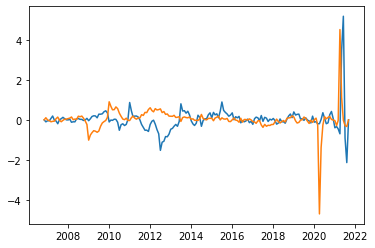

In [44]:
date_index2 = date_index1[start1:]
rrd = date_index2.shape
print(rrd, Error_out_nn_rw.shape)
plt.plot(date_index2, Error_out_rw, label='Linear')
plt.plot(date_index2, Error_out_nn_rw, label='Neural Net')
plt.plot(date_index2, Error_out_nn_rw_tf, label = 'Tensor Flow')
plt.xlabel('Date')
plt.ylabel('Error')
plt.title('Rolling Window Errors for Car Production')
plt.legend()
plt.show()


(179,) (179, 1)


NameError: name 'Error_out_nn_rw_tf' is not defined

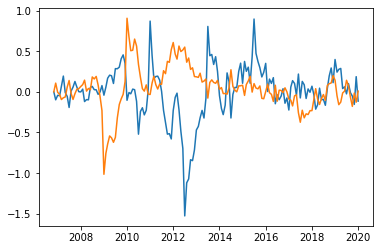

In [45]:

date_index2 = date_index1[start1:]
rrd = date_index2.shape
print(rrd, Error_out_nn_rw.shape)
plt.plot(date_index2[:-20], Error_out_rw[:-20], label='Linear')
plt.plot(date_index2[:-20], Error_out_nn_rw[:-20], label='Neural Net')
plt.plot(date_index2[:-20], Error_out_nn_rw_tf[:-20], label = 'Tensor Flow')
plt.xlabel('Date')
plt.ylabel('Error')
plt.title('Rolling Window Errors for Car Production')
plt.legend()
plt.show()
